# **Merged Dataset**

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
data=pd.read_excel(r"/content/drive/MyDrive/Cfy_dataset/group-01.xlsx")

In [ ]:
data.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [ ]:
data

,yearFrom,yearTo,month,fort_night,CLR_Incidence,T_max,T_min,RH,RF,%OC,P,K,pH,spacing,Age,Yeild
0,2015,2016,April,1st,1.91,29.88,19.07,82.07,76.1,7.50,18.0,286.0,7.0,81,70,300
1,2015,2016,April,2nd,4.96,29.67,18.97,83.47,193.7,6.60,78.0,63.0,5.5,36,80,290
2,2015,2016,May,1st,5.52,29.67,18.93,84.20,288.7,6.60,77.0,125.0,6.0,81,67,285
3,2015,2016,May,2nd,10.26,29.50,19.47,85.94,318.3,6.60,69.0,338.0,5.8,81,15,268
4,2015,2016,June,1st,22.88,28.80,19.40,83.87,321.1,6.60,16.0,163.0,5.6,36,15,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571,2022,2023,Junary,2nd,3.34,29.03,13.50,85.50,3859.8,4.01,92.0,408.0,5.5,200,10,346
572,2022,2023,February,1st,3.83,31.30,16.23,67.46,3859.8,4.01,92.0,600.0,5.7,25,26,346
573,2022,2023,February,2nd,0.89,32.07,15.26,72.69,3859.8,4.01,92.0,612.0,4.7,25,31,350
574,2022,2023,March,1st,0.00,33.30,16.73,87.60,3859.8,4.01,91.0,464.0,5.9,25,22,350


In [ ]:
data=data.replace(["Junary","February","March","April","May","June","July","August","September","October","November","December","1st","2nd"],[0,1,2,3,4,5,6,7,8,9,10,11,0,1,])

In [ ]:
data.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [ ]:
X = data.drop(columns=["Yeild"]) # Features
y = data["Yeild"] # Target variable

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, multiplelinear
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
from math import sqrt
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge, ElasticNetCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn import linear_model
import matplotlib.pyplot as plt

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model initialization and training
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluation
train_rmse = mean_squared_error(y_train, y_pred_train, squared=False)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

Train RMSE: 47.158017230467514
Test RMSE: 43.90916445687002


In [ ]:
def plot_actual_vs_predicted(y_actual, y_predicted, model_name):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_actual, y_predicted, marker='o', color='blue', alpha=0.5, label='Data Points')
    plt.title(f'Actual vs Predicted Yield ({model_name})')
    plt.xlabel('Actual Yield')
    plt.ylabel('Predicted Yield')
    plt.grid(True)

    # Add a line of best fit
    x_line = np.linspace(min(y_actual), max(y_actual), 100)
    y_line = x_line
    plt.plot(x_line, y_line, color='red', linestyle='--', label='Line of Best Fit')

    plt.legend()
    plt.show()

In [ ]:
# define regression function
def regression(X_train, X_test, y_train, y_test):
    Regressor = {
        'Linear Regression':LinearRegression(),
        'Supprt Vector Regressor':SVR(kernel='rbf'),
        'KNN':KNeighborsRegressor(n_neighbors=2),
        'Lasso':linear_model.Lasso(alpha=0.1),
        'Decisin Tree regresson':DecisionTreeRegressor(random_state=0),
        'Random Forest Regressor': RandomForestRegressor(n_estimators=200),
        'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=500),
        'ExtraTrees Regressor': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
        'Bayesian Ridge': BayesianRidge(),
        'Elastic Net CV': ElasticNetCV()
    }


    for name, clf in Regressor.items():
        print(name)
        clf.fit(X_train, y_train)
        print(f'R2: {r2_score(y_test, clf.predict(X_test)):.2f}')
        print(f'MAE: {mean_absolute_error(y_test, clf.predict(X_test)):.2f}')
        print(f'MSE: {mean_squared_error(y_test, clf.predict(X_test)):.2f}')
        print(f'RMSE: {sqrt(mean_squared_error(y_test, clf.predict(X_test))):.2f}')
        y_pred = clf.predict(X_test)
        plot_actual_vs_predicted(y_test, y_pred, name)
        print()

Linear Regression
R2: 0.17
MAE: 36.02
MSE: 1928.01
RMSE: 43.91


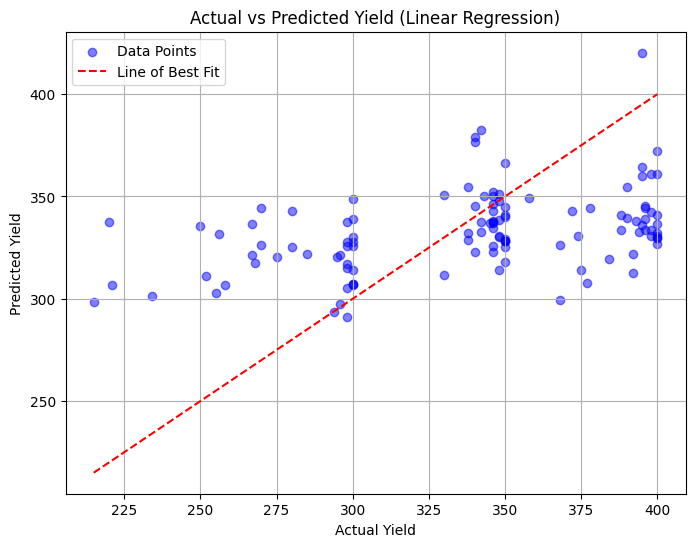


Supprt Vector Regressor
R2: -0.02
MAE: 39.93
MSE: 2375.05
RMSE: 48.73


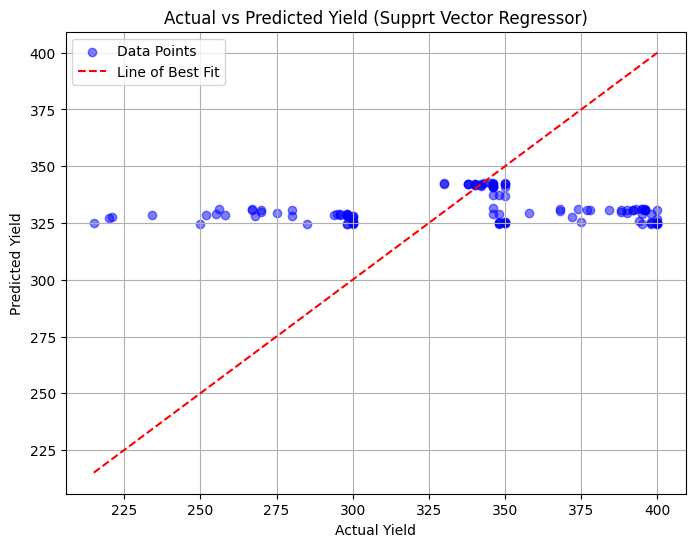


KNN
R2: 0.02
MAE: 29.88
MSE: 2283.30
RMSE: 47.78


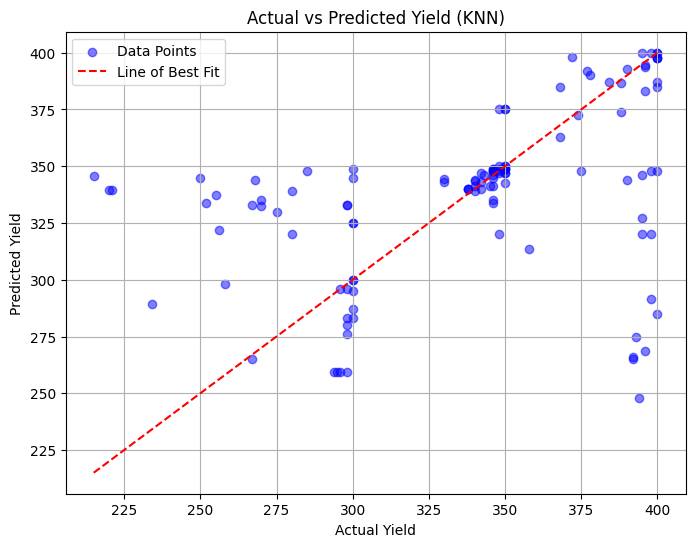


Lasso
R2: 0.17
MAE: 35.99
MSE: 1924.35
RMSE: 43.87


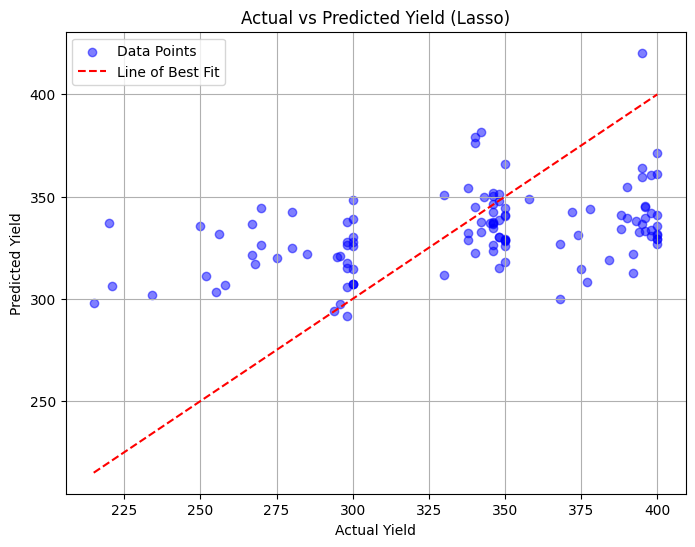


Decisin Tree regresson
R2: 0.35
MAE: 18.75
MSE: 1523.75
RMSE: 39.04


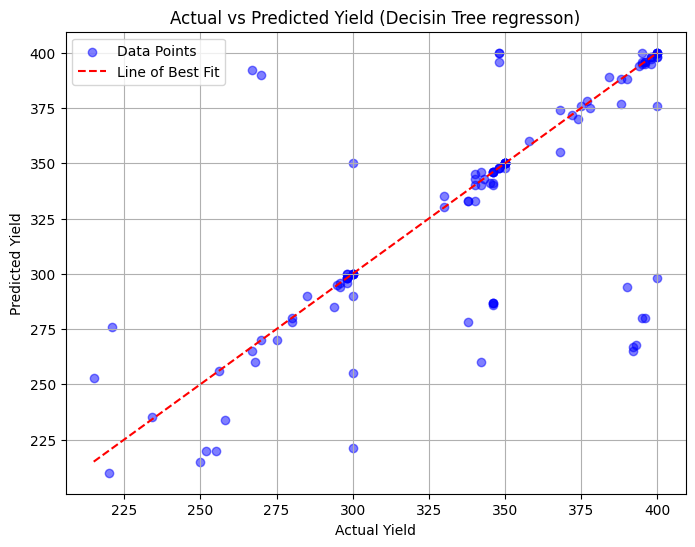


Random Forest Regressor
R2: 0.68
MAE: 13.19
MSE: 736.56
RMSE: 27.14


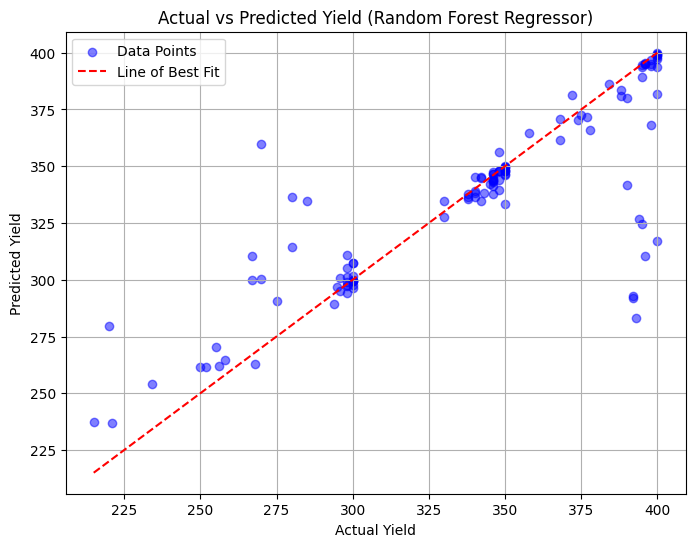


Gradient Boosting Regressor
R2: 0.64
MAE: 16.71
MSE: 839.33
RMSE: 28.97


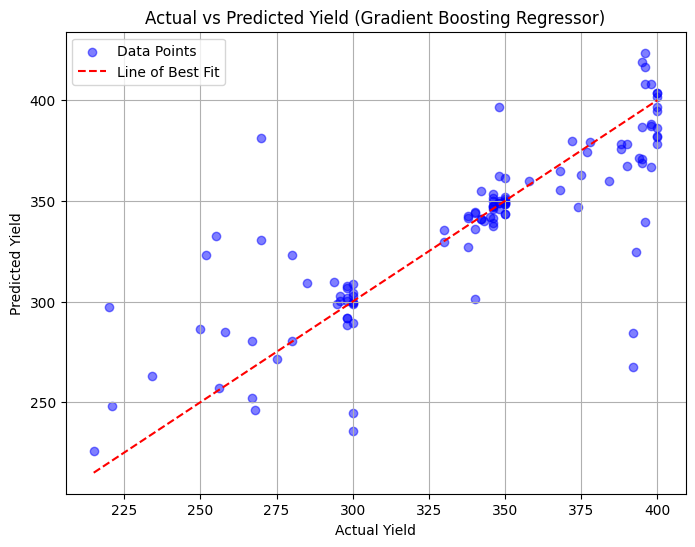


ExtraTrees Regressor
R2: 0.61
MAE: 13.75
MSE: 903.86
RMSE: 30.06


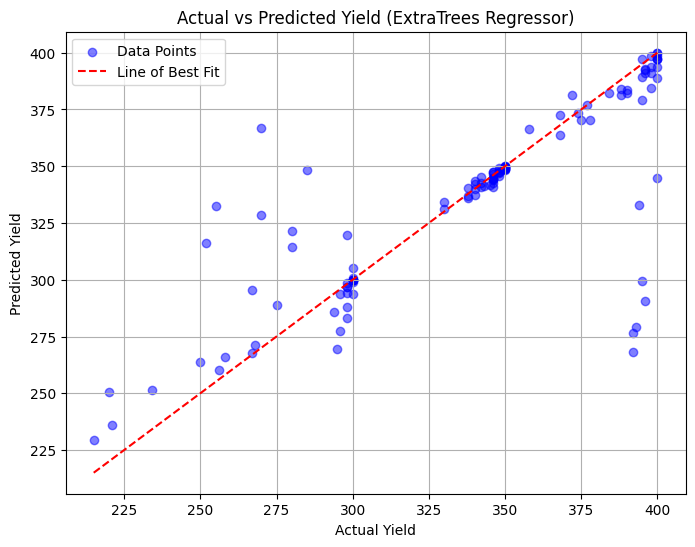


Bayesian Ridge
R2: 0.14
MAE: 37.29
MSE: 2010.14
RMSE: 44.83


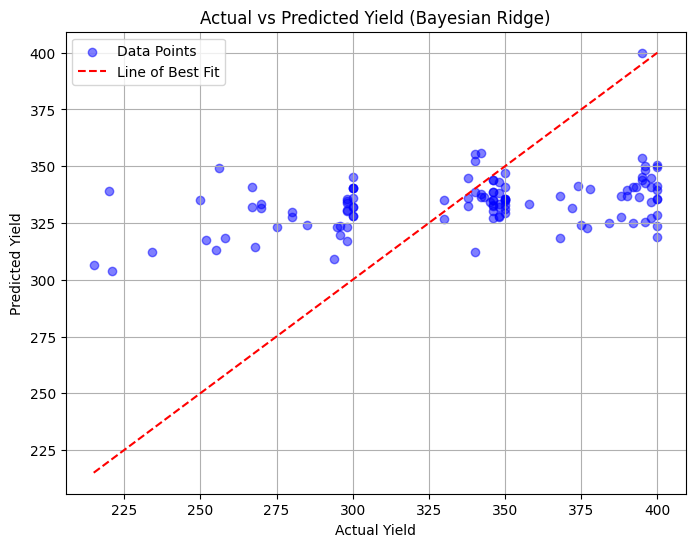


Elastic Net CV
R2: 0.18
MAE: 36.02
MSE: 1908.46
RMSE: 43.69


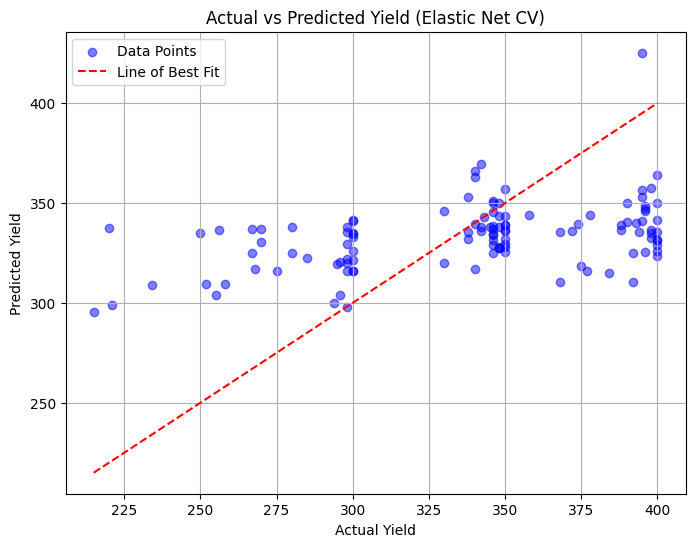

In [ ]:
regression(X_train, X_test, y_train, y_test)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit the scaler to the numerical data
scaler.fit(X_train)

# Transform the numerical columns using the scaler
X_train_selected = scaler.transform(X_train)
X_test_selected = scaler.transform(X_test)

Linear Regression
R2: 0.16
MAE: 35.22
MSE: 1886.17
RMSE: 43.43


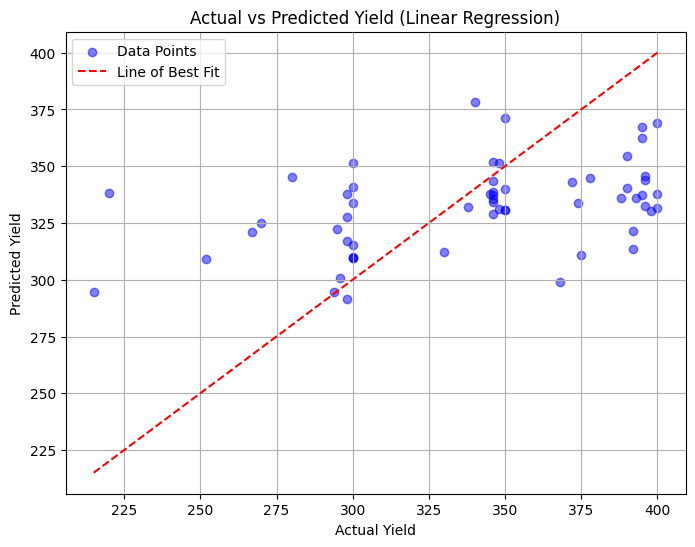


Supprt Vector Regressor
R2: 0.01
MAE: 39.43
MSE: 2240.40
RMSE: 47.33


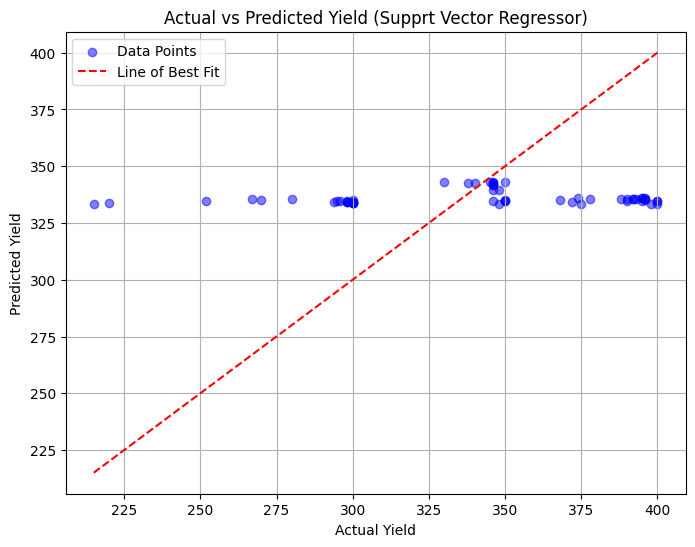


KNN
R2: -0.08
MAE: 28.74
MSE: 2423.74
RMSE: 49.23


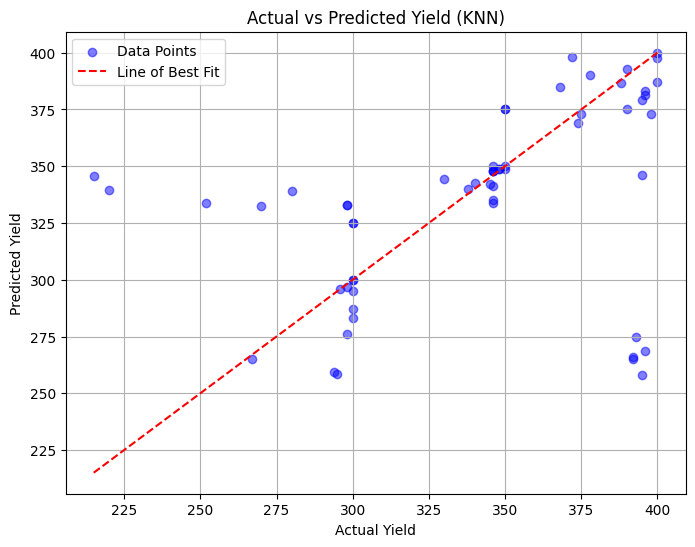


Lasso
R2: 0.17
MAE: 35.18
MSE: 1879.97
RMSE: 43.36


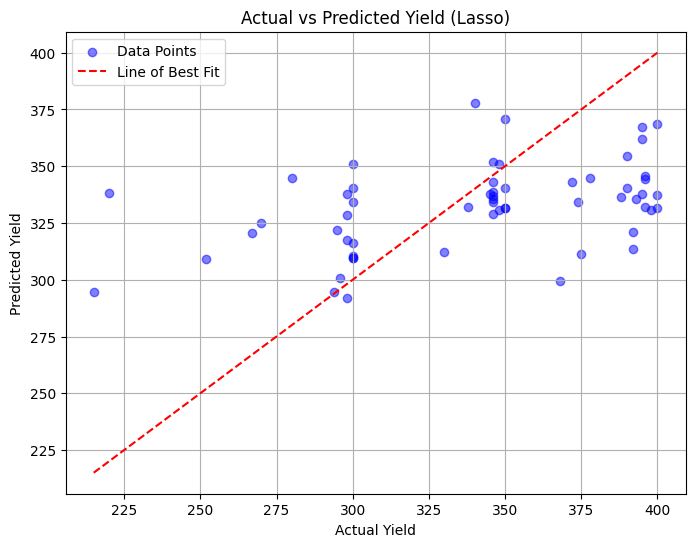


Decisin Tree regresson
R2: 0.24
MAE: 16.28
MSE: 1710.14
RMSE: 41.35


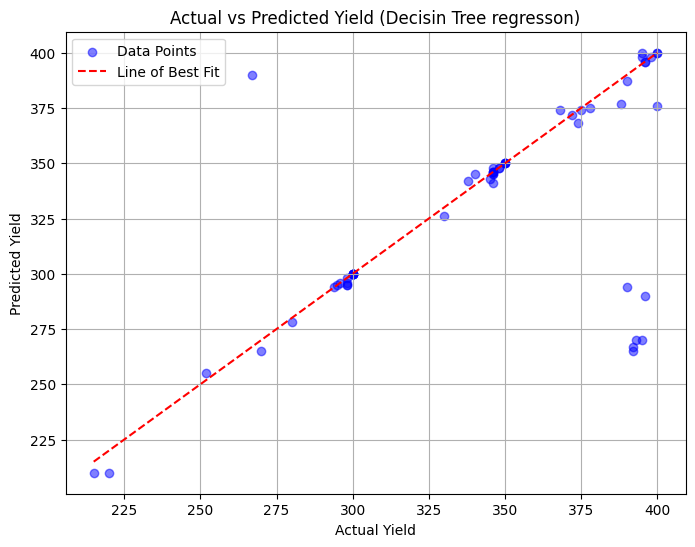


Random Forest Regressor
R2: 0.52
MAE: 15.52
MSE: 1083.10
RMSE: 32.91


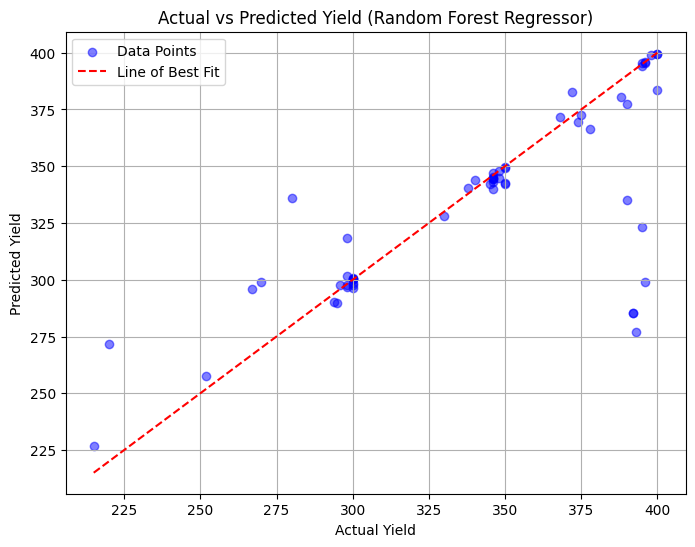


Gradient Boosting Regressor
R2: 0.58
MAE: 16.04
MSE: 940.10
RMSE: 30.66


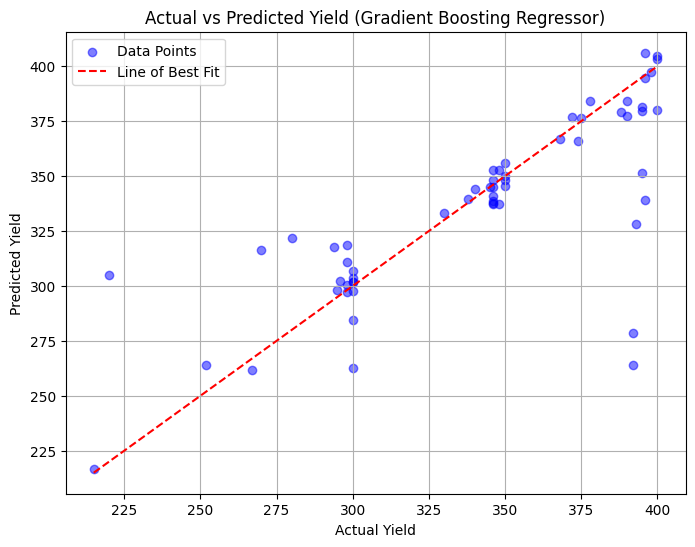


ExtraTrees Regressor
R2: 0.49
MAE: 14.97
MSE: 1159.54
RMSE: 34.05


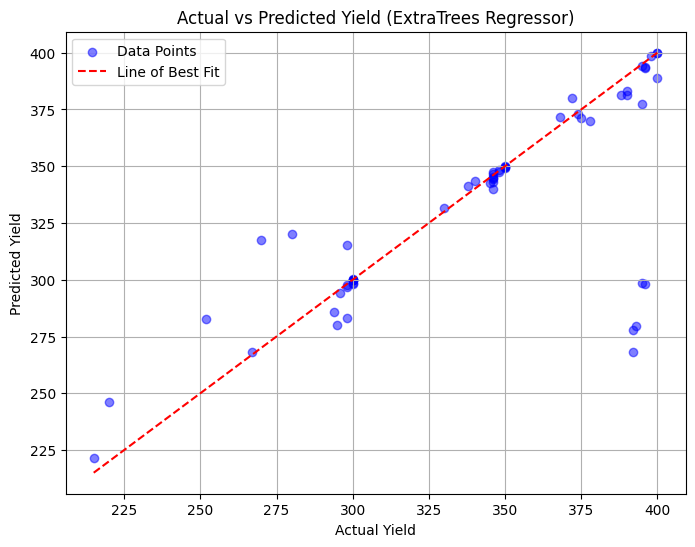


Bayesian Ridge
R2: 0.13
MAE: 37.04
MSE: 1958.85
RMSE: 44.26


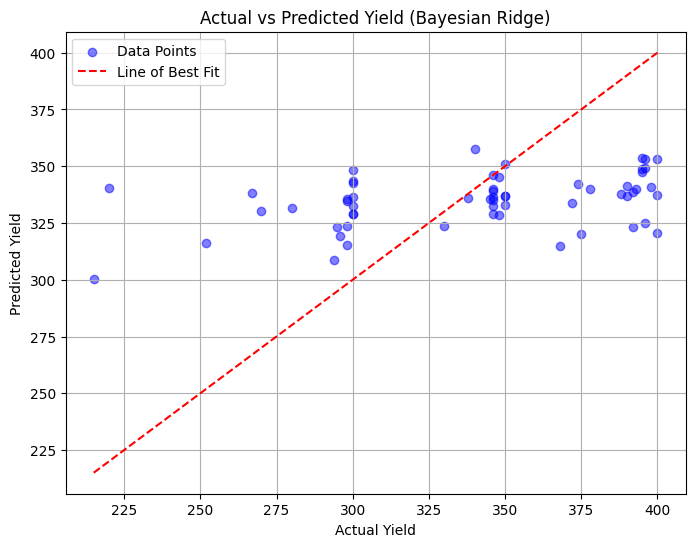


Elastic Net CV
R2: 0.17
MAE: 35.25
MSE: 1860.33
RMSE: 43.13


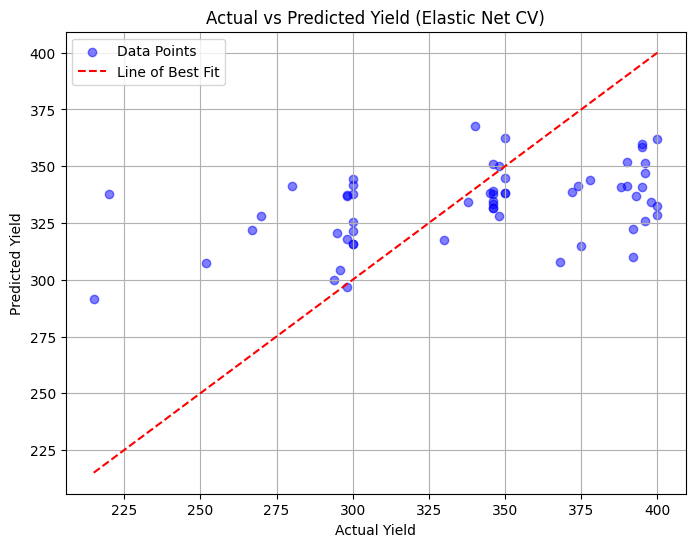

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.17
MAE: 36.02
MSE: 1928.01
RMSE: 43.91


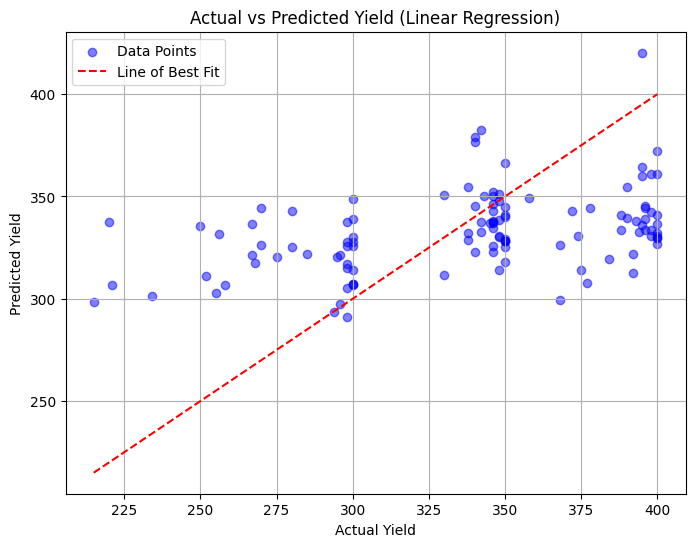


Supprt Vector Regressor
R2: -0.02
MAE: 39.93
MSE: 2375.05
RMSE: 48.73


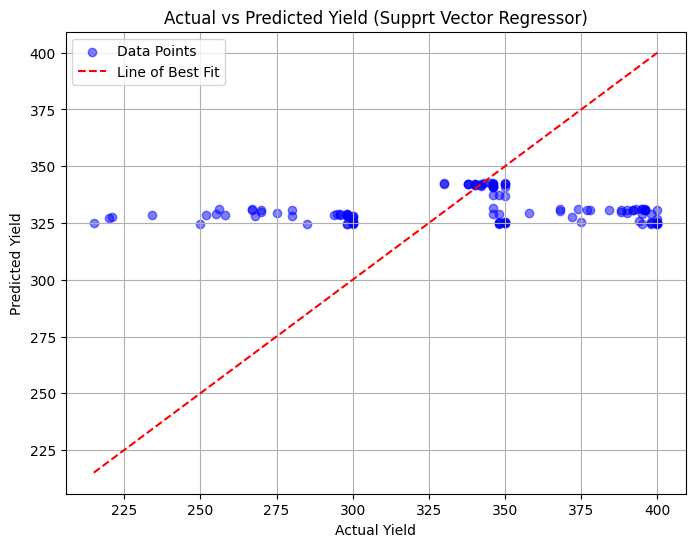


KNN
R2: 0.02
MAE: 29.88
MSE: 2283.30
RMSE: 47.78


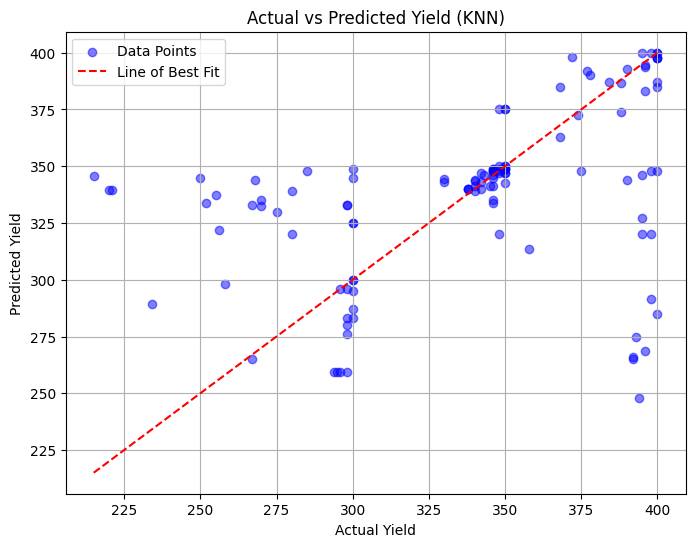


Lasso
R2: 0.17
MAE: 35.99
MSE: 1924.35
RMSE: 43.87


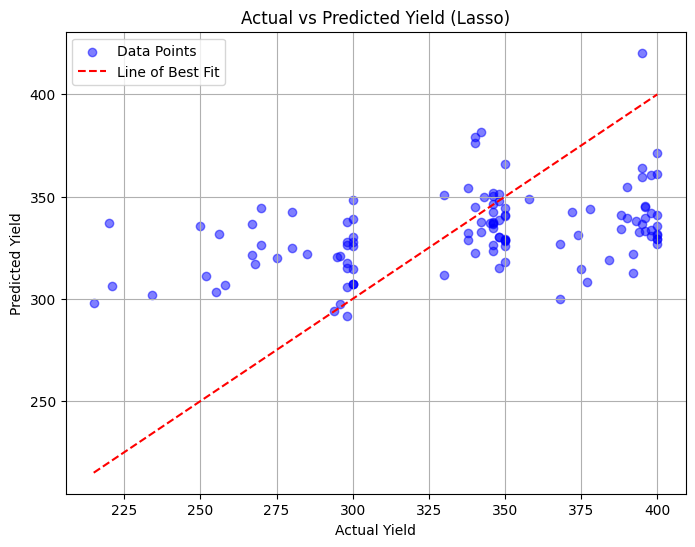


Decisin Tree regresson
R2: 0.35
MAE: 18.75
MSE: 1523.75
RMSE: 39.04


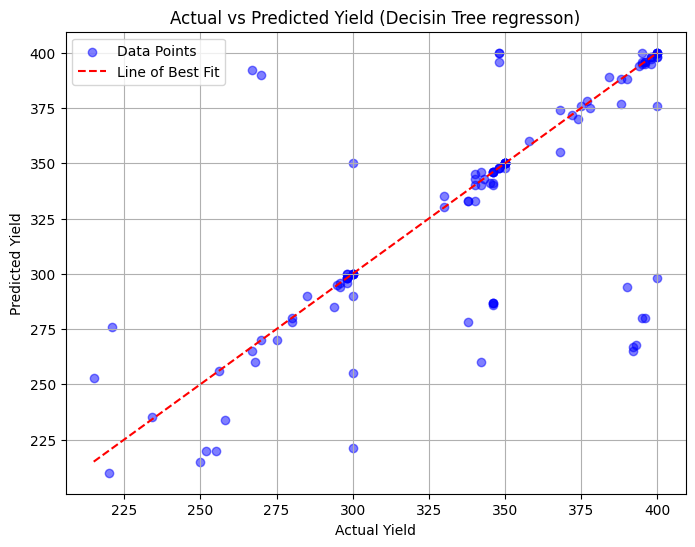


Random Forest Regressor
R2: 0.66
MAE: 13.74
MSE: 787.22
RMSE: 28.06


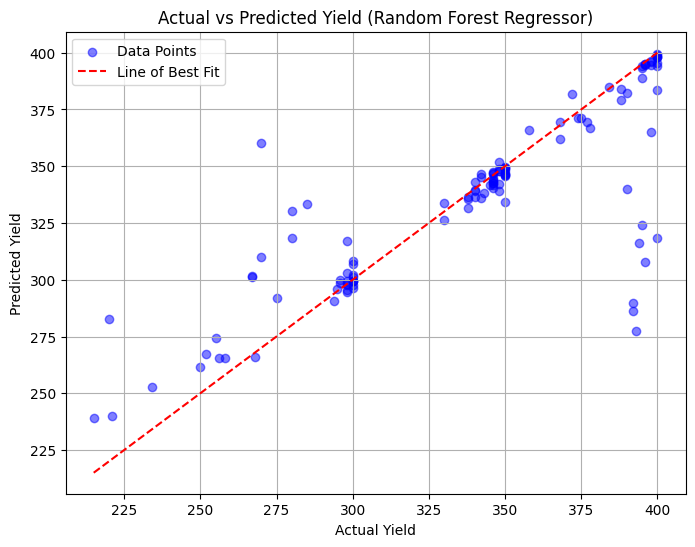


Gradient Boosting Regressor
R2: 0.64
MAE: 16.78
MSE: 837.87
RMSE: 28.95


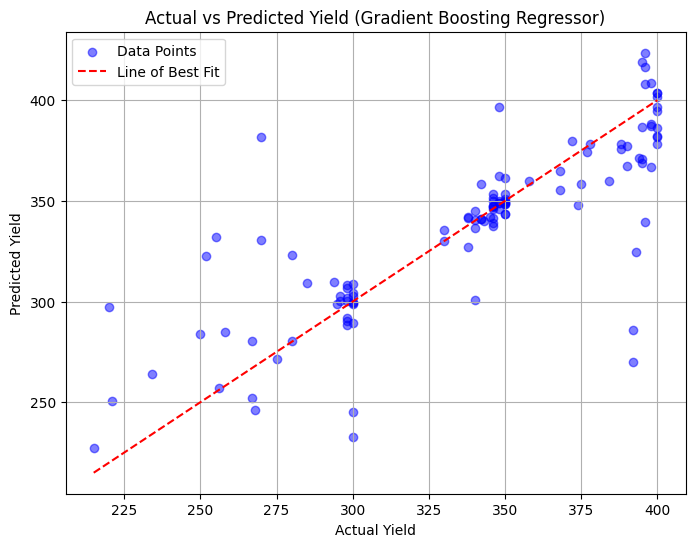


ExtraTrees Regressor
R2: 0.62
MAE: 13.40
MSE: 878.58
RMSE: 29.64


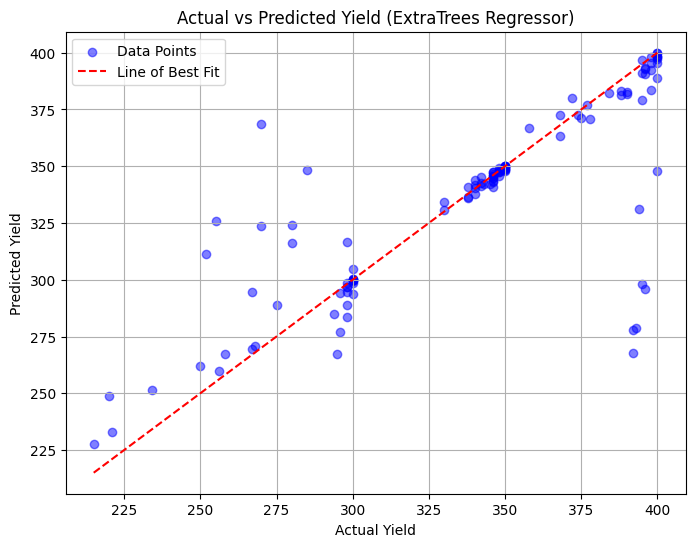


Bayesian Ridge
R2: 0.14
MAE: 37.29
MSE: 2010.14
RMSE: 44.83


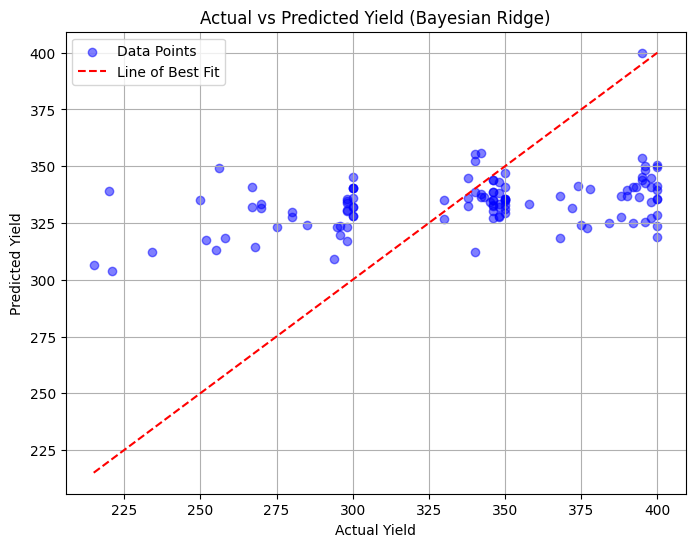


Elastic Net CV
R2: 0.18
MAE: 36.02
MSE: 1908.46
RMSE: 43.69


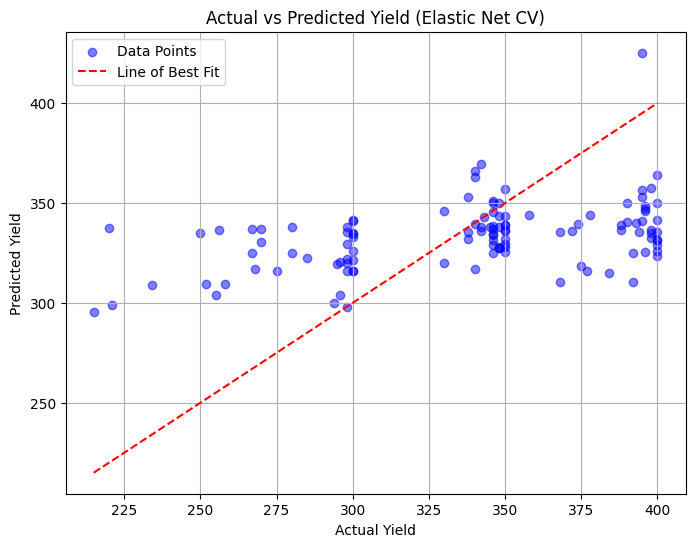

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.13
MAE: 37.45
MSE: 2048.23
RMSE: 45.26


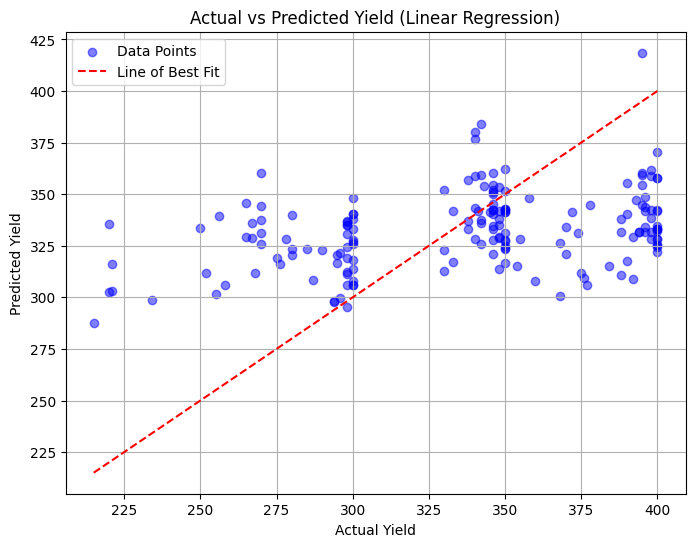


Supprt Vector Regressor
R2: -0.04
MAE: 40.69
MSE: 2448.35
RMSE: 49.48


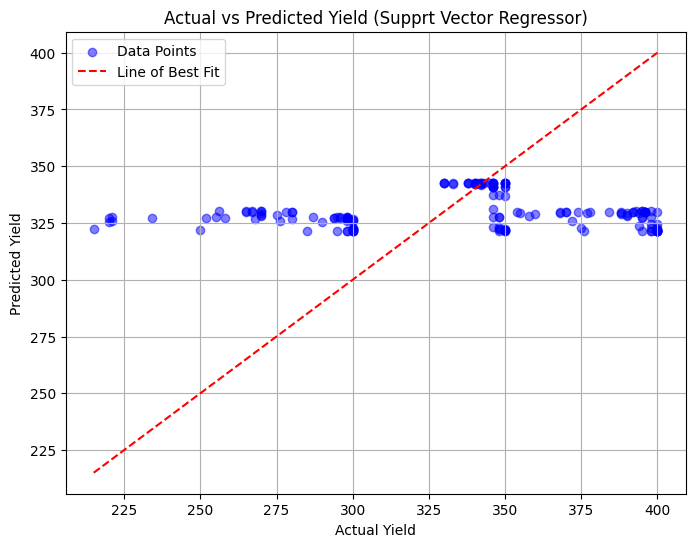


KNN
R2: 0.11
MAE: 28.31
MSE: 2094.15
RMSE: 45.76


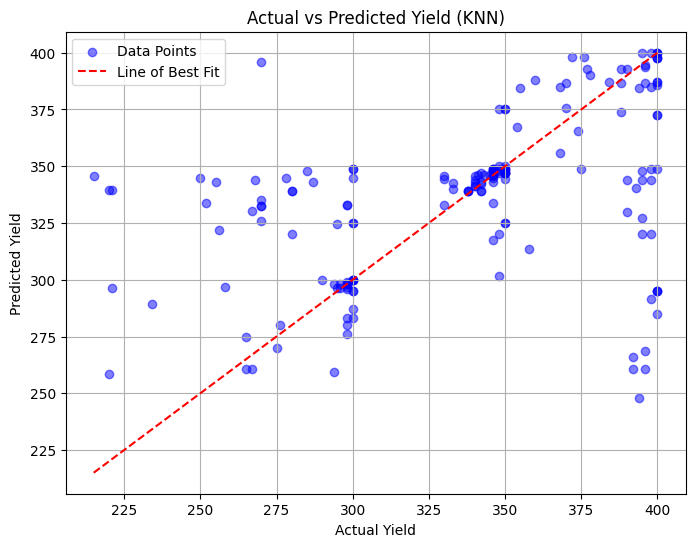


Lasso
R2: 0.13
MAE: 37.45
MSE: 2047.48
RMSE: 45.25


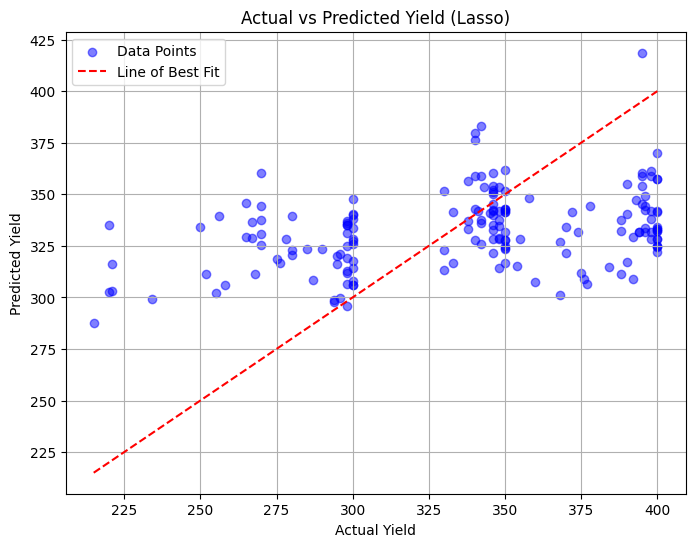


Decisin Tree regresson
R2: 0.26
MAE: 18.20
MSE: 1745.82
RMSE: 41.78


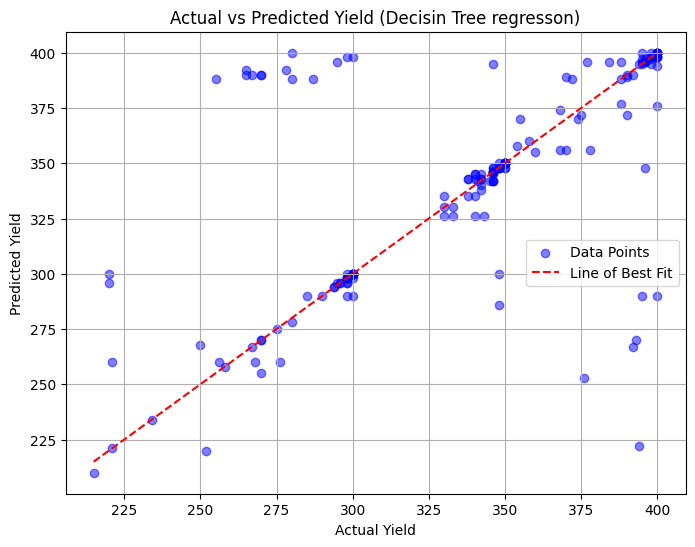


Random Forest Regressor
R2: 0.68
MAE: 16.02
MSE: 760.20
RMSE: 27.57


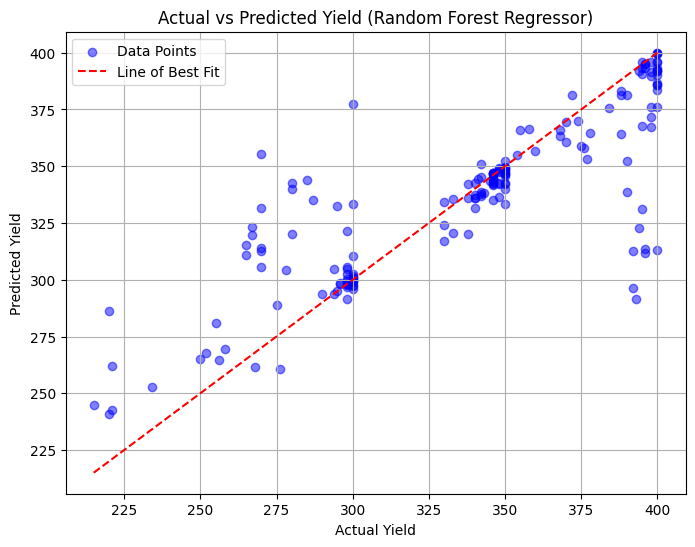


Gradient Boosting Regressor
R2: 0.66
MAE: 17.40
MSE: 791.39
RMSE: 28.13


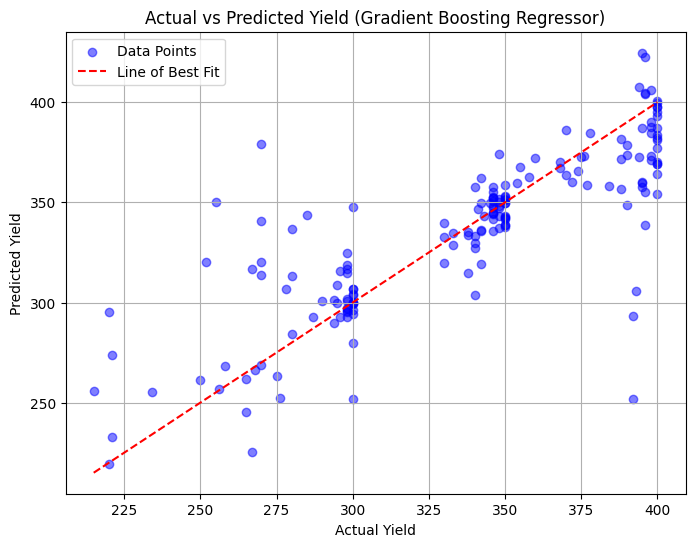


ExtraTrees Regressor
R2: 0.61
MAE: 15.16
MSE: 921.92
RMSE: 30.36


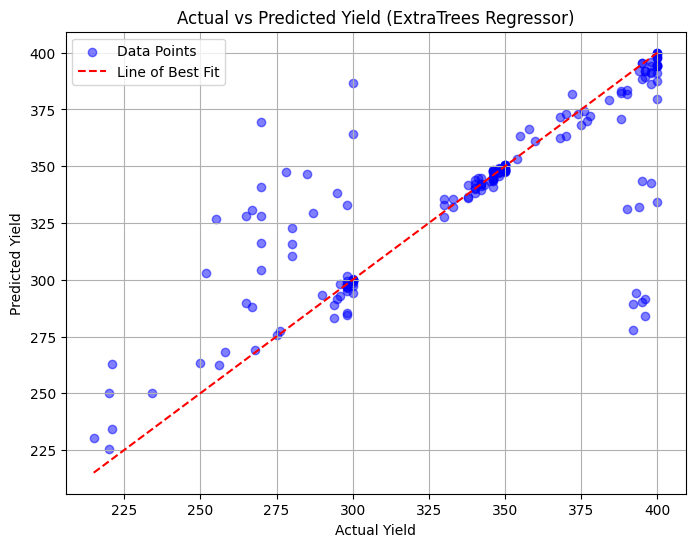


Bayesian Ridge
R2: 0.09
MAE: 38.67
MSE: 2157.26
RMSE: 46.45


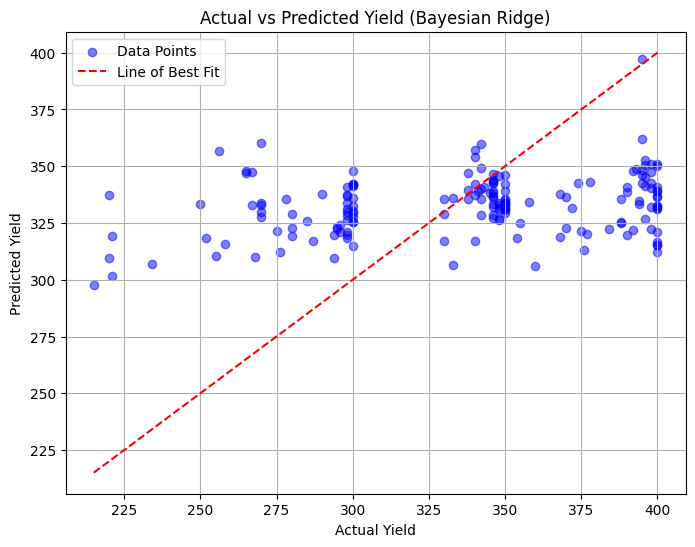


Elastic Net CV
R2: 0.12
MAE: 37.98
MSE: 2080.63
RMSE: 45.61


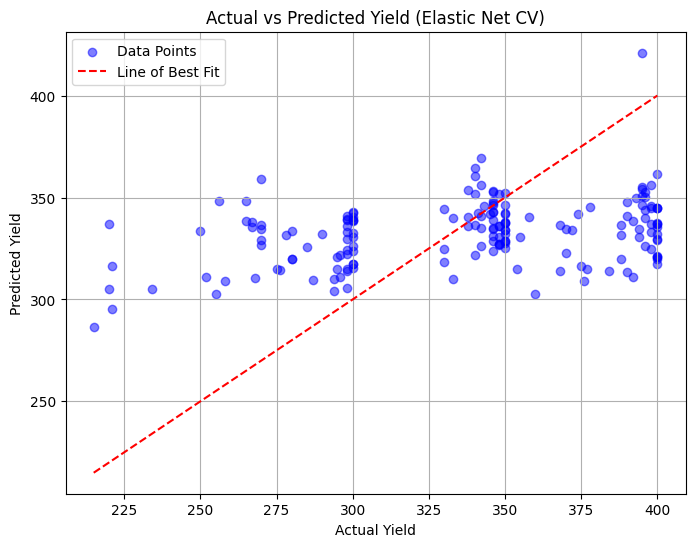

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.15
MAE: 37.42
MSE: 2025.21
RMSE: 45.00


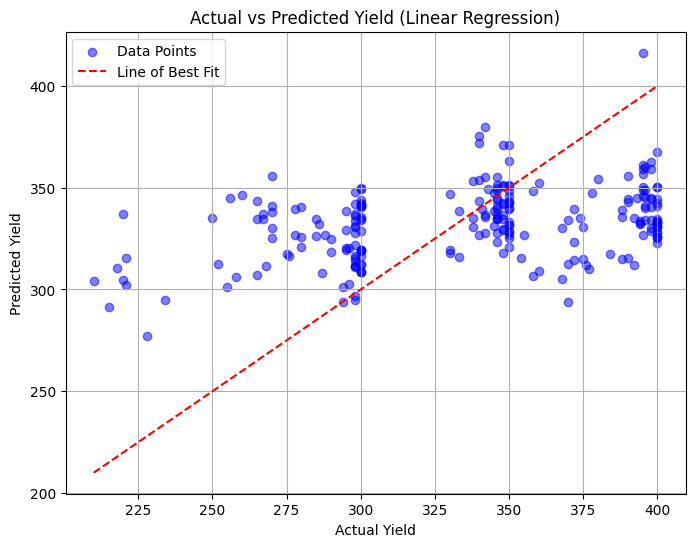


Supprt Vector Regressor
R2: 0.00
MAE: 40.81
MSE: 2392.13
RMSE: 48.91


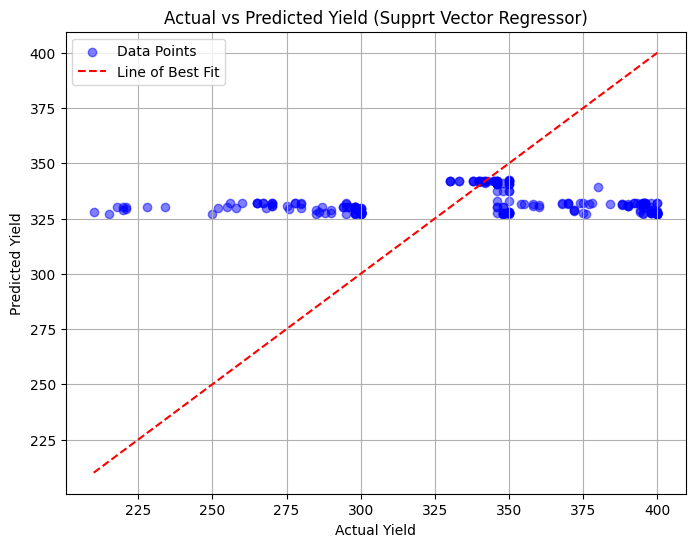


KNN
R2: 0.22
MAE: 27.32
MSE: 1867.27
RMSE: 43.21


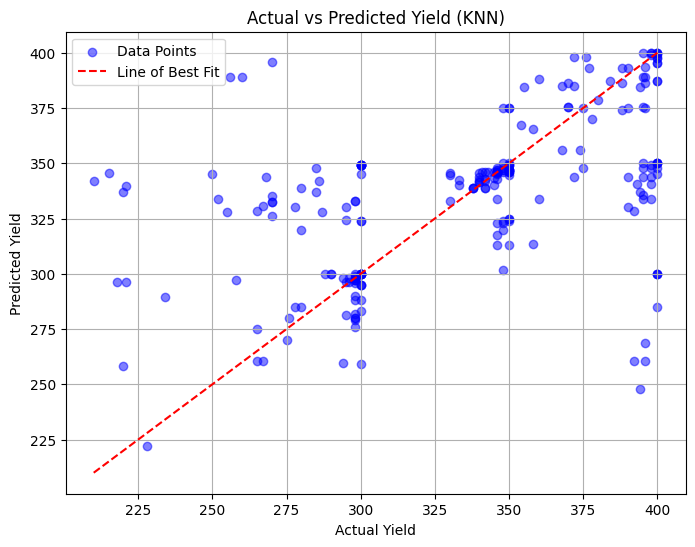


Lasso
R2: 0.15
MAE: 37.43
MSE: 2025.94
RMSE: 45.01


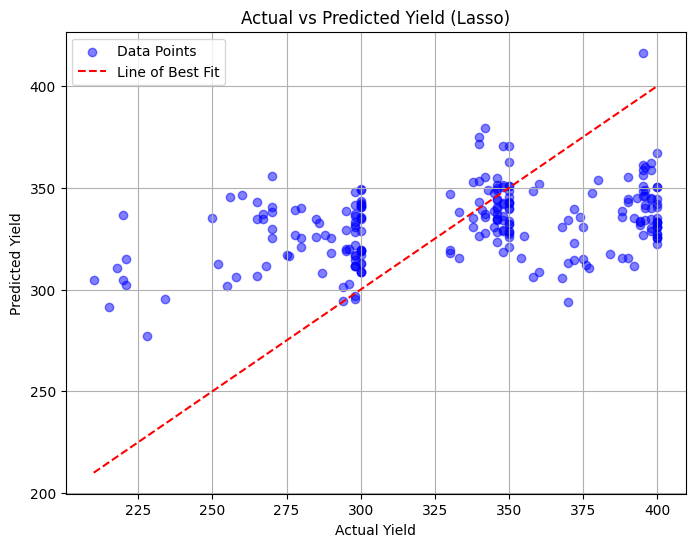


Decisin Tree regresson
R2: 0.17
MAE: 21.10
MSE: 1996.29
RMSE: 44.68


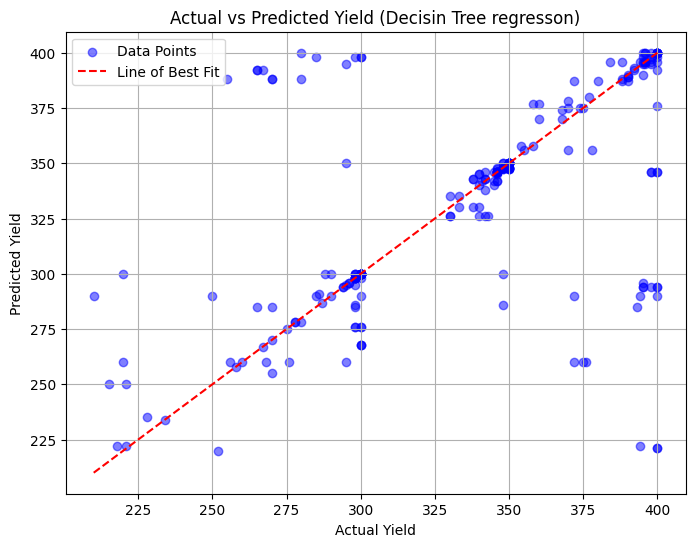


Random Forest Regressor
R2: 0.68
MAE: 16.73
MSE: 755.74
RMSE: 27.49


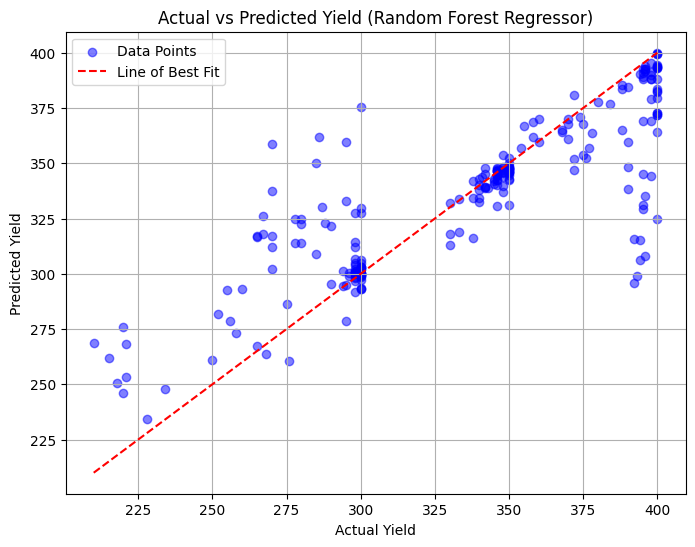


Gradient Boosting Regressor
R2: 0.60
MAE: 19.89
MSE: 968.97
RMSE: 31.13


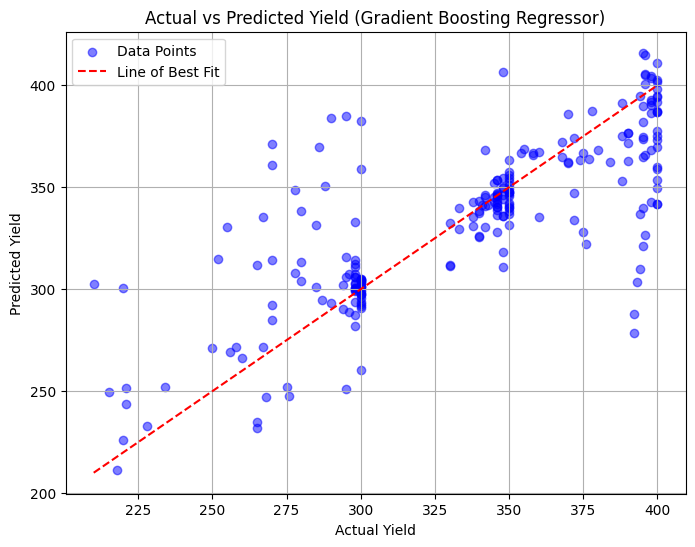


ExtraTrees Regressor
R2: 0.62
MAE: 15.22
MSE: 904.65
RMSE: 30.08


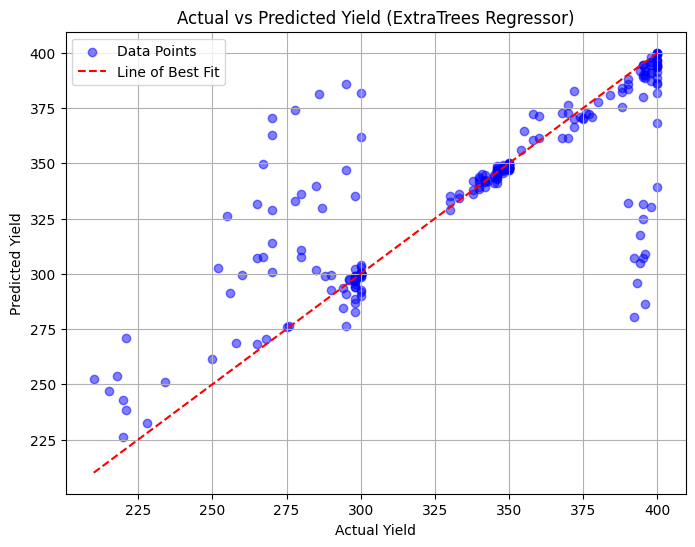


Bayesian Ridge
R2: 0.08
MAE: 39.15
MSE: 2193.53
RMSE: 46.84


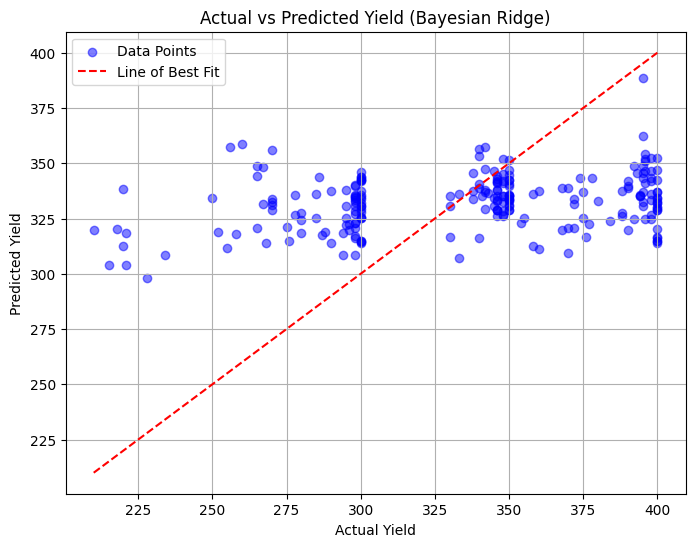


Elastic Net CV
R2: 0.11
MAE: 38.38
MSE: 2118.44
RMSE: 46.03


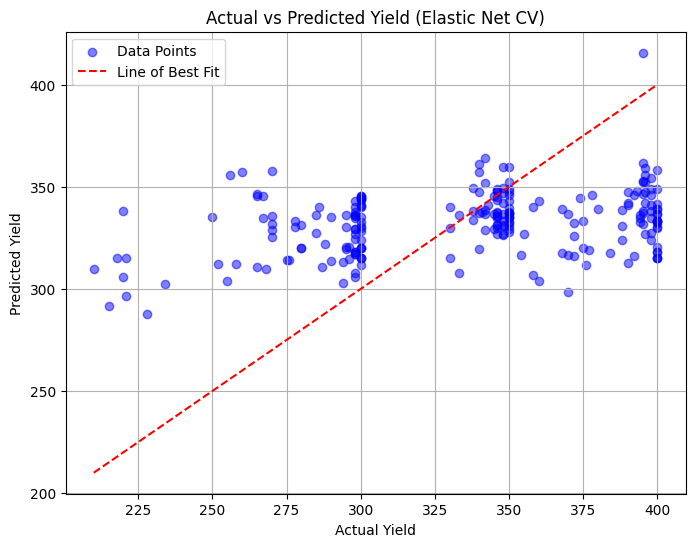

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.14
MAE: 37.92
MSE: 2052.68
RMSE: 45.31


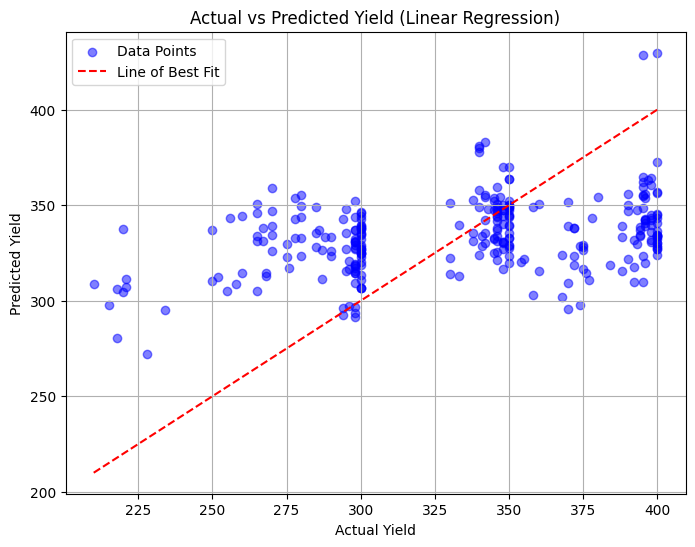


Supprt Vector Regressor
R2: 0.01
MAE: 40.68
MSE: 2359.93
RMSE: 48.58


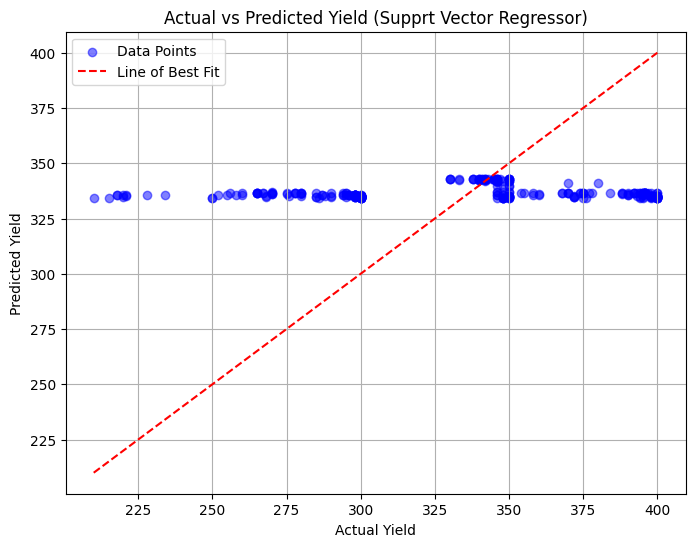


KNN
R2: 0.04
MAE: 31.16
MSE: 2277.21
RMSE: 47.72


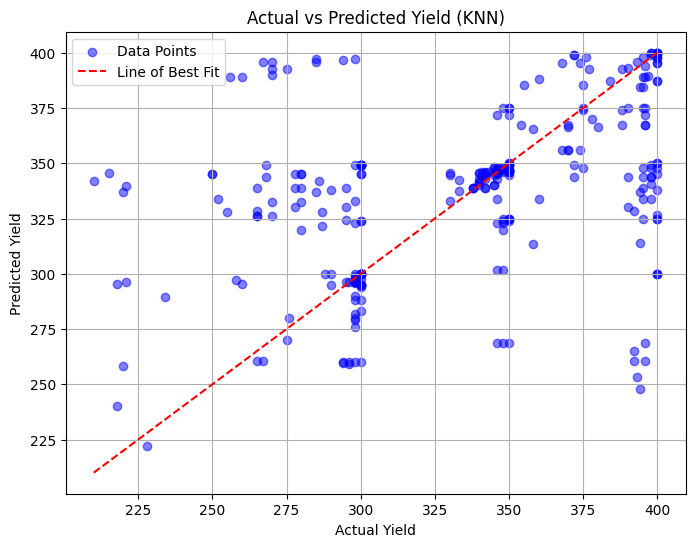


Lasso
R2: 0.14
MAE: 37.92
MSE: 2052.53
RMSE: 45.30


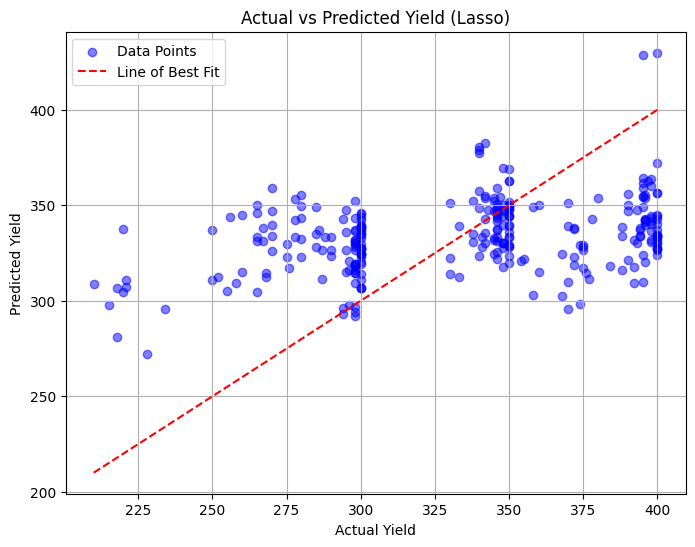


Decisin Tree regresson
R2: -0.05
MAE: 27.14
MSE: 2483.85
RMSE: 49.84


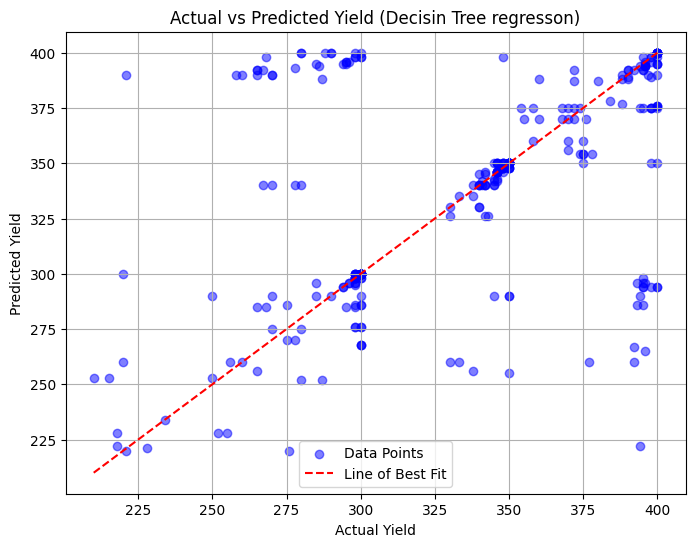


Random Forest Regressor
R2: 0.56
MAE: 20.20
MSE: 1053.68
RMSE: 32.46


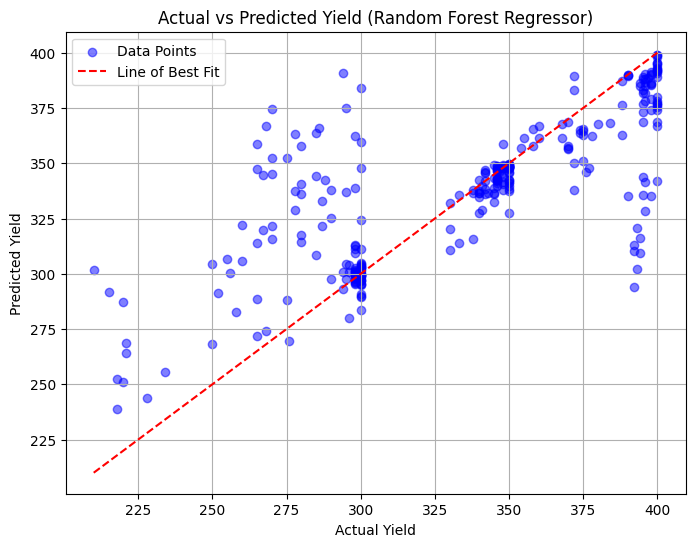


Gradient Boosting Regressor
R2: 0.56
MAE: 21.13
MSE: 1040.64
RMSE: 32.26


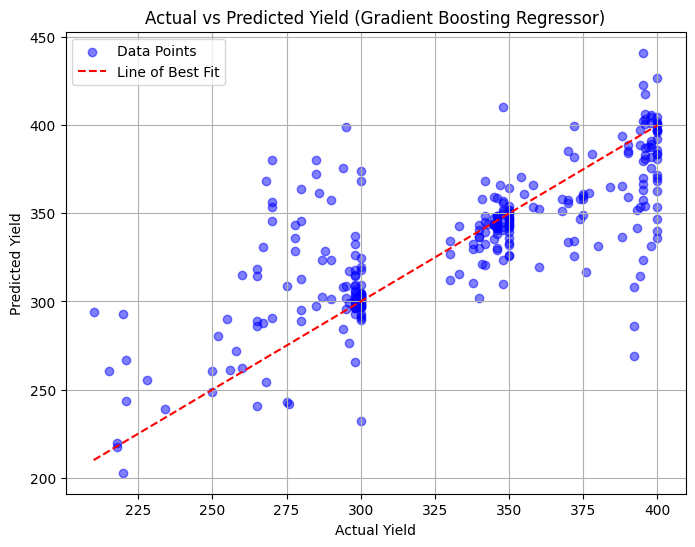


ExtraTrees Regressor
R2: 0.51
MAE: 17.83
MSE: 1152.74
RMSE: 33.95


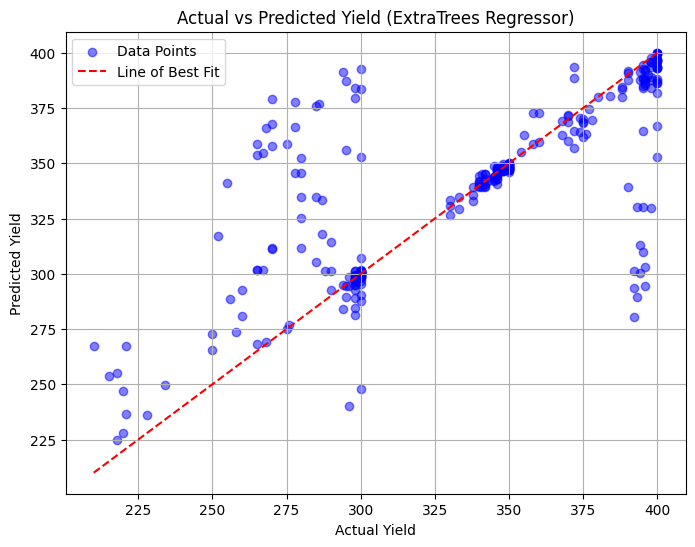


Bayesian Ridge
R2: 0.08
MAE: 39.52
MSE: 2183.94
RMSE: 46.73


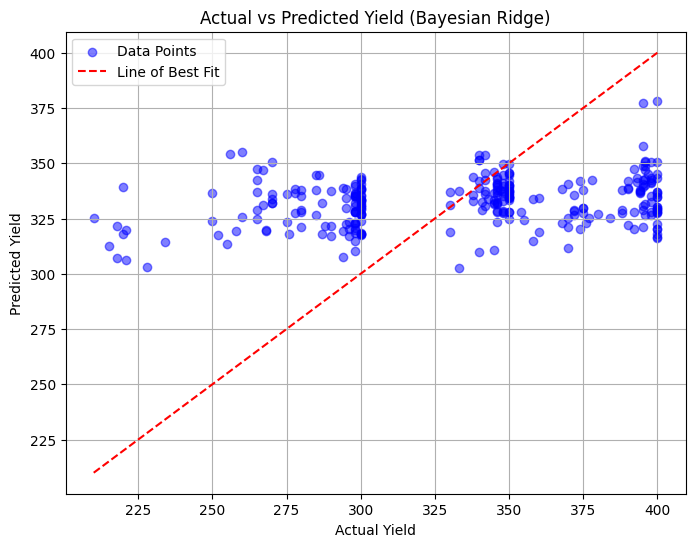


Elastic Net CV
R2: 0.08
MAE: 39.34
MSE: 2172.64
RMSE: 46.61


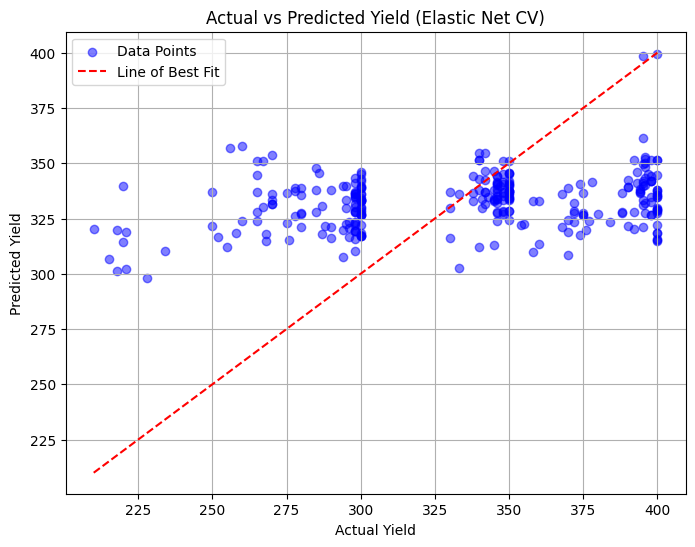

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
regression(X_train, X_test, y_train, y_test)

# **C*R**

In [1]:
import numpy as np
import pandas as pd

In [2]:
data1=pd.read_excel(r"/content/drive/MyDrive/Cfy_dataset/group-01_CR.xlsx")

In [3]:
data1.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [4]:
data1

,yearFrom,yearTo,month,fort_night,CLR_Incidence,T_max,T_min,RH,RF,%OC,P,K,pH,spacing,Age,Yeild
0,2015,2016,April,1st,1.91,29.88,19.07,82.07,76.1,7.50,18.0,286.0,7.0,81,70,300
1,2015,2016,April,2nd,4.96,29.67,18.97,83.47,193.7,6.60,78.0,63.0,5.5,36,80,290
2,2015,2016,May,1st,5.52,29.67,18.93,84.20,288.7,6.60,77.0,125.0,6.0,81,67,285
3,2015,2016,May,2nd,10.26,29.50,19.47,85.94,318.3,6.60,69.0,338.0,5.8,81,15,268
4,2015,2016,June,1st,22.88,28.80,19.40,83.87,321.1,6.60,16.0,163.0,5.6,36,15,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2022,2023,Junary,2nd,8.45,29.03,13.50,85.50,3859.8,4.01,92.0,408.0,5.5,200,10,326
188,2022,2023,February,1st,4.08,31.30,16.23,67.46,3859.8,4.01,92.0,600.0,5.7,25,26,341
189,2022,2023,February,2nd,1.20,32.07,15.26,72.69,3859.8,4.01,92.0,612.0,4.7,25,31,342
190,2022,2023,March,1st,0.00,33.30,16.73,87.60,3859.8,4.01,91.0,464.0,5.9,25,22,345


In [5]:
data1=data1.replace(["Junary","February","March","April","May","June","July","August","September","October","November","December","1st","2nd"],[0,1,2,3,4,5,6,7,8,9,10,11,0,1,])

In [7]:
X = data1.drop(columns=["Yeild"]) # Features
y = data1["Yeild"] # Target variable

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
from math import sqrt
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge, ElasticNetCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn import linear_model
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

In [9]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model initialization and training
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluation
train_rmse = mean_squared_error(y_train, y_pred_train, squared=False)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

Train RMSE: 44.54645542659787
Test RMSE: 54.23367409387438


In [10]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)  # 60% training, 40% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # 20% validation, 20% test

train_data = pd.concat([X_train, y_train], axis=1)
val_data = pd.concat([X_val, y_val], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

In [11]:
def compute_stats(data, name):
    print(f"\n{name} Descriptive Statistics:")
    print(data.describe())

    # Compute skewness
    skewness = data.apply(lambda x: skew(x.dropna()))
    print("\nSkewness:")
    print(skewness)

    # Compute kurtosis
    kurtosis_values = data.apply(lambda x: kurtosis(x.dropna()))
    print("\nKurtosis:")
    print(kurtosis_values)

# Compute stats for the entire dataset
print("Entire Dataset Statistics:")
print(data1.describe())
print("\nSkewness of entire dataset:")
print(data1.apply(lambda x: skew(x.dropna())))
print("\nKurtosis of entire dataset:")
print(data1.apply(lambda x: kurtosis(x.dropna())))

# Compute stats for each subset
compute_stats(train_data, "Training Data")
compute_stats(val_data, "Validation Data")
compute_stats(test_data, "Testing Data")


Entire Dataset Statistics:
          yearFrom       yearTo       month  fort_night  CLR_Incidence  \
count   192.000000   192.000000  192.000000  192.000000      192.00000   
mean   2018.500000  2019.500000    5.500000    0.500000       18.38625   
std       2.297278     2.297278    3.461078    0.501307       21.10467   
min    2015.000000  2016.000000    0.000000    0.000000        0.00000   
25%    2016.750000  2017.750000    2.750000    0.000000        2.19500   
50%    2018.500000  2019.500000    5.500000    0.500000        8.99500   
75%    2020.250000  2021.250000    8.250000    1.000000       25.48250   
max    2022.000000  2023.000000   11.000000    1.000000       79.69000   

            T_max       T_min          RH           RF         %OC  \
count  192.000000  192.000000  192.000000   192.000000  192.000000   
mean    28.604063   18.356979   82.382812  1801.703125    5.782760   
std      3.146644    2.035901    8.340461  1153.231773   12.104807   
min     22.900000   12.560

In [12]:
# def plot_actual_vs_predicted(y_actual, y_predicted, model_name):
#     plt.figure(figsize=(8, 6))
#     plt.scatter(y_actual, y_predicted, marker='o', color='blue', alpha=0.5, label='Data Points')
#     plt.title(f'Actual vs Predicted Yield ({model_name})')
#     plt.xlabel('Actual Yield')
#     plt.ylabel('Predicted Yield')
#     plt.grid(True)

#     # Add a line of best fit
#     x_line = np.linspace(min(y_actual), max(y_actual), 100)
#     y_line = x_line
#     plt.plot(x_line, y_line, color='red', linestyle='--', label='Line of Best Fit')

#     plt.legend()
#     plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_actual_vs_predicted(y_actual, y_predicted, model_name):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_actual, y_predicted, marker='o', color='green', alpha=0.5, label='Data Points')
    plt.title(f'Actual vs Predicted Yield ({model_name})')
    plt.xlabel('Actual Yield')
    plt.ylabel('Predicted Yield')
    plt.grid(True)

    # Calculate the best fit line
    m, b = np.polyfit(y_actual, y_predicted, 1)
    y_fit = m * np.array(y_actual) + b

    # plt.plot(y_actual, y_fit, 0.10,0.95, label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Add a line y = x for reference (perfect predictions line)
    x_line = np.linspace(min(y_actual), max(y_actual), 100)
    plt.plot(x_line, x_line, color='red', linestyle='-', label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Calculate R² value
    r_squared = r2_score(y_actual, y_predicted)

    # Annotate R² value on the plot
    plt.text(0.02,0.83, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.5))

    plt.legend()
    plt.show()

# Example usage:
# plot_actual_vs_predicted(y_test, y_pred, "Linear Regression")


In [13]:
# define regression function
def regression(X_train, X_test, y_train, y_test):
    Regressor = {
        'Linear Regression':LinearRegression(),
        'Supprt Vector Regressor':SVR(kernel='rbf'),
        'KNN':KNeighborsRegressor(n_neighbors=2),
        'Lasso':linear_model.Lasso(alpha=0.1),
        'Decisin Tree regresson':DecisionTreeRegressor(random_state=0),
        'Random Forest Regressor': RandomForestRegressor(n_estimators=200),
        'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=500),
        'ExtraTrees Regressor': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
        'Bayesian Ridge': BayesianRidge(),
        'Elastic Net CV': ElasticNetCV()
    }


    for name, clf in Regressor.items():
        print(name)
        clf.fit(X_train, y_train)
        print(f'R2: {r2_score(y_test, clf.predict(X_test)):.2f}')
        print(f'MAE: {mean_absolute_error(y_test, clf.predict(X_test)):.2f}')
        print(f'MSE: {mean_squared_error(y_test, clf.predict(X_test)):.2f}')
        print(f'RMSE: {sqrt(mean_squared_error(y_test, clf.predict(X_test))):.2f}')
        y_pred = clf.predict(X_test)
        plot_actual_vs_predicted(y_test, y_pred, name)
        print()

In [ ]:
rf_model = RandomForestRegressor(n_estimators=200, random_state=42)
rf_model.fit(X_train, y_train)
for i, tree in enumerate(rf_model.estimators_):
    num_leaves = tree.tree_.n_leaves
    print(f'Tree {i + 1} has {num_leaves} leaves')

Tree 1 has 52 leaves
Tree 2 has 43 leaves
Tree 3 has 49 leaves
Tree 4 has 47 leaves
Tree 5 has 39 leaves
Tree 6 has 51 leaves
Tree 7 has 46 leaves
Tree 8 has 47 leaves
Tree 9 has 46 leaves
Tree 10 has 44 leaves
Tree 11 has 45 leaves
Tree 12 has 42 leaves
Tree 13 has 48 leaves
Tree 14 has 48 leaves
Tree 15 has 50 leaves
Tree 16 has 51 leaves
Tree 17 has 42 leaves
Tree 18 has 52 leaves
Tree 19 has 43 leaves
Tree 20 has 49 leaves
Tree 21 has 47 leaves
Tree 22 has 42 leaves
Tree 23 has 48 leaves
Tree 24 has 47 leaves
Tree 25 has 46 leaves
Tree 26 has 50 leaves
Tree 27 has 47 leaves
Tree 28 has 44 leaves
Tree 29 has 44 leaves
Tree 30 has 50 leaves
Tree 31 has 43 leaves
Tree 32 has 49 leaves
Tree 33 has 48 leaves
Tree 34 has 50 leaves
Tree 35 has 41 leaves
Tree 36 has 48 leaves
Tree 37 has 45 leaves
Tree 38 has 55 leaves
Tree 39 has 44 leaves
Tree 40 has 44 leaves
Tree 41 has 43 leaves
Tree 42 has 45 leaves
Tree 43 has 46 leaves
Tree 44 has 53 leaves
Tree 45 has 46 leaves
Tree 46 has 47 leav

Linear Regression
R2: 0.19
MAE: 36.15
MSE: 2008.93
RMSE: 44.82


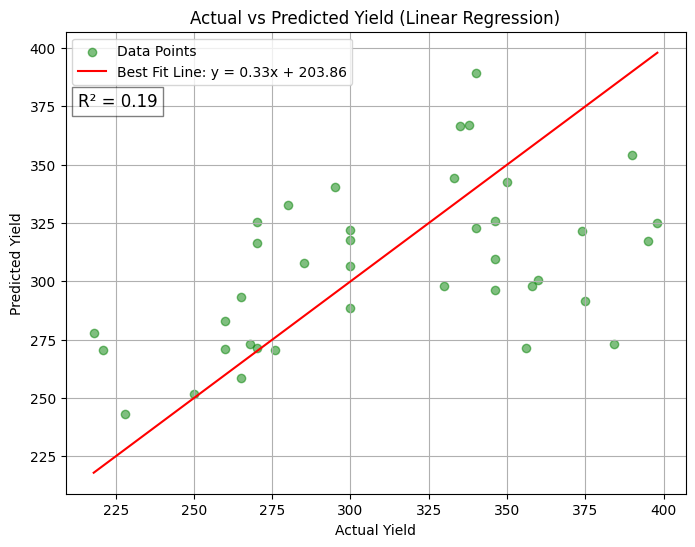


Supprt Vector Regressor
R2: -0.00
MAE: 42.21
MSE: 2492.40
RMSE: 49.92


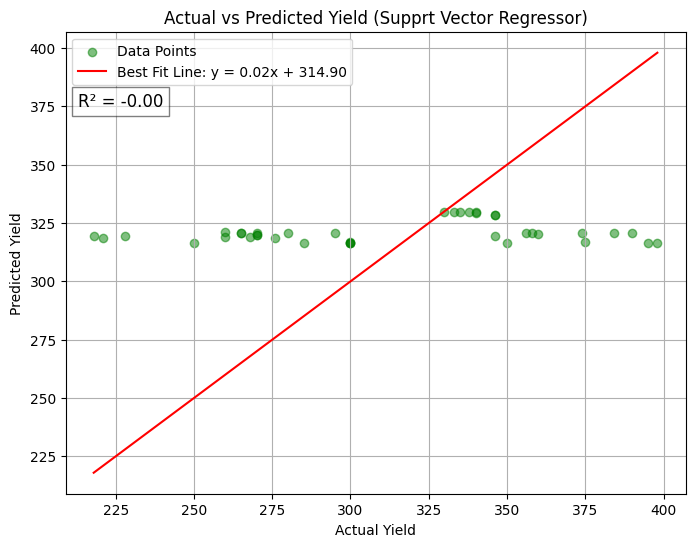


KNN
R2: 0.23
MAE: 28.73
MSE: 1914.47
RMSE: 43.75


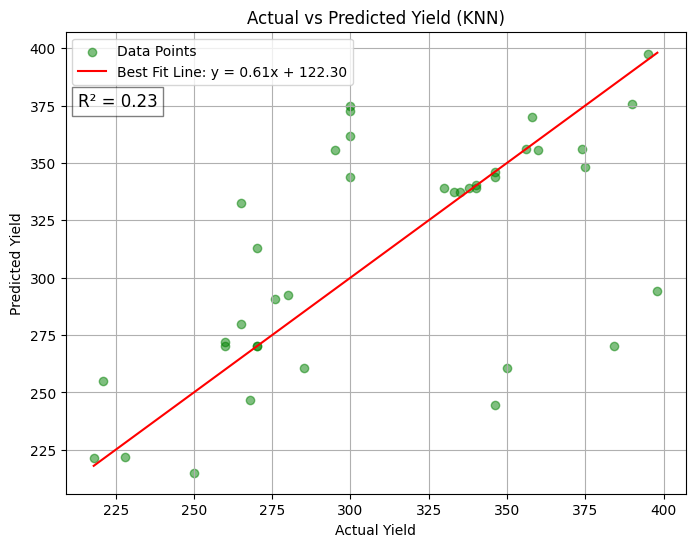


Lasso
R2: 0.19
MAE: 36.14
MSE: 2007.79
RMSE: 44.81


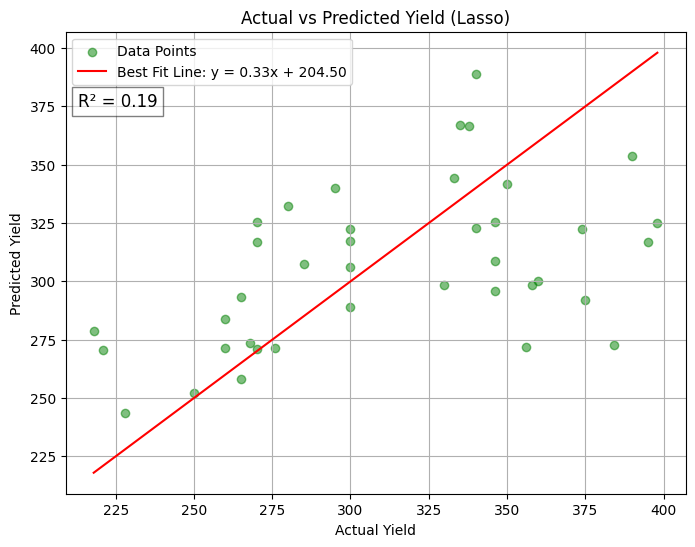


Decisin Tree regresson
R2: 0.91
MAE: 7.38
MSE: 225.18
RMSE: 15.01


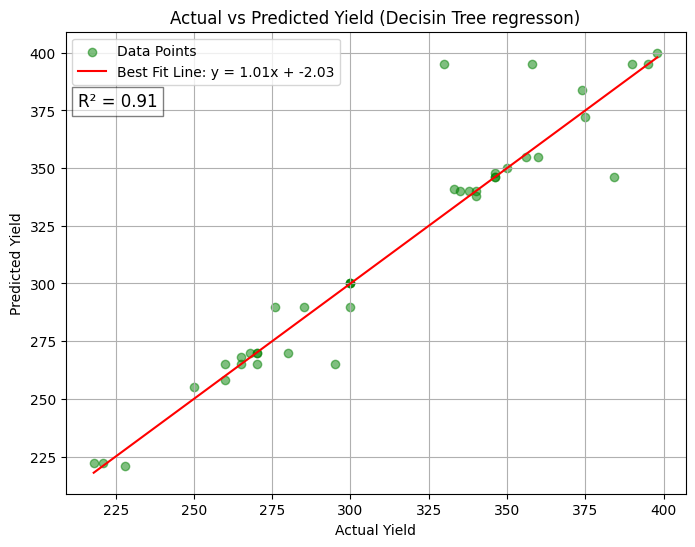


Random Forest Regressor
R2: 0.94
MAE: 9.10
MSE: 150.52
RMSE: 12.27


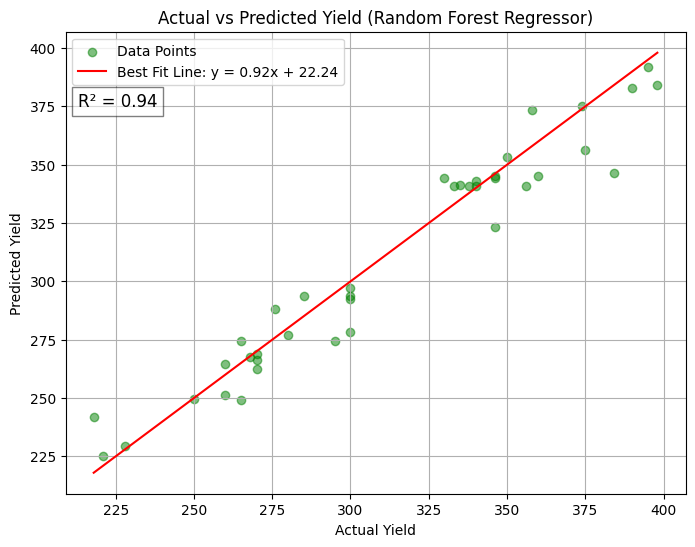


Gradient Boosting Regressor
R2: 0.96
MAE: 7.33
MSE: 91.50
RMSE: 9.57


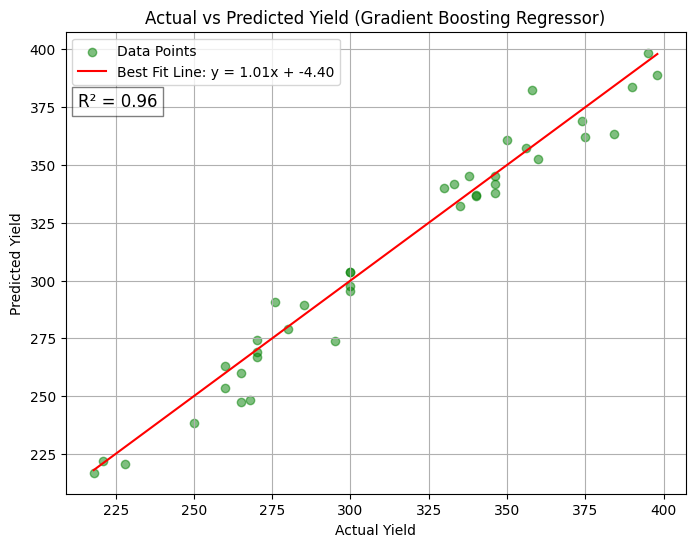


ExtraTrees Regressor
R2: 0.99
MAE: 3.63
MSE: 24.43
RMSE: 4.94


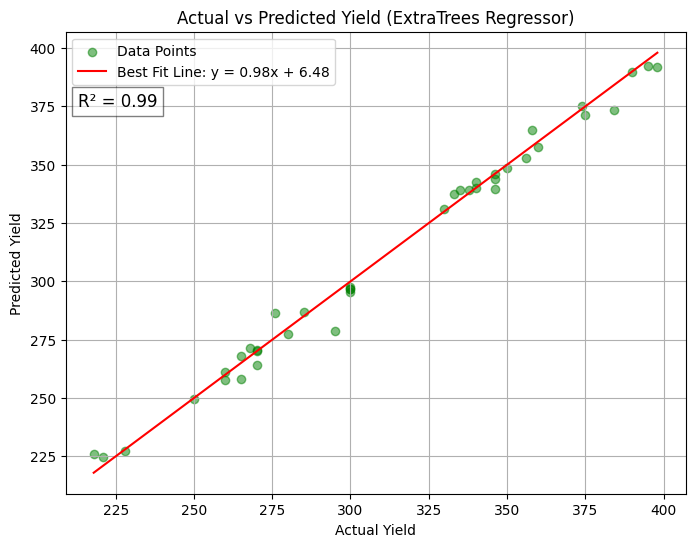


Bayesian Ridge
R2: 0.00
MAE: 44.11
MSE: 2488.62
RMSE: 49.89


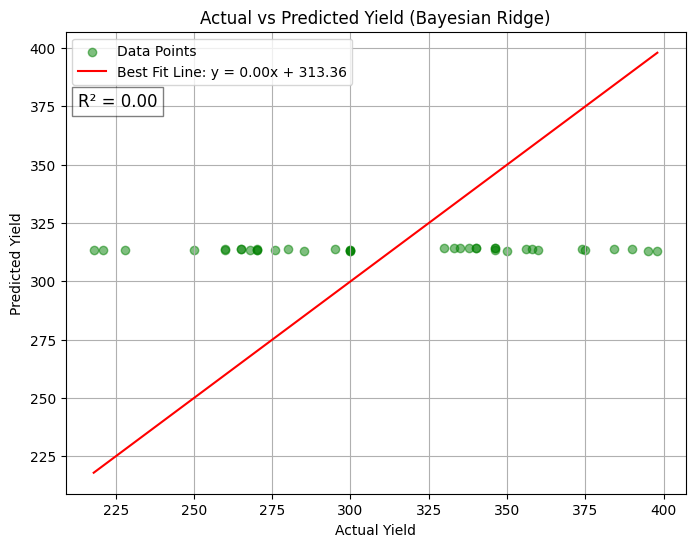


Elastic Net CV
R2: 0.21
MAE: 36.61
MSE: 1971.75
RMSE: 44.40


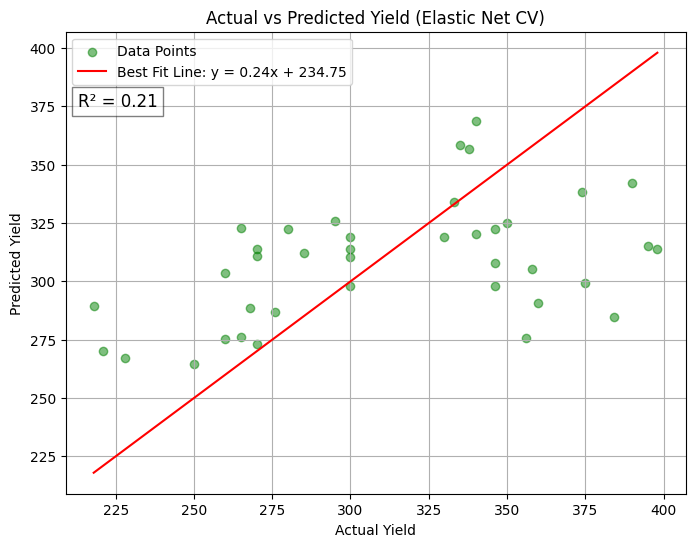

In [ ]:
regression(X_train, X_test, y_train, y_test)

In [18]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit the scaler to the numerical data
scaler.fit(X_train)

# Transform the numerical columns using the scaler
X_train_selected = scaler.transform(X_train)
X_test_selected = scaler.transform(X_test)

Linear Regression
R2: -0.03
MAE: 53.79
MSE: 3503.94
RMSE: 59.19


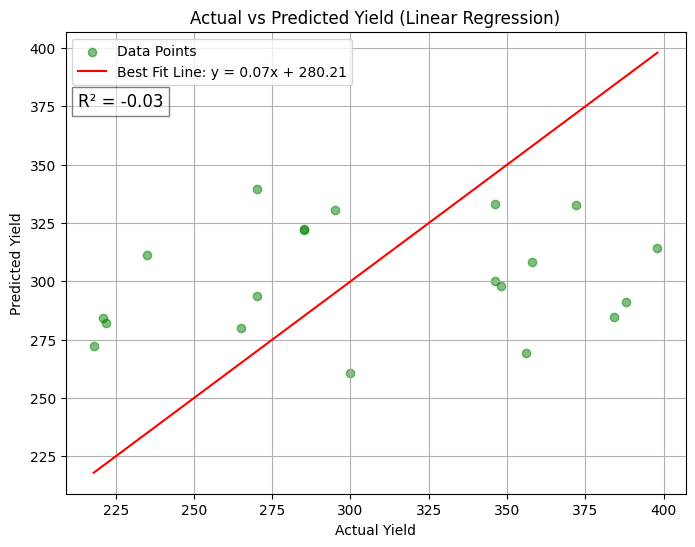


Supprt Vector Regressor
R2: -0.01
MAE: 52.14
MSE: 3431.12
RMSE: 58.58


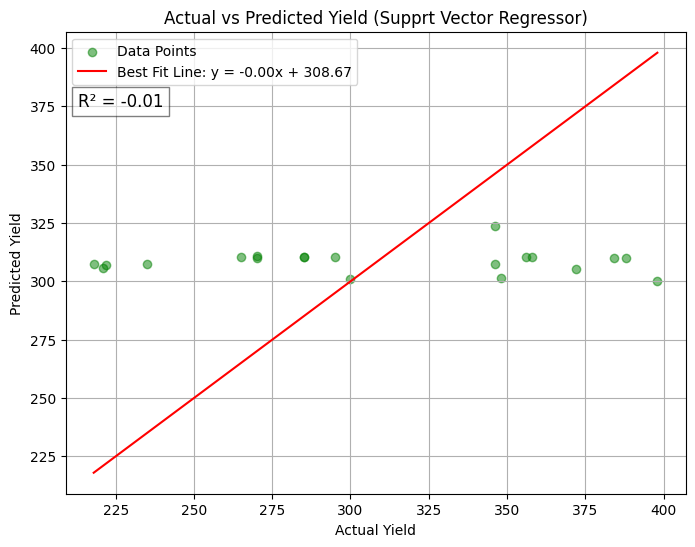


KNN
R2: 0.13
MAE: 40.80
MSE: 2948.28
RMSE: 54.30


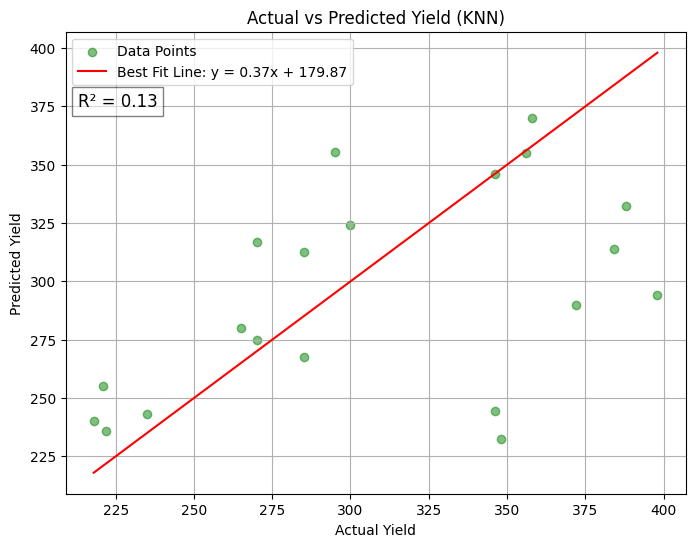


Lasso
R2: -0.03
MAE: 53.72
MSE: 3496.75
RMSE: 59.13


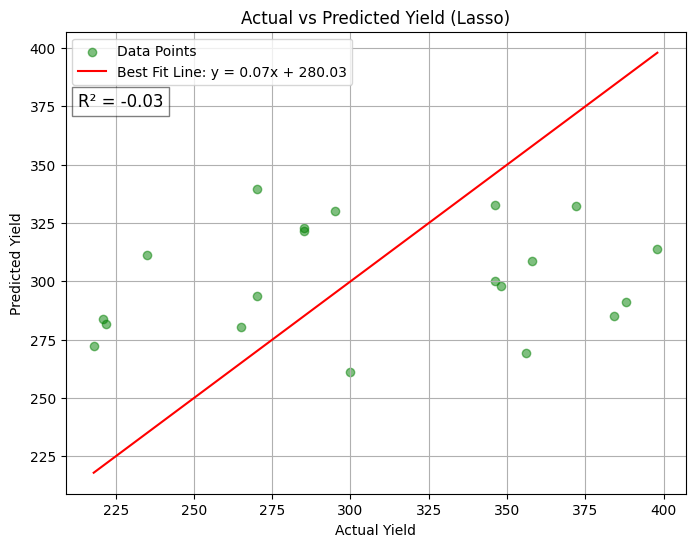


Decisin Tree regresson
R2: 0.05
MAE: 35.10
MSE: 3235.70
RMSE: 56.88


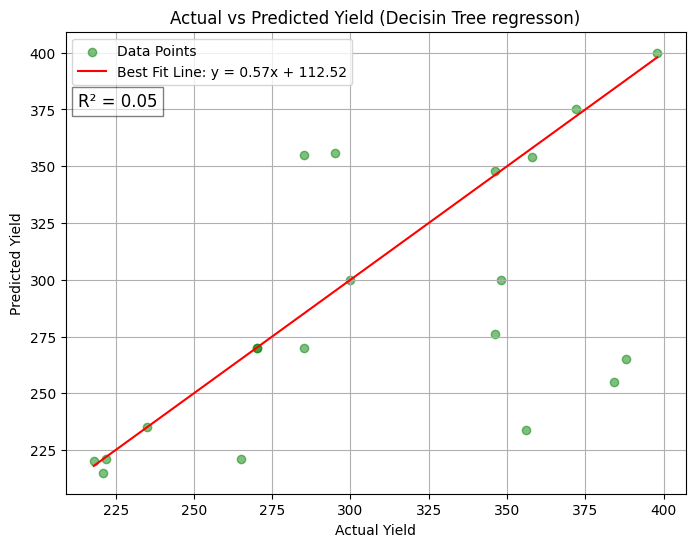


Random Forest Regressor
R2: 0.93
MAE: 12.40
MSE: 251.98
RMSE: 15.87


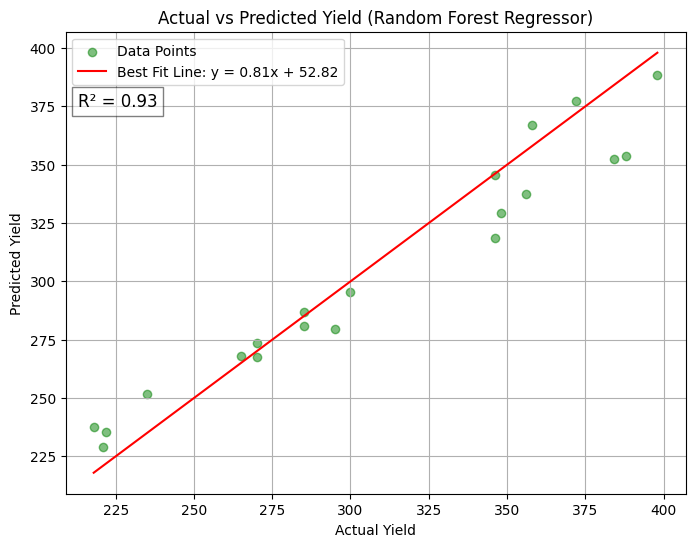


Gradient Boosting Regressor
R2: 0.94
MAE: 11.04
MSE: 208.53
RMSE: 14.44


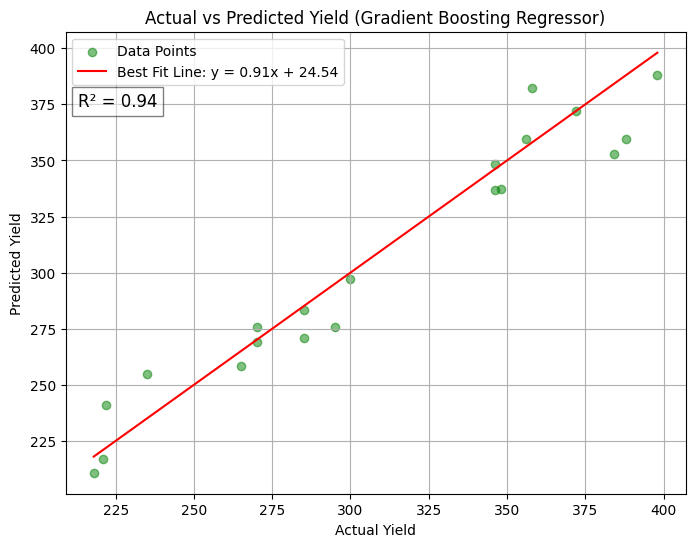


ExtraTrees Regressor
R2: 0.98
MAE: 5.34
MSE: 63.66
RMSE: 7.98


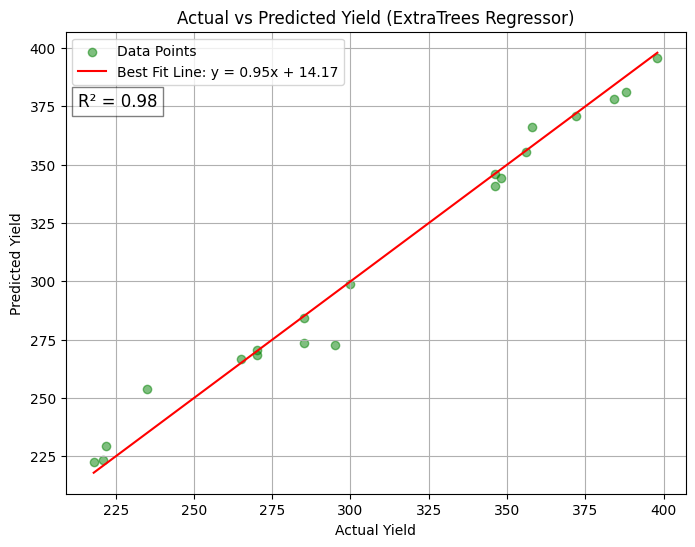


Bayesian Ridge
R2: -0.01
MAE: 52.78
MSE: 3440.70
RMSE: 58.66


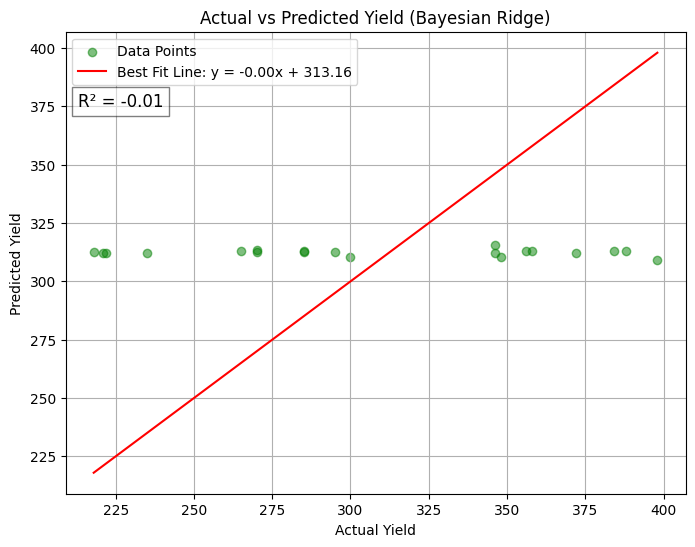


Elastic Net CV
R2: 0.00
MAE: 52.68
MSE: 3388.54
RMSE: 58.21


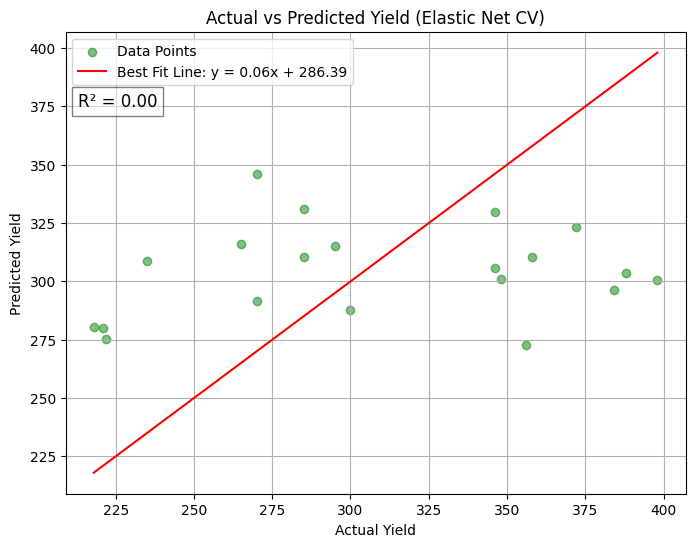

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.10
MAE: 47.20
MSE: 2941.29
RMSE: 54.23


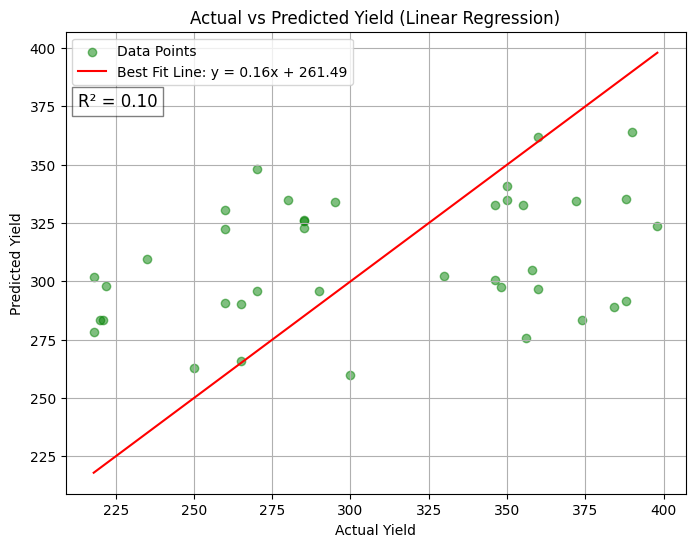


Supprt Vector Regressor
R2: 0.00
MAE: 51.16
MSE: 3244.52
RMSE: 56.96


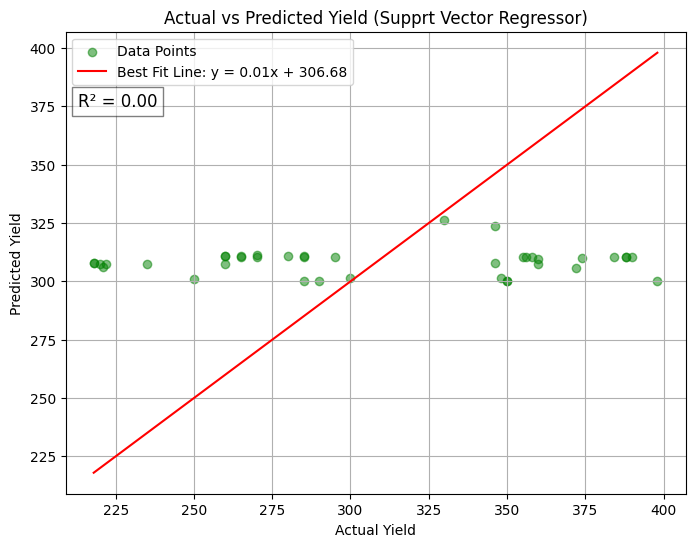


KNN
R2: 0.07
MAE: 41.36
MSE: 3028.85
RMSE: 55.03


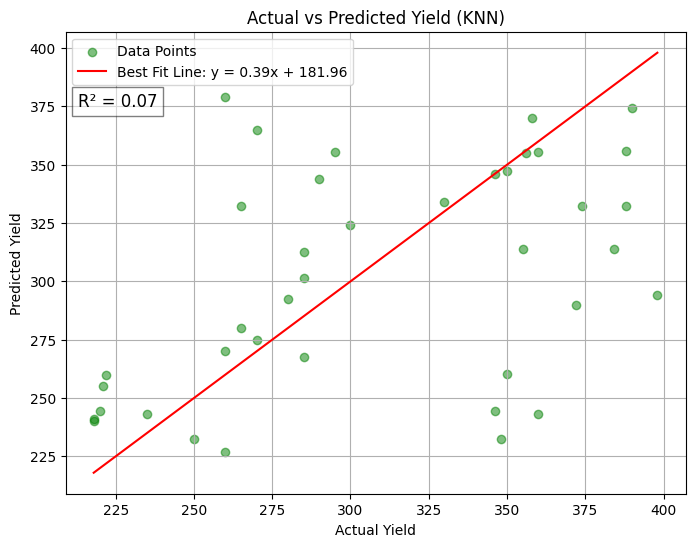


Lasso
R2: 0.10
MAE: 47.17
MSE: 2935.01
RMSE: 54.18


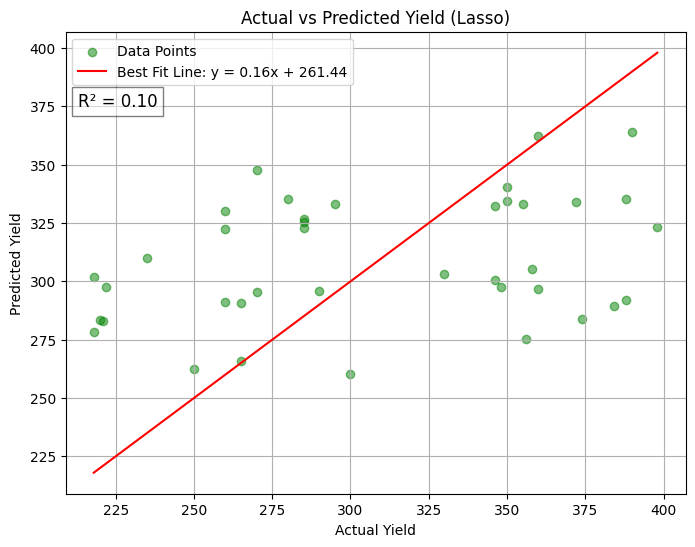


Decisin Tree regresson
R2: 0.97
MAE: 5.69
MSE: 82.46
RMSE: 9.08


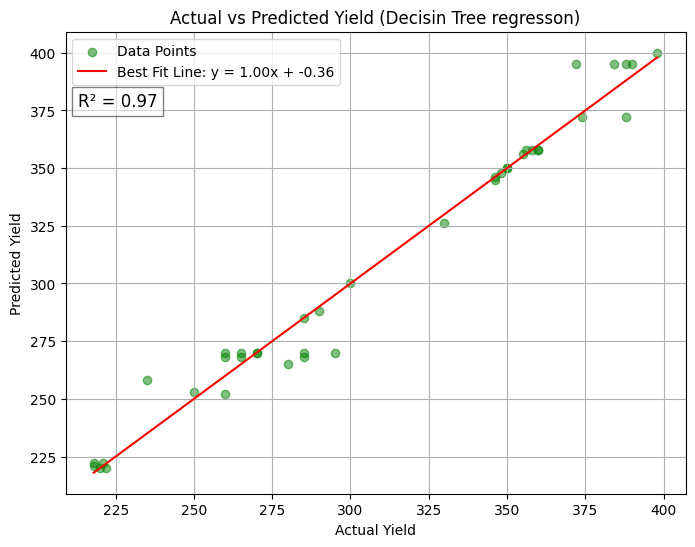


Random Forest Regressor
R2: 0.91
MAE: 11.87
MSE: 295.96
RMSE: 17.20


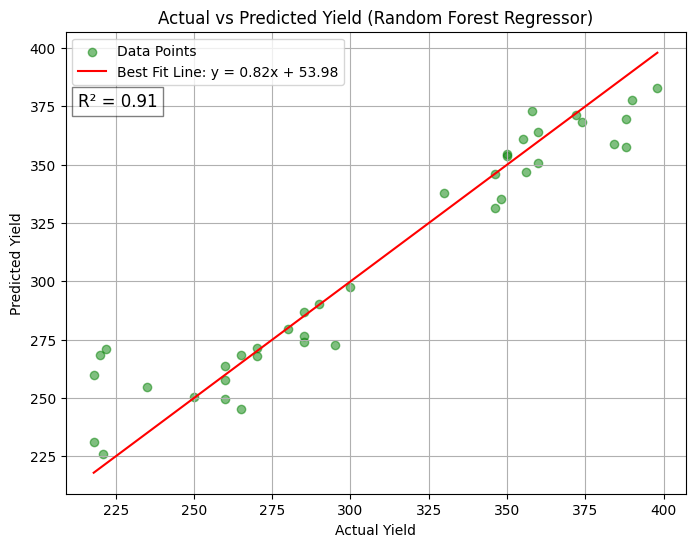


Gradient Boosting Regressor
R2: 0.95
MAE: 9.81
MSE: 164.72
RMSE: 12.83


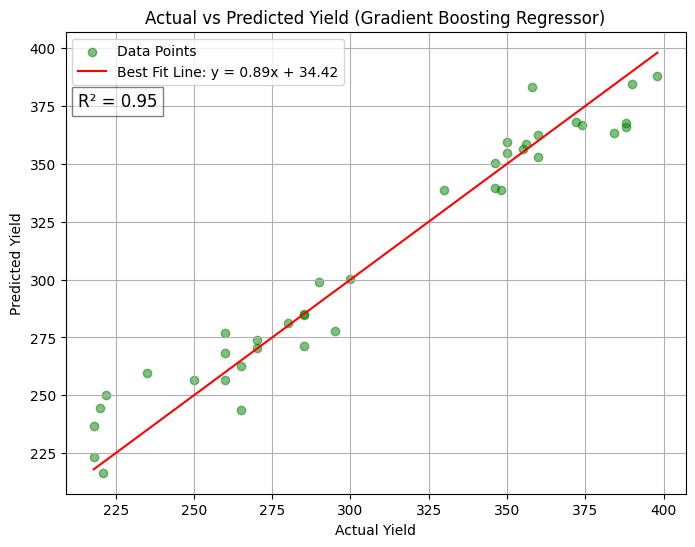


ExtraTrees Regressor
R2: 0.98
MAE: 5.63
MSE: 68.41
RMSE: 8.27


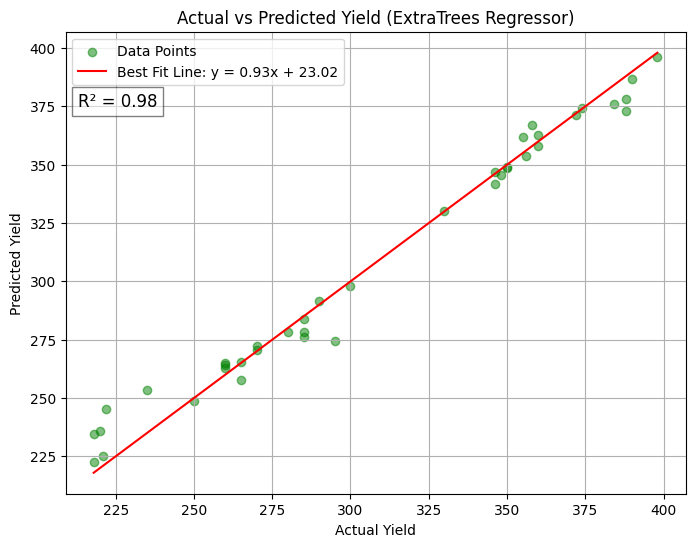


Bayesian Ridge
R2: -0.01
MAE: 52.12
MSE: 3277.80
RMSE: 57.25


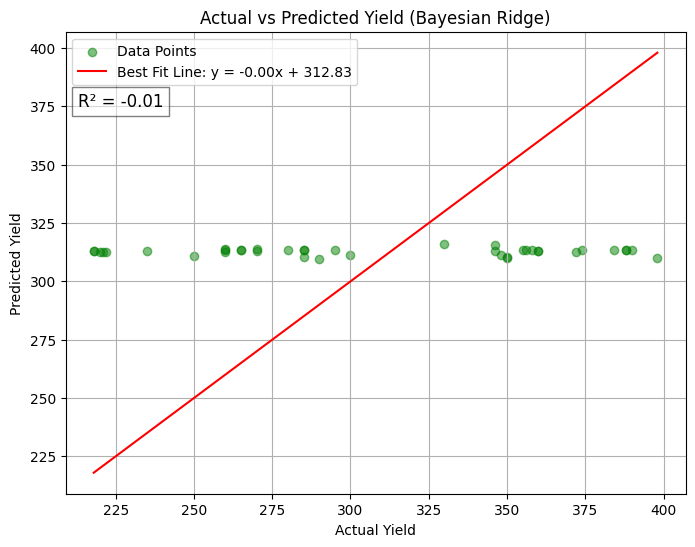


Elastic Net CV
R2: -0.00
MAE: 50.83
MSE: 3266.65
RMSE: 57.15


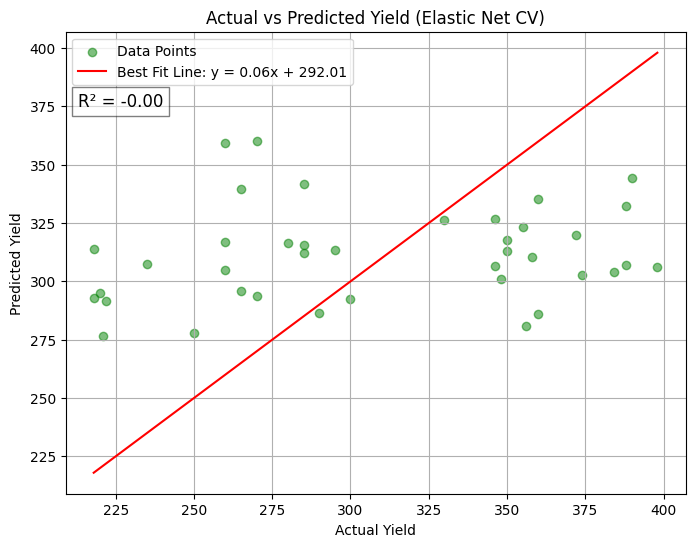

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.05
MAE: 46.10
MSE: 2882.33
RMSE: 53.69


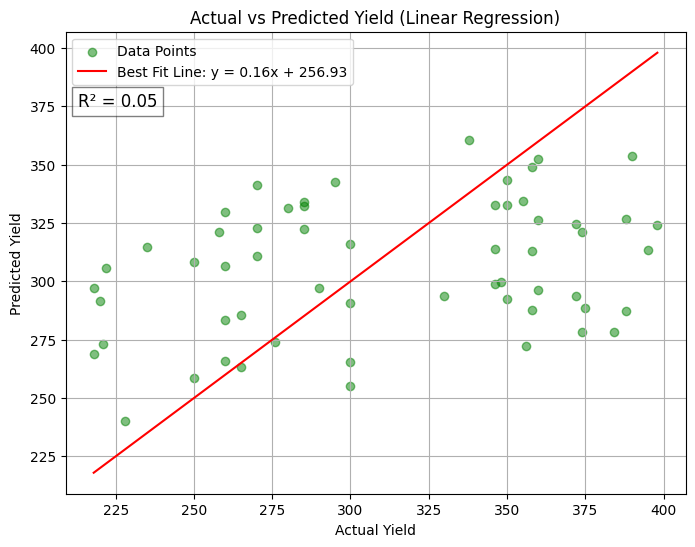


Supprt Vector Regressor
R2: 0.00
MAE: 48.84
MSE: 3027.03
RMSE: 55.02


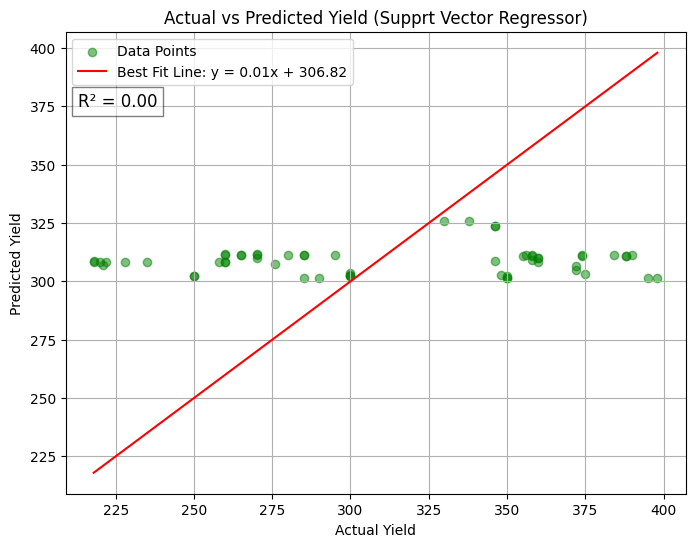


KNN
R2: -0.07
MAE: 43.33
MSE: 3240.56
RMSE: 56.93


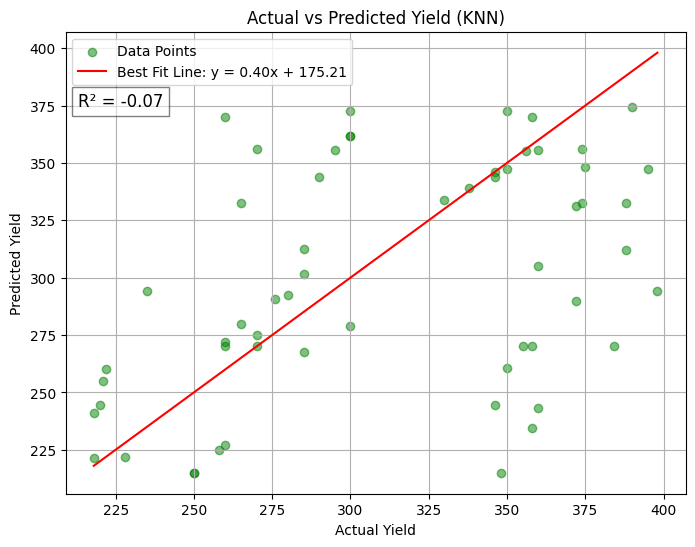


Lasso
R2: 0.05
MAE: 46.08
MSE: 2875.79
RMSE: 53.63


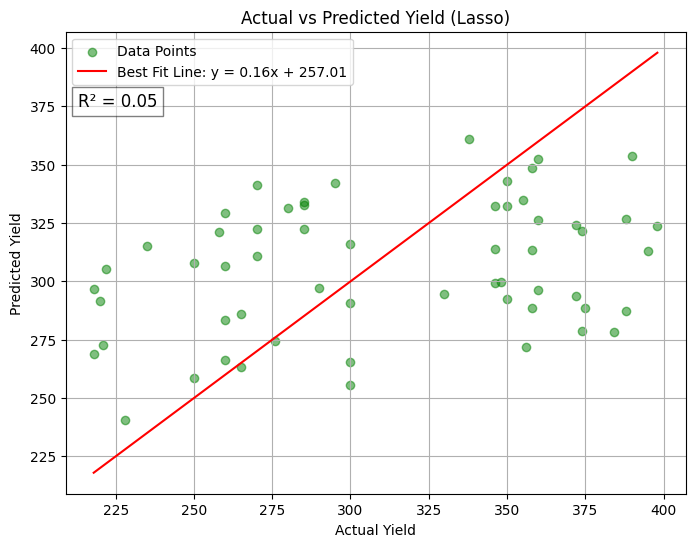


Decisin Tree regresson
R2: 0.87
MAE: 10.90
MSE: 390.59
RMSE: 19.76


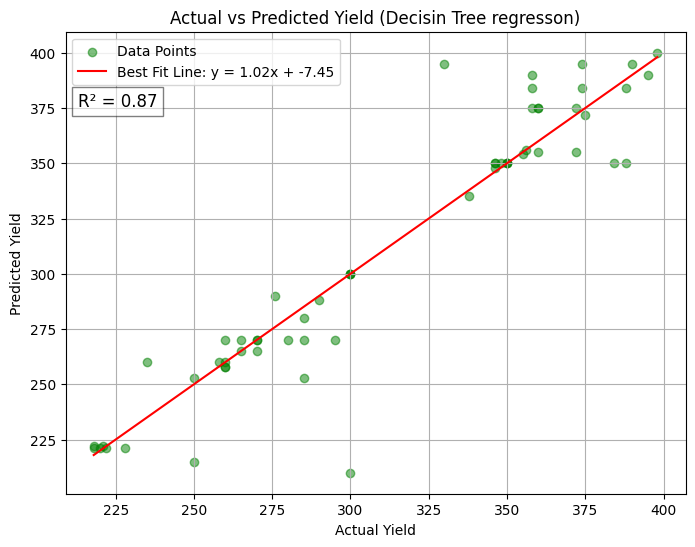


Random Forest Regressor
R2: 0.91
MAE: 11.23
MSE: 272.10
RMSE: 16.50


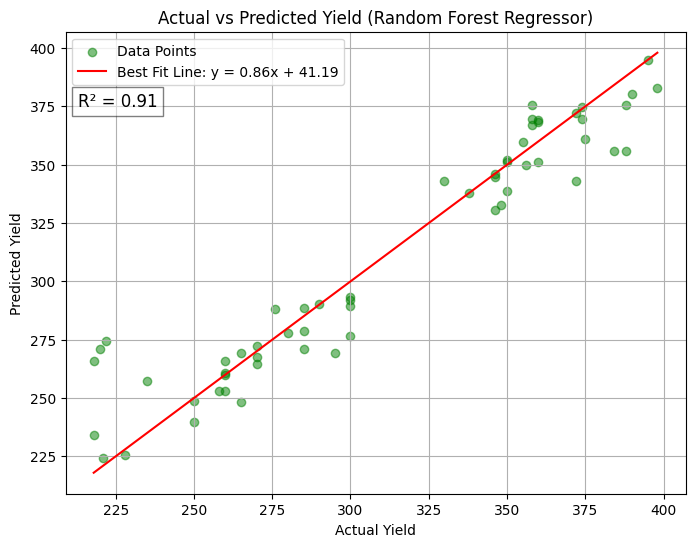


Gradient Boosting Regressor
R2: 0.96
MAE: 8.64
MSE: 134.00
RMSE: 11.58


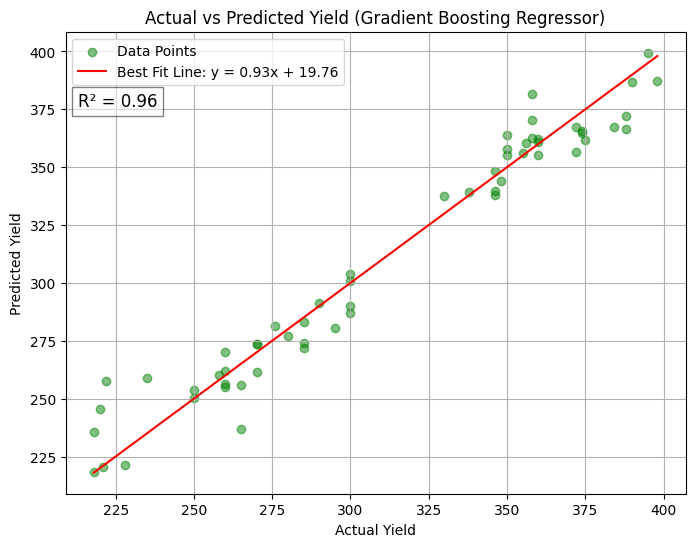


ExtraTrees Regressor
R2: 0.98
MAE: 6.27
MSE: 74.17
RMSE: 8.61


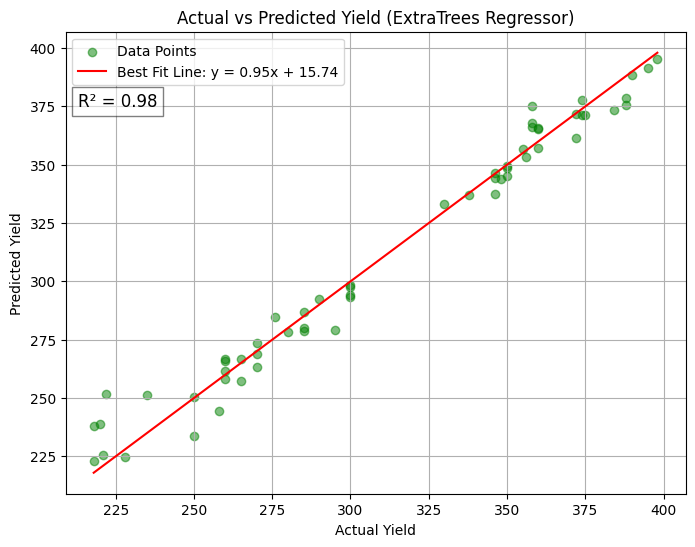


Bayesian Ridge
R2: -0.00
MAE: 49.90
MSE: 3029.33
RMSE: 55.04


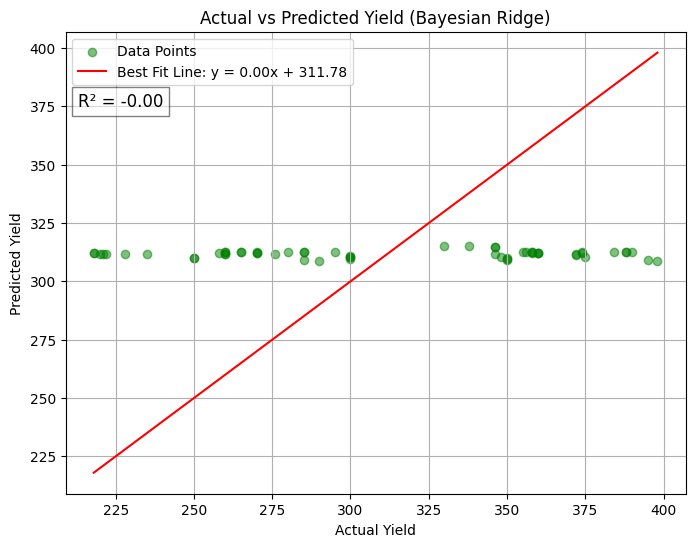


Elastic Net CV
R2: 0.07
MAE: 47.18
MSE: 2823.37
RMSE: 53.14


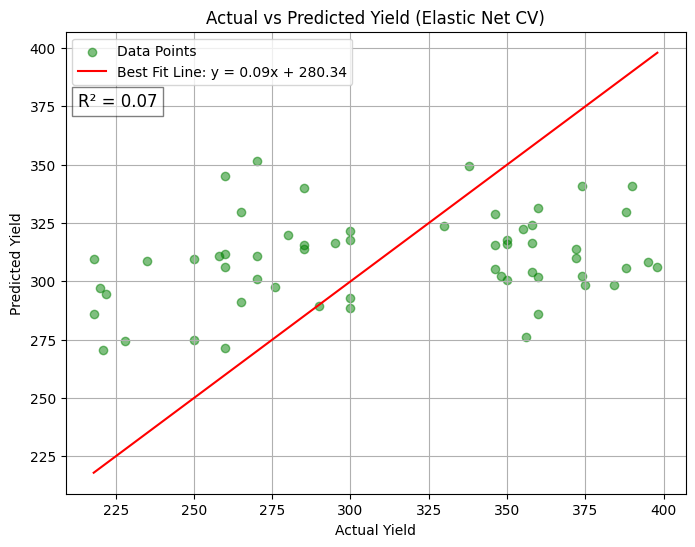

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.04
MAE: 42.52
MSE: 2587.85
RMSE: 50.87


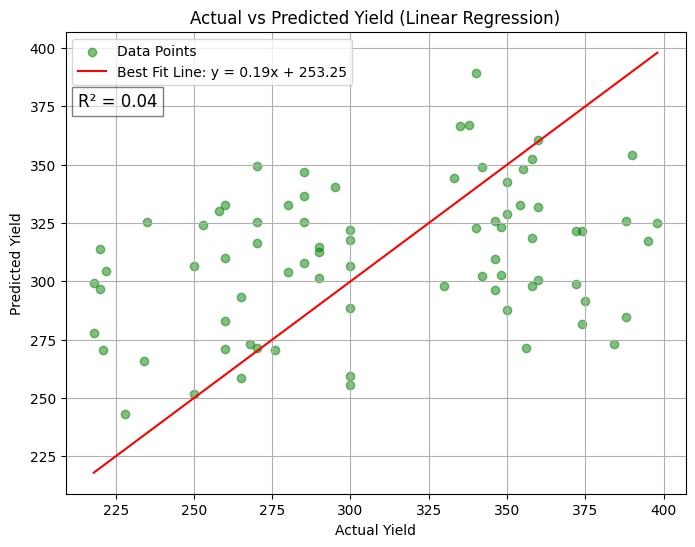


Supprt Vector Regressor
R2: -0.02
MAE: 45.37
MSE: 2739.64
RMSE: 52.34


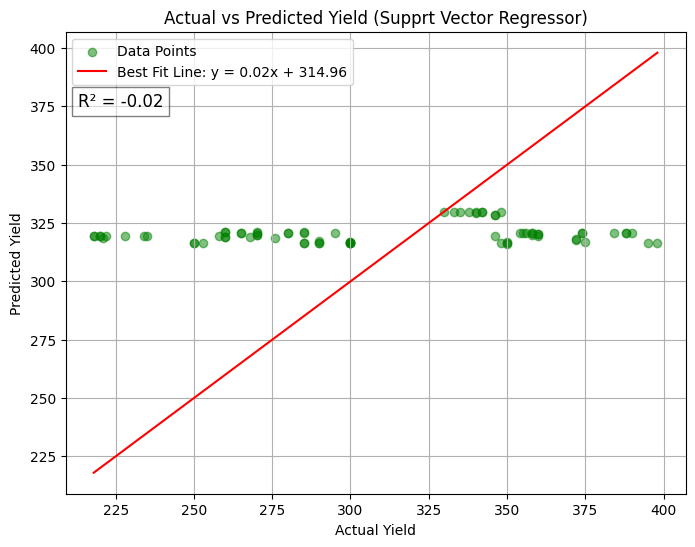


KNN
R2: 0.03
MAE: 37.62
MSE: 2602.22
RMSE: 51.01


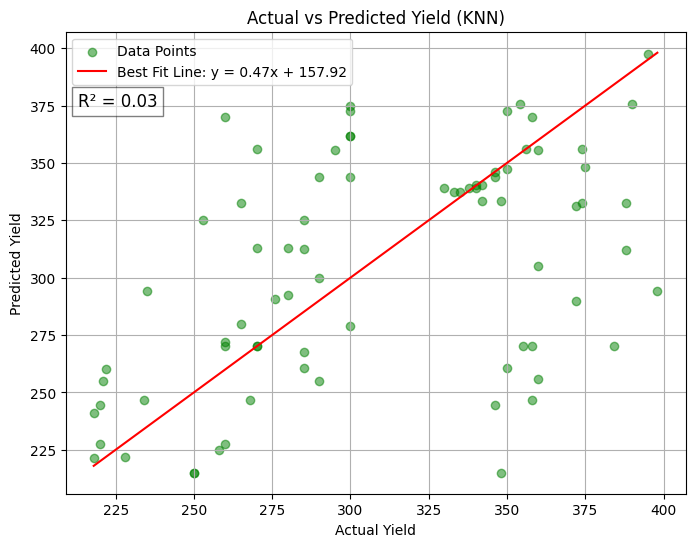


Lasso
R2: 0.04
MAE: 42.49
MSE: 2583.41
RMSE: 50.83


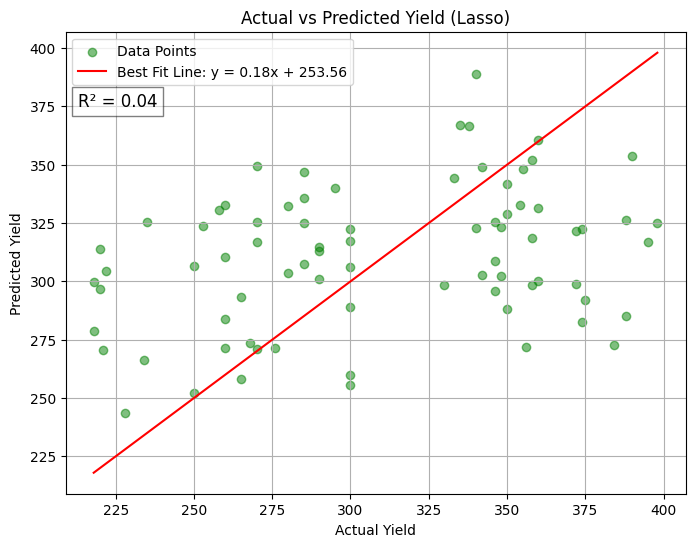


Decisin Tree regresson
R2: 0.91
MAE: 8.79
MSE: 247.86
RMSE: 15.74


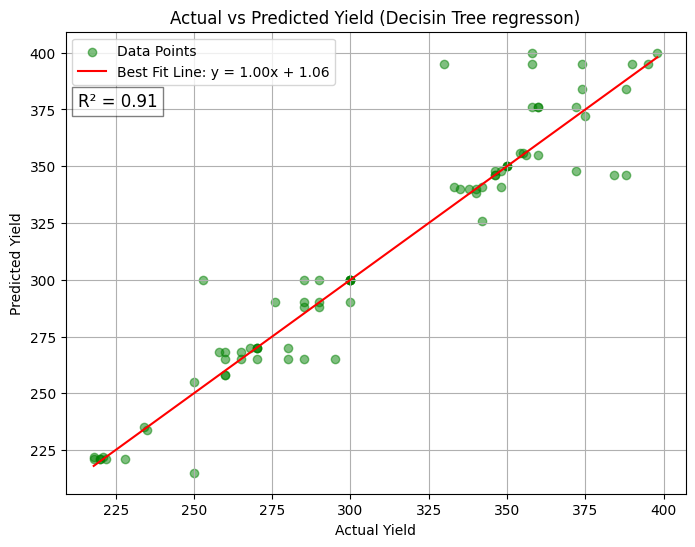


Random Forest Regressor
R2: 0.89
MAE: 12.11
MSE: 296.48
RMSE: 17.22


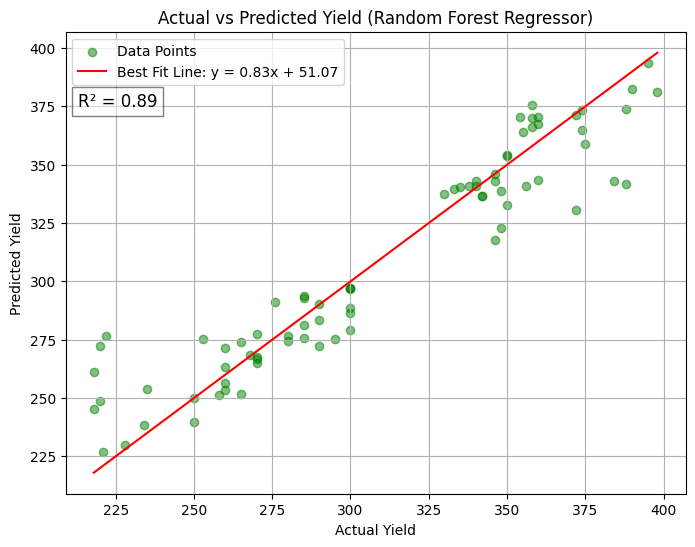


Gradient Boosting Regressor
R2: 0.95
MAE: 8.79
MSE: 135.87
RMSE: 11.66


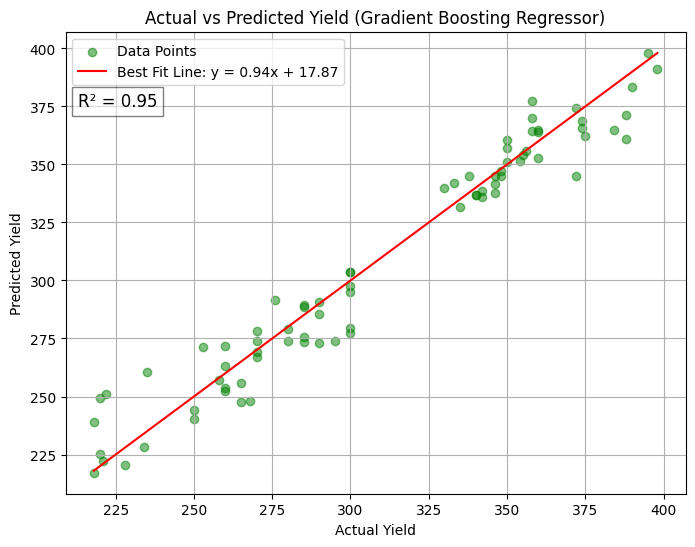


ExtraTrees Regressor
R2: 0.97
MAE: 6.12
MSE: 74.98
RMSE: 8.66


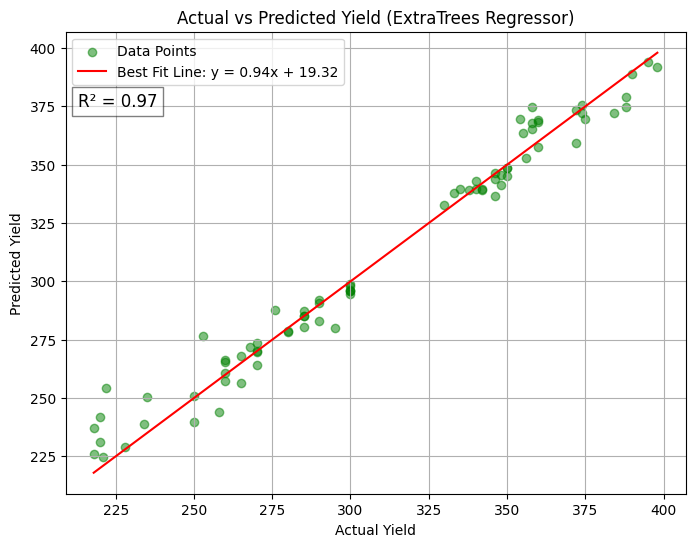


Bayesian Ridge
R2: -0.01
MAE: 46.56
MSE: 2704.16
RMSE: 52.00


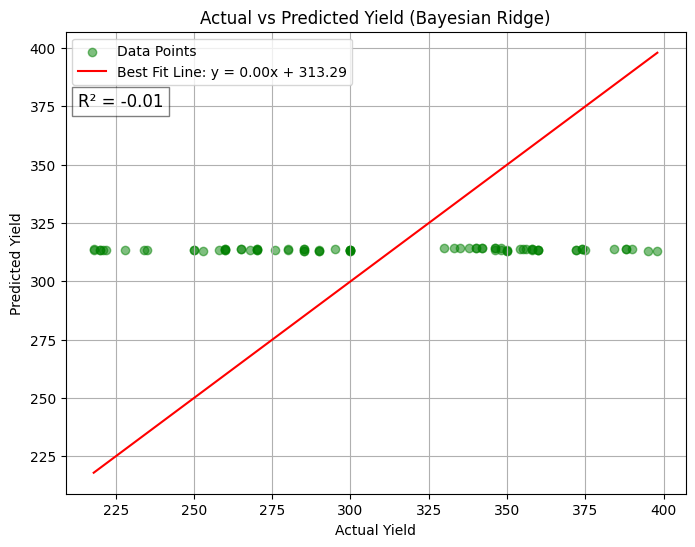


Elastic Net CV
R2: 0.07
MAE: 42.52
MSE: 2488.23
RMSE: 49.88


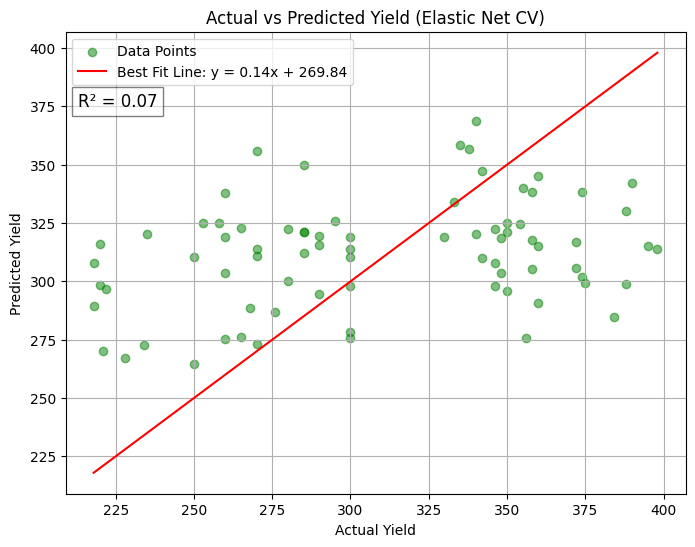

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.05
MAE: 42.85
MSE: 2554.99
RMSE: 50.55


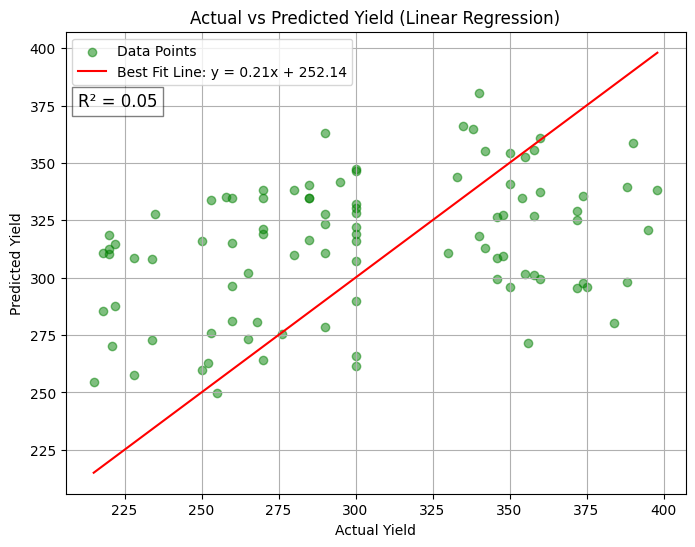


Supprt Vector Regressor
R2: -0.56
MAE: 53.44
MSE: 4181.49
RMSE: 64.66


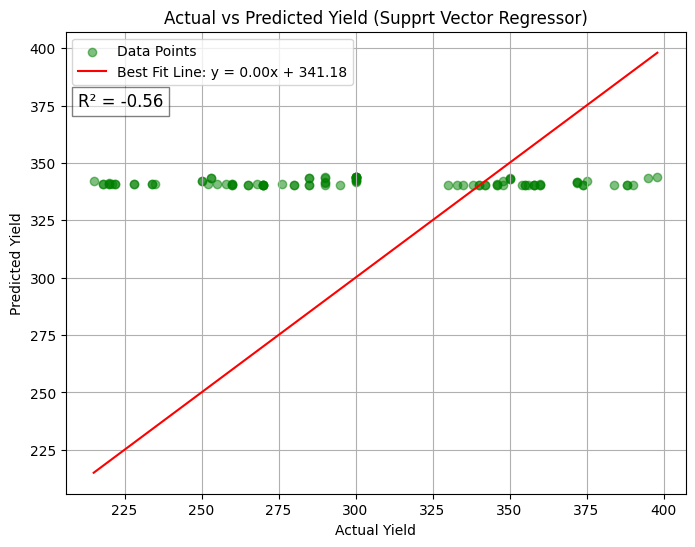


KNN
R2: 0.14
MAE: 35.66
MSE: 2318.18
RMSE: 48.15


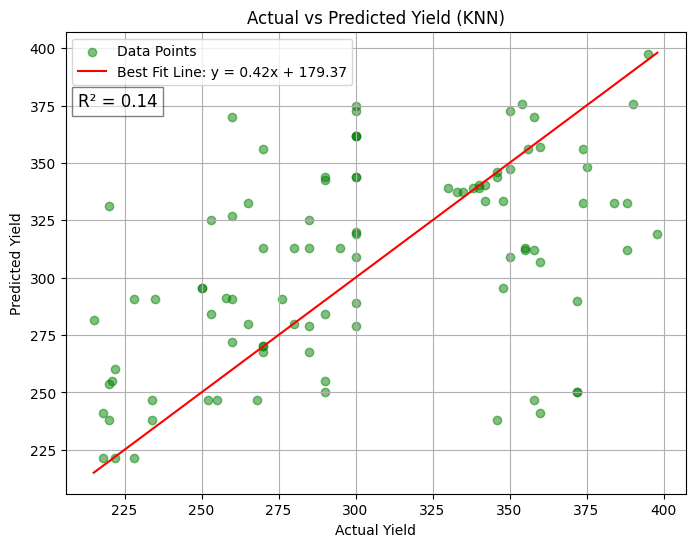


Lasso
R2: 0.05
MAE: 42.82
MSE: 2555.98
RMSE: 50.56


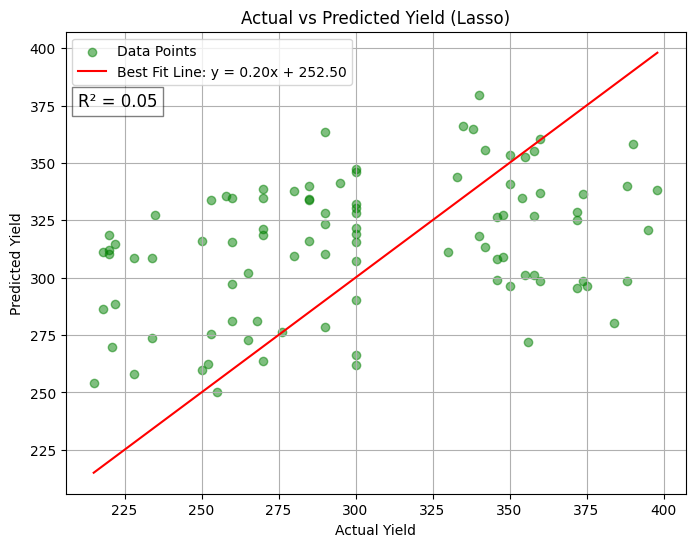


Decisin Tree regresson
R2: 0.29
MAE: 19.82
MSE: 1896.14
RMSE: 43.54


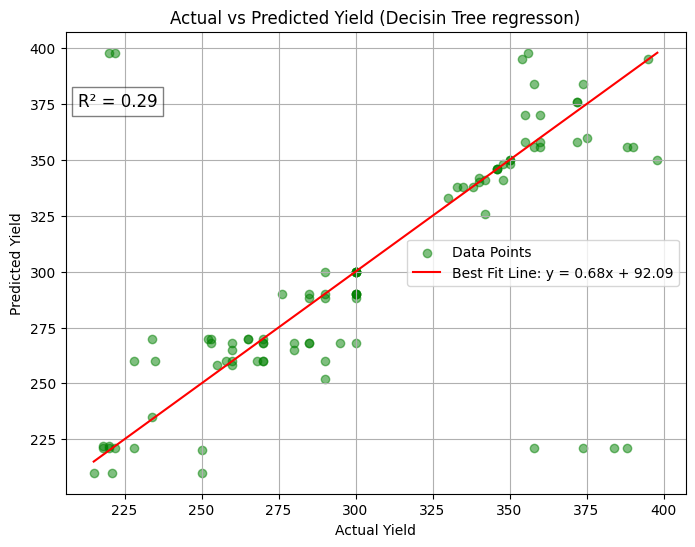


Random Forest Regressor
R2: 0.83
MAE: 13.32
MSE: 444.87
RMSE: 21.09


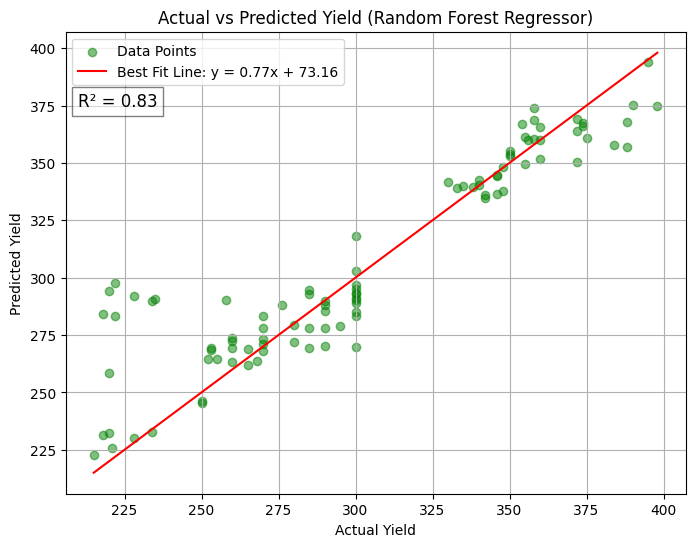


Gradient Boosting Regressor
R2: 0.89
MAE: 12.02
MSE: 299.12
RMSE: 17.30


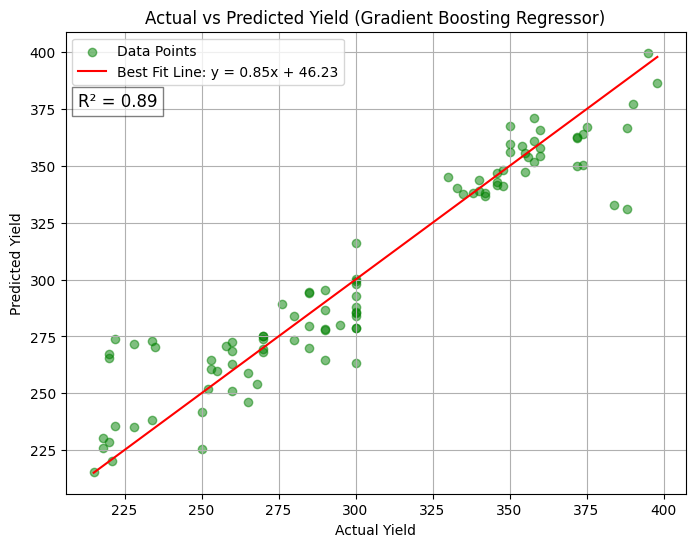


ExtraTrees Regressor
R2: 0.96
MAE: 7.72
MSE: 111.35
RMSE: 10.55


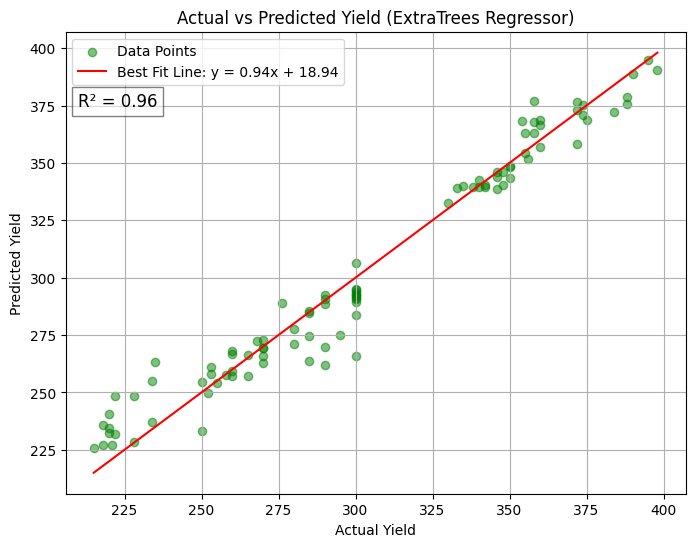


Bayesian Ridge
R2: -0.13
MAE: 48.44
MSE: 3021.75
RMSE: 54.97


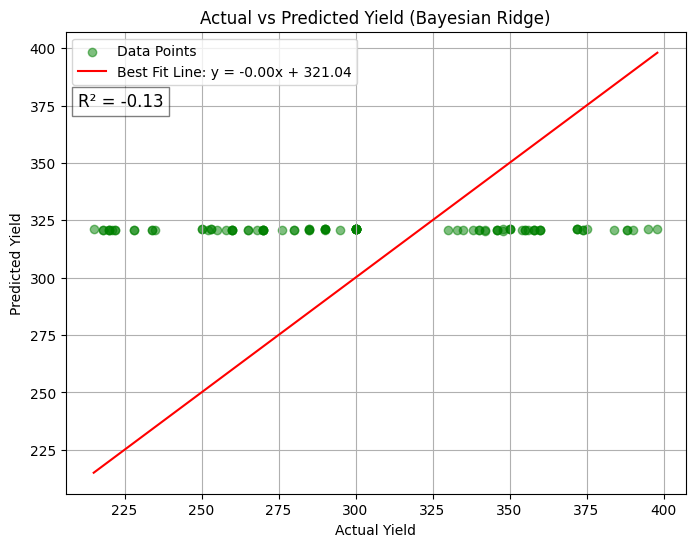


Elastic Net CV
R2: 0.05
MAE: 42.93
MSE: 2549.24
RMSE: 50.49


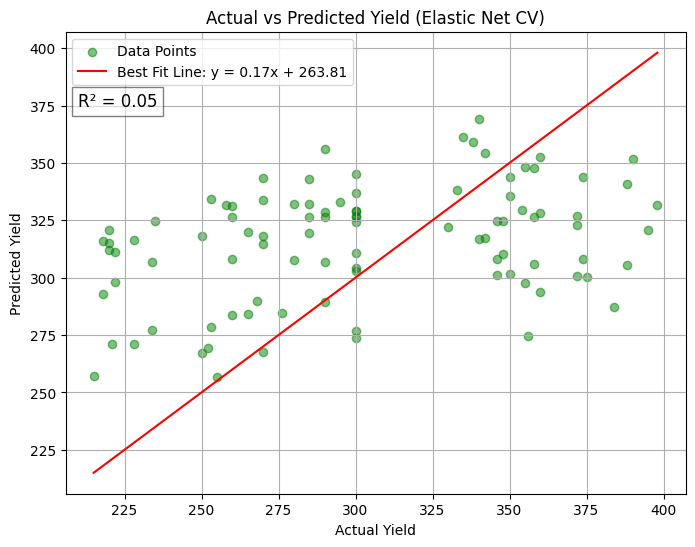

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
regression(X_train, X_test, y_train, y_test)

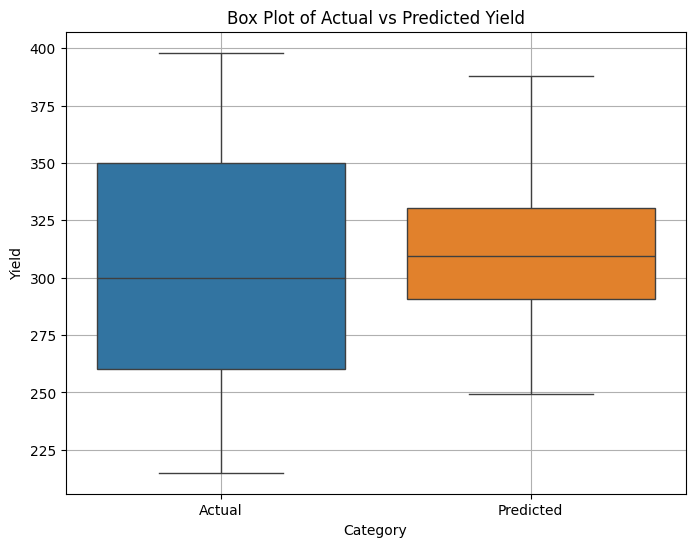

In [ ]:
import seaborn as sns
y_pred = model.predict(X_test)

# Combine actual and predicted values into a DataFrame for plotting
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Plotting actual vs predicted using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=results, orient="v")
plt.title('Box Plot of Actual vs Predicted Yield')
plt.ylabel('Yield')
plt.xlabel('Category')
plt.grid(True)
plt.show()

# **Boxplot**

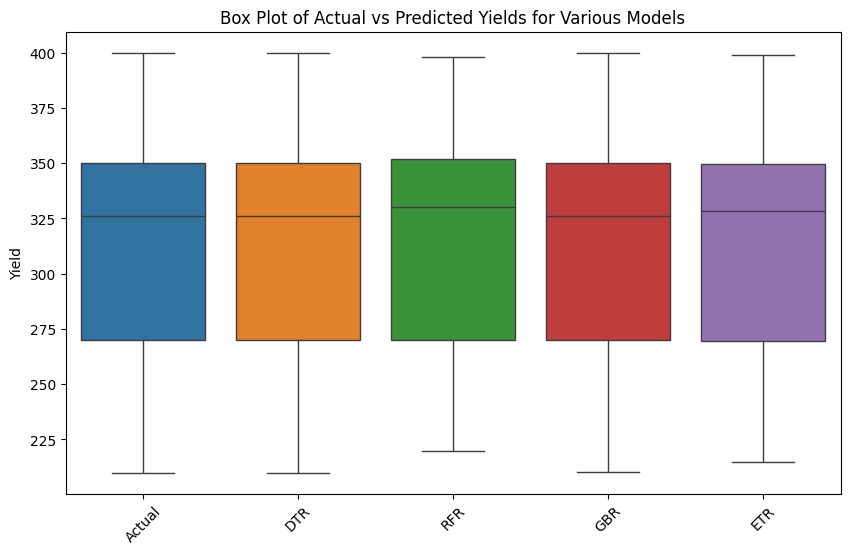


Descriptive statistics for Actual and Predicted values:
           Actual         DTR         RFR         GBR         ETR
count  153.000000  153.000000  153.000000  153.000000  153.000000
mean   312.777778  312.777778  312.705588  312.777778  312.777778
std     53.065280   53.065280   50.336223   53.048232   52.519346
min    210.000000  210.000000  219.665000  210.026967  214.668667
25%    270.000000  270.000000  269.840000  269.917017  269.703667
50%    326.000000  326.000000  330.285000  326.097721  328.441167
75%    350.000000  350.000000  351.930000  350.045274  349.768333
max    400.000000  400.000000  397.800000  400.016772  398.989167

Skewness for Actual and Predicted values:
Actual   -0.20
DTR      -0.20
RFR      -0.15
GBR      -0.20
ETR      -0.18
dtype: float64

Kurtosis for Actual and Predicted values:
Actual   -1.01
DTR      -1.01
RFR      -1.17
GBR      -1.01
ETR      -1.07
dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

# # Load your dataset (replace with your actual dataset)
# data = pd.read_excel('/path_to_your_dataset.xlsx')

# Split the data into features and target
X = data1.drop(columns=["Yeild"])  # Features
y = data1["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the models
models = {
        'DTR':DecisionTreeRegressor(random_state=0),
        'RFR': RandomForestRegressor(n_estimators=200),
        'GBR': GradientBoostingRegressor(n_estimators=500),
        'ETR': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
}

# Dictionary to store predictions
predictions = {}

# Train each model and make predictions
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)  # Predictions on training data
    predictions[model_name] = y_pred_train  # Store predictions

# Combine actual and predicted values into a DataFrame for plotting
results = pd.DataFrame({
    'Actual': y_train
})

# Add predictions for each model
for model_name, y_pred_train in predictions.items():
    results[model_name] = y_pred_train

# Plot the box plots for actual vs predicted yields
plt.figure(figsize=(10, 6))
sns.boxplot(data=results)
plt.title('Box Plot of Actual vs Predicted Yields for Various Models')
plt.ylabel('Yield')
plt.xticks(rotation=45)
plt.show()

# Print the descriptive statistics for the actual and predicted values
print("\nDescriptive statistics for Actual and Predicted values:")
print(results.describe())
# Calculate and print skewness and kurtosis for actual and predicted values
print("\nSkewness for Actual and Predicted values:")
print(results.apply(lambda x: skew(x.dropna())).round(2))

print("\nKurtosis for Actual and Predicted values:")
print(results.apply(lambda x: kurtosis(x.dropna())).round(2))


# **Sln3**

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
data2=pd.read_excel(r"/content/drive/MyDrive/Cfy_dataset/group-01_Sln3.xlsx")

In [ ]:
data2.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [ ]:
data2

,yearFrom,yearTo,month,fort_night,CLR_Incidence,T_max,T_min,RH,RF,%OC,P,K,pH,spacing,Age,Yeild
0,2015,2016,April,1st,0.11,29.88,19.07,82.07,76.1,7.50,18.0,286.0,7.0,81,70,300
1,2015,2016,April,2nd,0.36,29.67,18.97,83.47,193.7,6.60,78.0,63.0,5.5,36,80,290
2,2015,2016,May,1st,0.56,29.67,18.93,84.20,288.7,6.60,77.0,125.0,6.0,81,67,285
3,2015,2016,May,2nd,0.58,29.50,19.47,85.94,318.3,6.60,69.0,338.0,5.8,81,15,268
4,2015,2016,June,1st,0.88,28.80,19.40,83.87,321.1,6.60,16.0,163.0,5.6,36,15,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2022,2023,Junary,2nd,10.87,29.03,13.50,85.50,3859.8,4.01,92.0,408.0,5.5,200,10,326
188,2022,2023,February,1st,5.67,31.30,16.23,67.46,3859.8,4.01,92.0,600.0,5.7,25,26,341
189,2022,2023,February,2nd,7.20,32.07,15.26,72.69,3859.8,4.01,92.0,612.0,4.7,25,31,342
190,2022,2023,March,1st,3.68,33.30,16.73,87.60,3859.8,4.01,91.0,464.0,5.9,25,22,345


In [ ]:
data2=data2.replace(["Junary","February","March","April","May","June","July","August","September","October","November","December","1st","2nd"],[0,1,2,3,4,5,6,7,8,9,10,11,0,1,])

In [ ]:
X = data2.drop(columns=["Yeild"]) # Features
y = data2["Yeild"] # Target variable

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
from math import sqrt
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge, ElasticNetCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn import linear_model
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model initialization and training
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluation
train_rmse = mean_squared_error(y_train, y_pred_train, squared=False)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

Train RMSE: 44.16978813126919
Test RMSE: 48.95761564179763


In [ ]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)  # 60% training, 40% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # 20% validation, 20% test

train_data = pd.concat([X_train, y_train], axis=1)
val_data = pd.concat([X_val, y_val], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

In [ ]:
def compute_stats(data, name):
    print(f"\n{name} Descriptive Statistics:")
    print(data.describe())

    # Compute skewness
    skewness = data.apply(lambda x: skew(x.dropna()))
    print("\nSkewness:")
    print(skewness)

    # Compute kurtosis
    kurtosis_values = data.apply(lambda x: kurtosis(x.dropna()))
    print("\nKurtosis:")
    print(kurtosis_values)

# Compute stats for the entire dataset
print("Entire Dataset Statistics:")
print(data2.describe())
print("\nSkewness of entire dataset:")
print(data2.apply(lambda x: skew(x.dropna())))
print("\nKurtosis of entire dataset:")
print(data2.apply(lambda x: kurtosis(x.dropna())))

# Compute stats for each subset
compute_stats(train_data, "Training Data")
compute_stats(val_data, "Validation Data")
compute_stats(test_data, "Testing Data")

Entire Dataset Statistics:
          yearFrom       yearTo       month  fort_night  CLR_Incidence  \
count   192.000000   192.000000  192.000000  192.000000     192.000000   
mean   2018.500000  2019.500000    5.500000    0.500000       6.607708   
std       2.297278     2.297278    3.461078    0.501307       8.946788   
min    2015.000000  2016.000000    0.000000    0.000000       0.000000   
25%    2016.750000  2017.750000    2.750000    0.000000       0.560000   
50%    2018.500000  2019.500000    5.500000    0.500000       2.800000   
75%    2020.250000  2021.250000    8.250000    1.000000       8.660000   
max    2022.000000  2023.000000   11.000000    1.000000      37.270000   

            T_max       T_min          RH           RF         %OC  \
count  192.000000  192.000000  192.000000   192.000000  192.000000   
mean    28.604063   18.356979   82.382812  1801.703125    5.782760   
std      3.146644    2.035901    8.340461  1153.231773   12.104807   
min     22.900000   12.560

In [ ]:
def plot_actual_vs_predicted(y_actual, y_predicted, model_name):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_actual, y_predicted, marker='o', color='green', alpha=0.5, label='Data Points')
    plt.title(f'Actual vs Predicted Yield ({model_name})')
    plt.xlabel('Actual Yield')
    plt.ylabel('Predicted Yield')
    plt.grid(True)

    # Calculate the best fit line
    m, b = np.polyfit(y_actual, y_predicted, 1)
    y_fit = m * np.array(y_actual) + b

    # plt.plot(y_actual, y_fit, 0.10,0.95, label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Add a line y = x for reference (perfect predictions line)
    x_line = np.linspace(min(y_actual), max(y_actual), 100)
    plt.plot(x_line, x_line, color='red', linestyle='-', label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Calculate R² value
    r_squared = r2_score(y_actual, y_predicted)

    # Annotate R² value on the plot
    plt.text(0.02,0.83, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.5))

    plt.legend()
    plt.show()

In [ ]:
# define regression function
def regression(X_train, X_test, y_train, y_test):
    Regressor = {
        'Linear Regression':LinearRegression(),
        'Supprt Vector Regressor':SVR(kernel='rbf'),
        'KNN':KNeighborsRegressor(n_neighbors=2),
        'Lasso':linear_model.Lasso(alpha=0.1),
        'Decisin Tree regresson':DecisionTreeRegressor(random_state=0),
        'Random Forest Regressor': RandomForestRegressor(n_estimators=200),
        'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=500),
        'ExtraTrees Regressor': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
        'Bayesian Ridge': BayesianRidge(),
        'Elastic Net CV': ElasticNetCV()
    }


    for name, clf in Regressor.items():
        print(name)
        clf.fit(X_train, y_train)
        print(f'R2: {r2_score(y_test, clf.predict(X_test)):.2f}')
        print(f'MAE: {mean_absolute_error(y_test, clf.predict(X_test)):.2f}')
        print(f'MSE: {mean_squared_error(y_test, clf.predict(X_test)):.2f}')
        print(f'RMSE: {sqrt(mean_squared_error(y_test, clf.predict(X_test))):.2f}')
        y_pred = clf.predict(X_test)
        plot_actual_vs_predicted(y_test, y_pred, name)
        print()

Linear Regression
R2: 0.30
MAE: 34.00
MSE: 1750.13
RMSE: 41.83


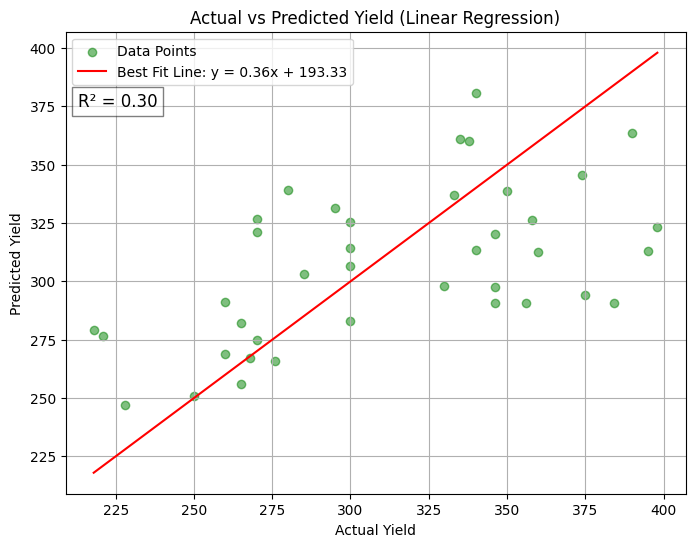


Supprt Vector Regressor
R2: -0.00
MAE: 42.21
MSE: 2492.56
RMSE: 49.93


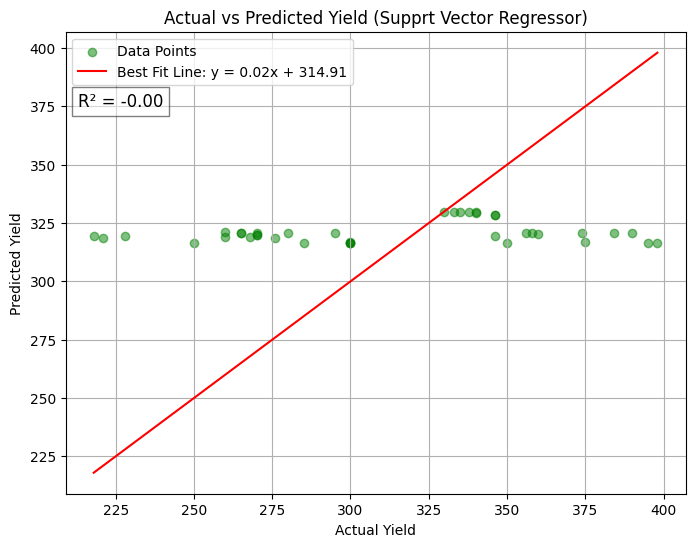


KNN
R2: 0.21
MAE: 29.78
MSE: 1963.42
RMSE: 44.31


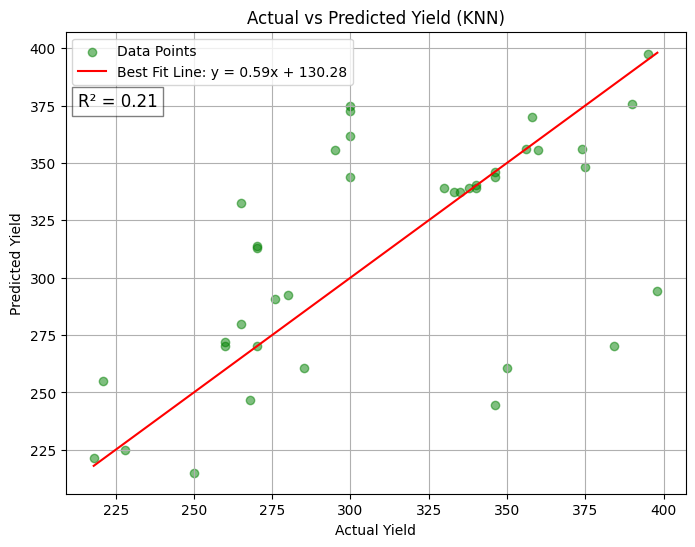


Lasso
R2: 0.30
MAE: 33.98
MSE: 1751.26
RMSE: 41.85


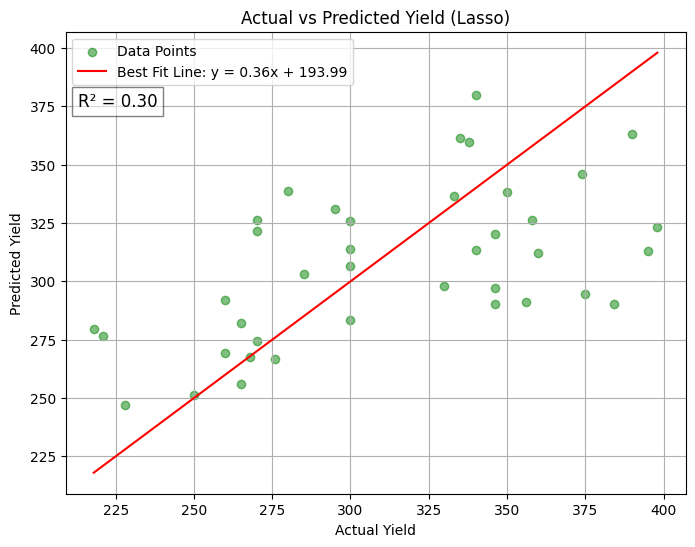


Decisin Tree regresson
R2: 0.84
MAE: 11.41
MSE: 397.21
RMSE: 19.93


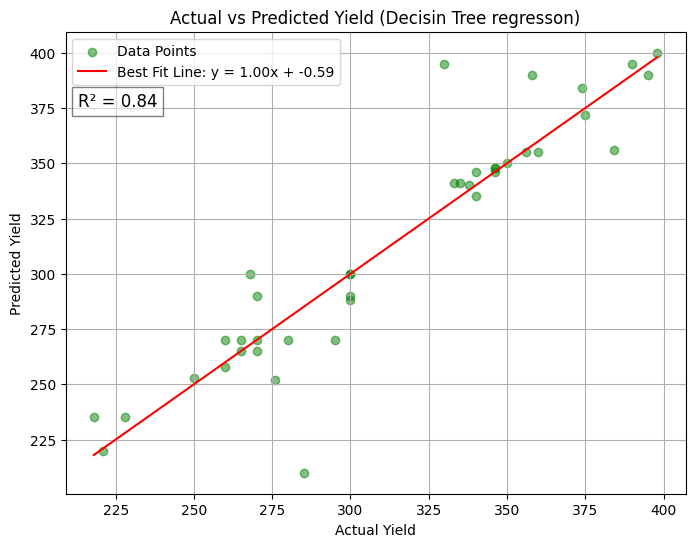


Random Forest Regressor
R2: 0.94
MAE: 8.94
MSE: 152.06
RMSE: 12.33


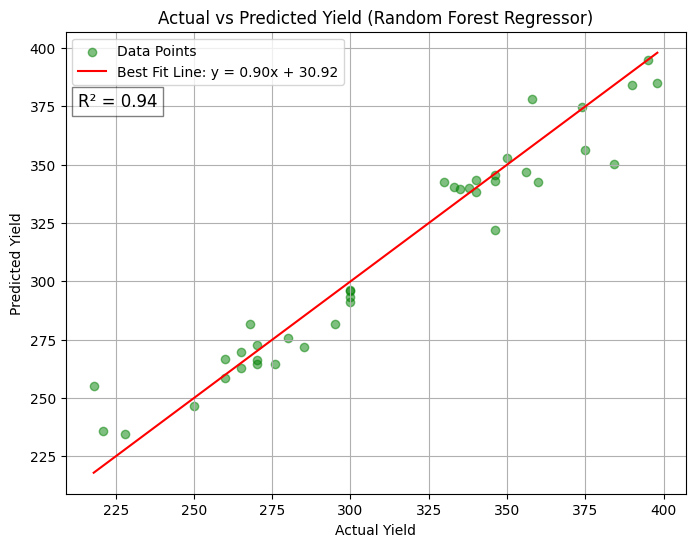


Gradient Boosting Regressor
R2: 0.97
MAE: 6.18
MSE: 68.57
RMSE: 8.28


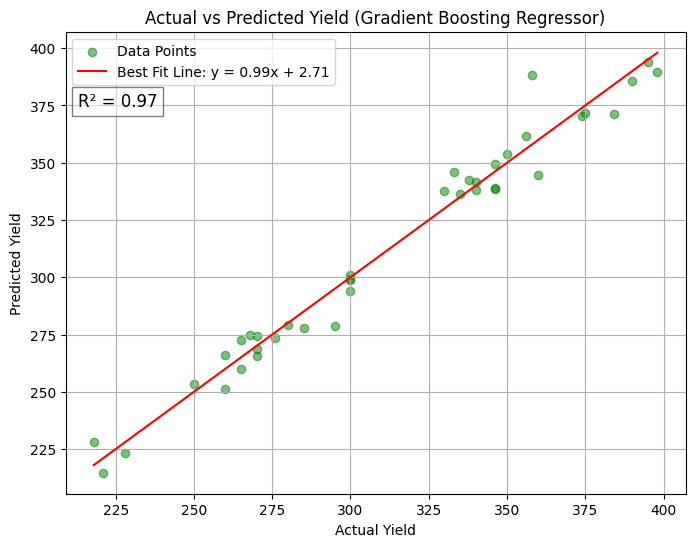


ExtraTrees Regressor
R2: 0.98
MAE: 6.00
MSE: 62.01
RMSE: 7.87


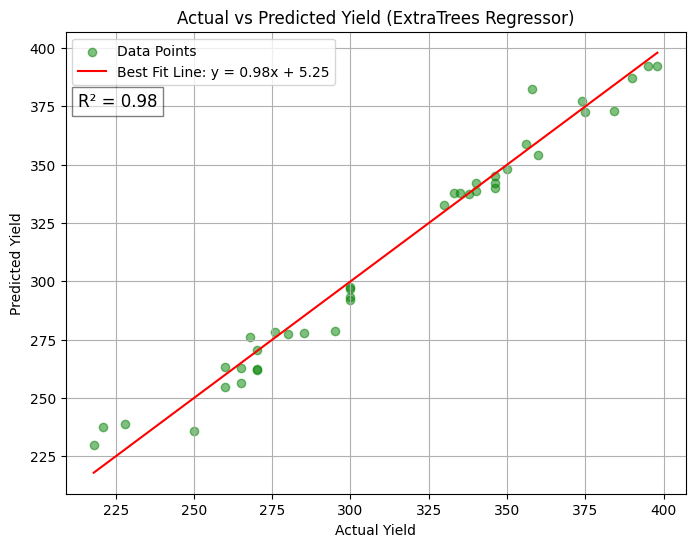


Bayesian Ridge
R2: 0.00
MAE: 44.08
MSE: 2487.73
RMSE: 49.88


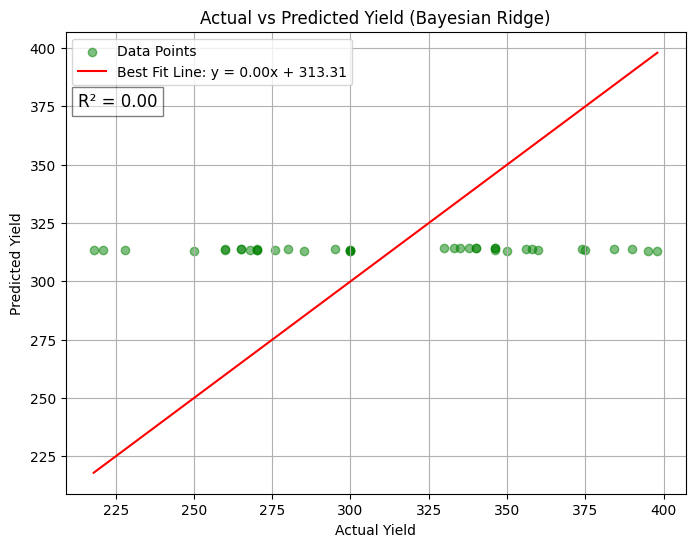


Elastic Net CV
R2: 0.30
MAE: 34.00
MSE: 1750.79
RMSE: 41.84


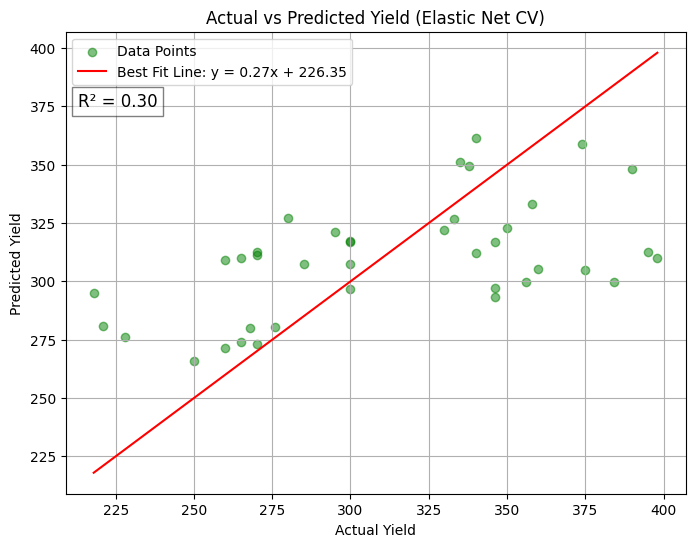

In [ ]:
regression(X_train, X_test, y_train, y_test)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit the scaler to the numerical data
scaler.fit(X_train)

# Transform the numerical columns using the scaler
X_train_selected = scaler.transform(X_train)
X_test_selected = scaler.transform(X_test)

Linear Regression
R2: 0.19
MAE: 48.52
MSE: 2745.89
RMSE: 52.40


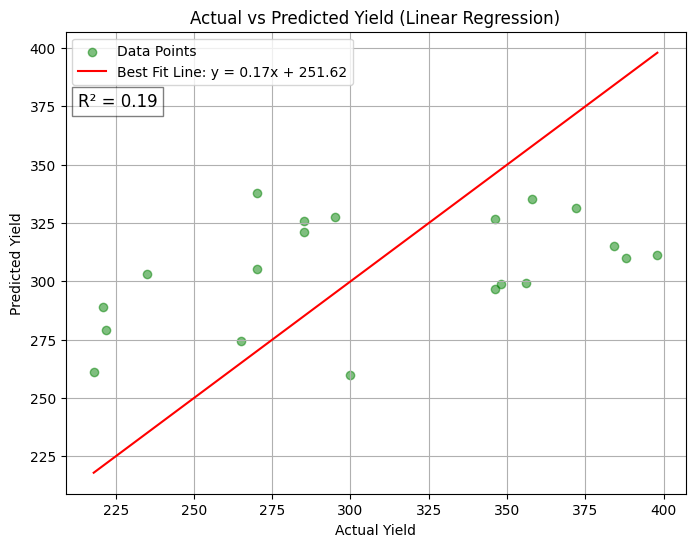


Supprt Vector Regressor
R2: -0.01
MAE: 52.14
MSE: 3431.14
RMSE: 58.58


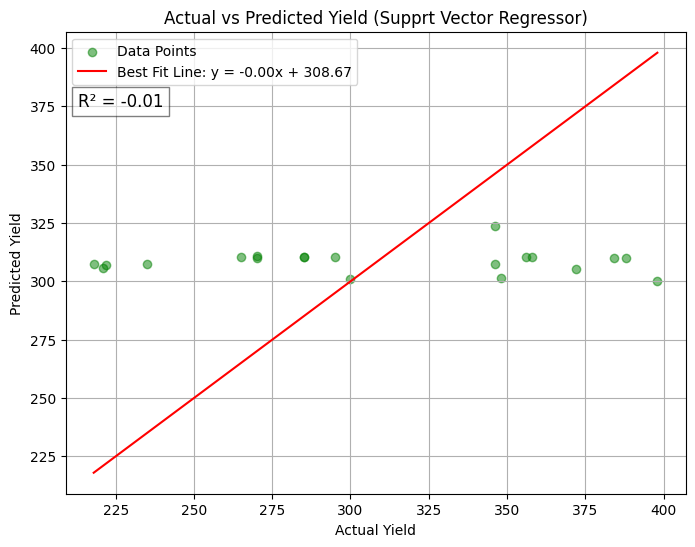


KNN
R2: 0.07
MAE: 42.92
MSE: 3157.89
RMSE: 56.20


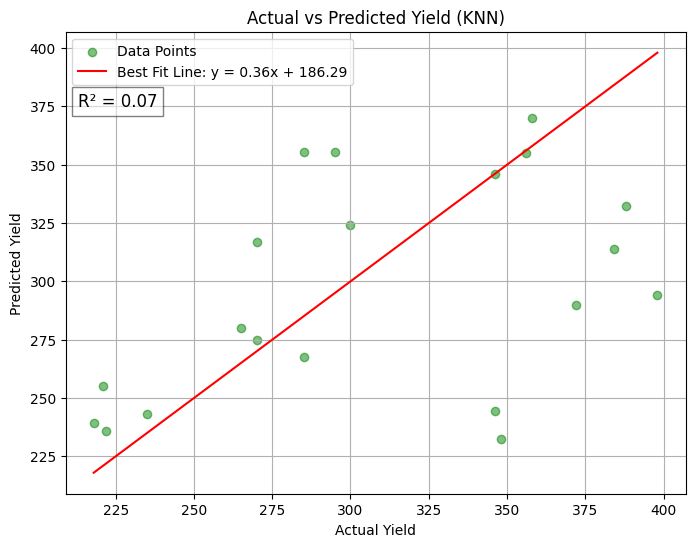


Lasso
R2: 0.20
MAE: 48.46
MSE: 2740.24
RMSE: 52.35


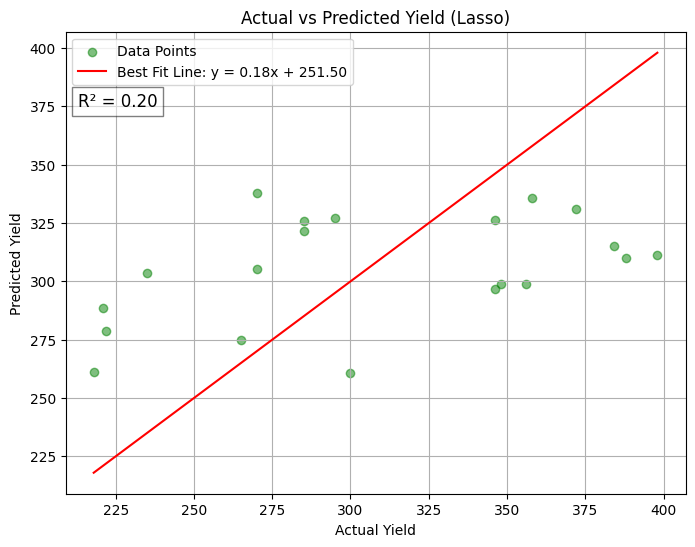


Decisin Tree regresson
R2: -0.04
MAE: 38.90
MSE: 3554.60
RMSE: 59.62


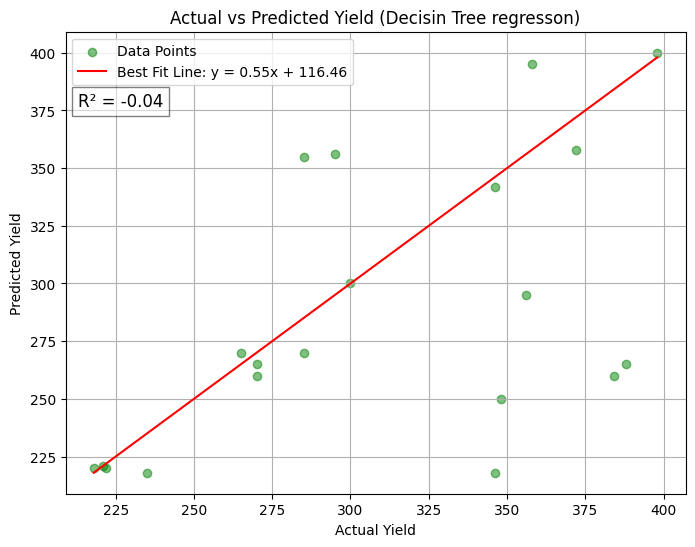


Random Forest Regressor
R2: 0.91
MAE: 13.25
MSE: 294.53
RMSE: 17.16


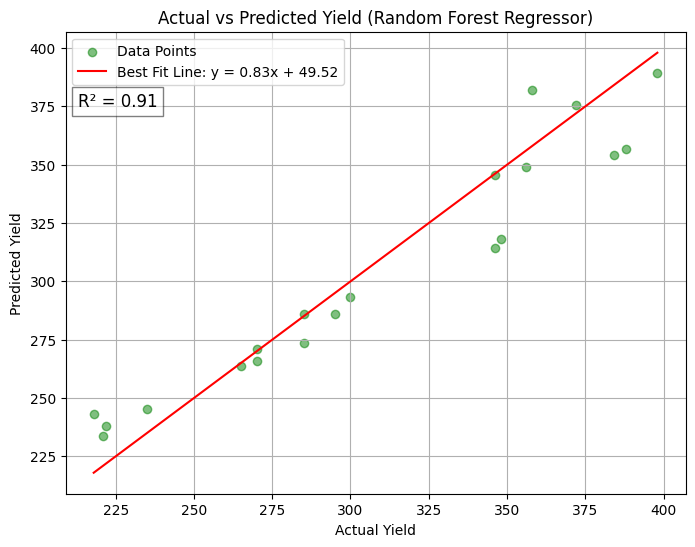


Gradient Boosting Regressor
R2: 0.95
MAE: 9.53
MSE: 156.94
RMSE: 12.53


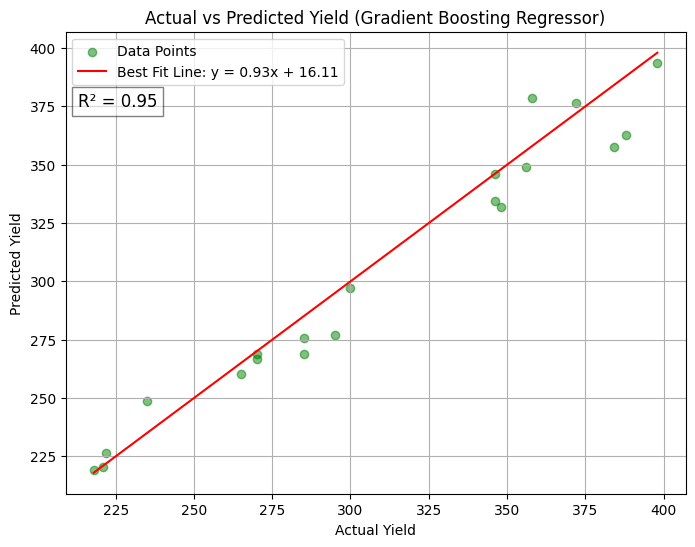


ExtraTrees Regressor
R2: 0.97
MAE: 8.17
MSE: 111.98
RMSE: 10.58


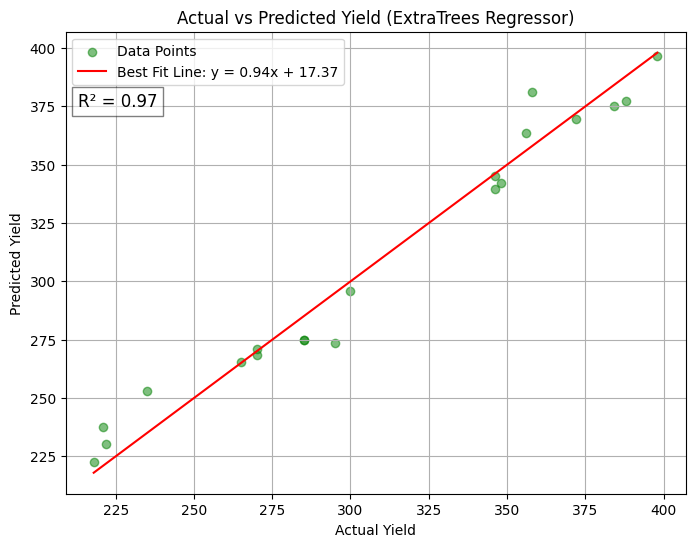


Bayesian Ridge
R2: 0.18
MAE: 48.54
MSE: 2807.48
RMSE: 52.99


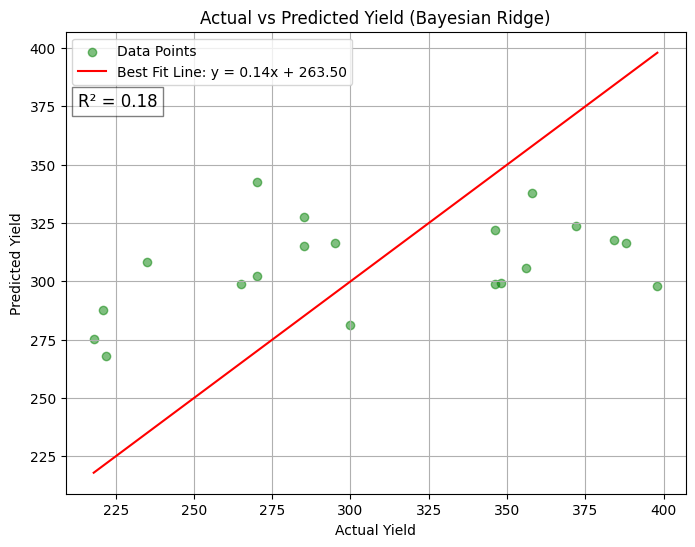


Elastic Net CV
R2: 0.16
MAE: 48.68
MSE: 2847.19
RMSE: 53.36


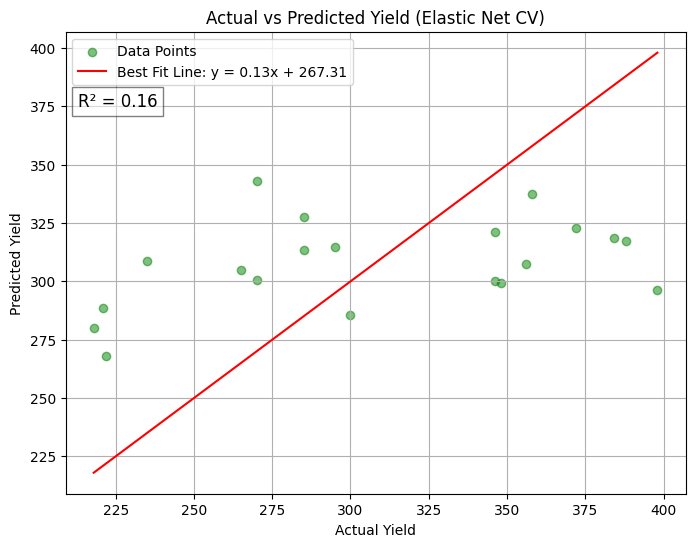

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.26
MAE: 42.88
MSE: 2396.85
RMSE: 48.96


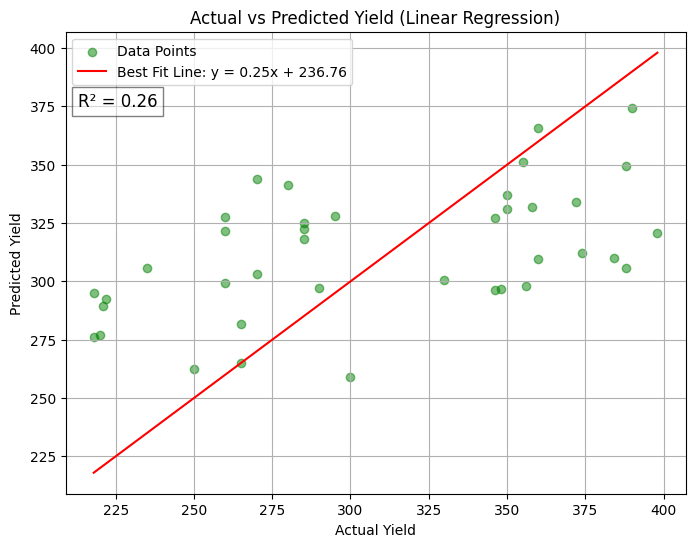


Supprt Vector Regressor
R2: 0.00
MAE: 51.16
MSE: 3244.54
RMSE: 56.96


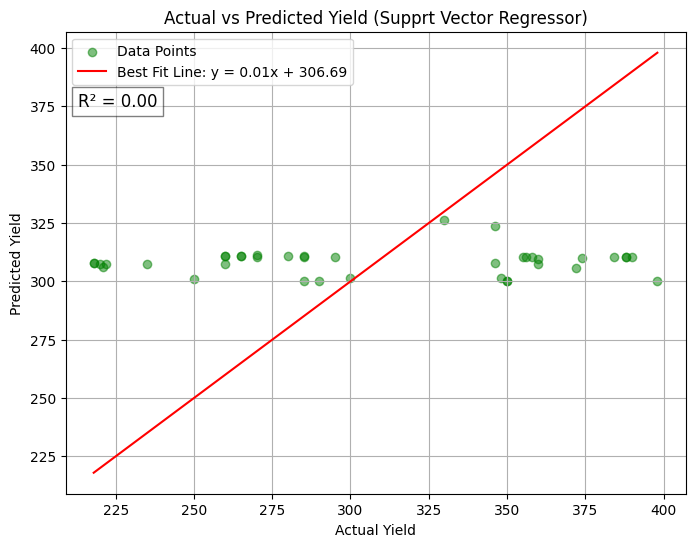


KNN
R2: 0.06
MAE: 42.35
MSE: 3070.21
RMSE: 55.41


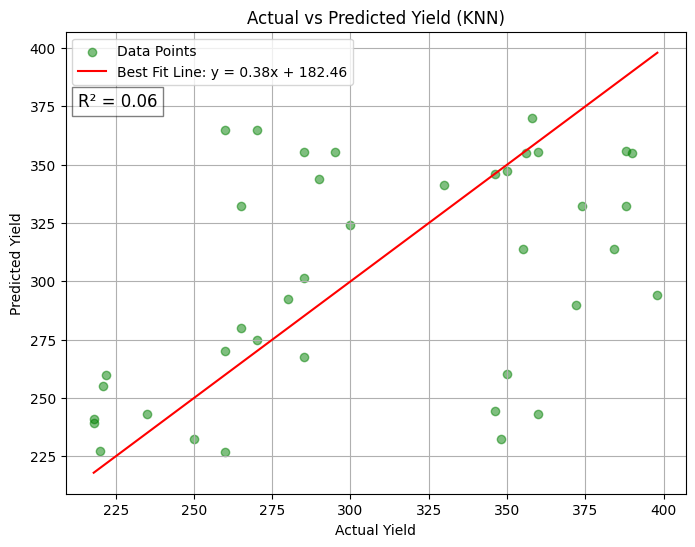


Lasso
R2: 0.26
MAE: 42.84
MSE: 2392.22
RMSE: 48.91


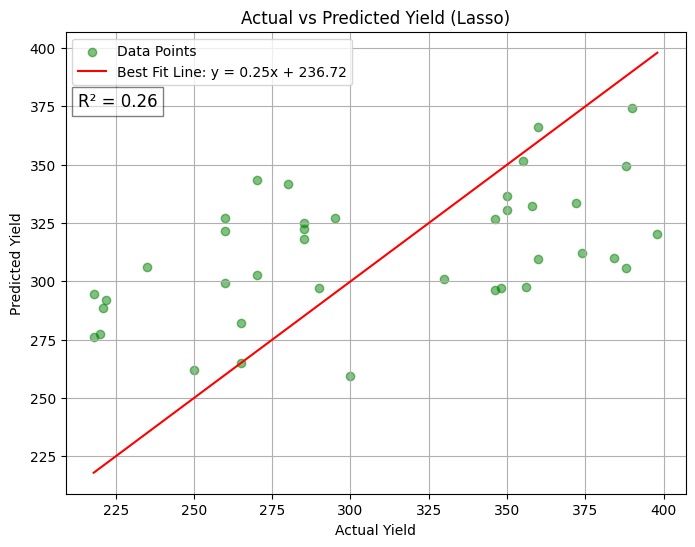


Decisin Tree regresson
R2: 0.91
MAE: 11.41
MSE: 295.41
RMSE: 17.19


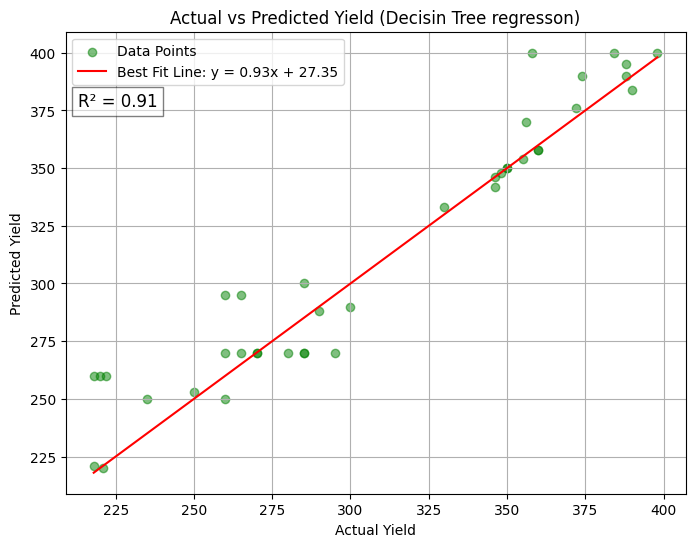


Random Forest Regressor
R2: 0.91
MAE: 12.00
MSE: 295.89
RMSE: 17.20


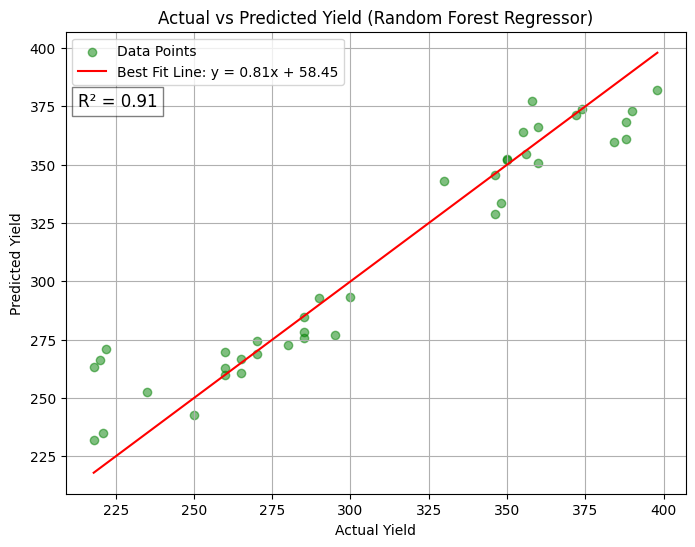


Gradient Boosting Regressor
R2: 0.94
MAE: 10.25
MSE: 186.77
RMSE: 13.67


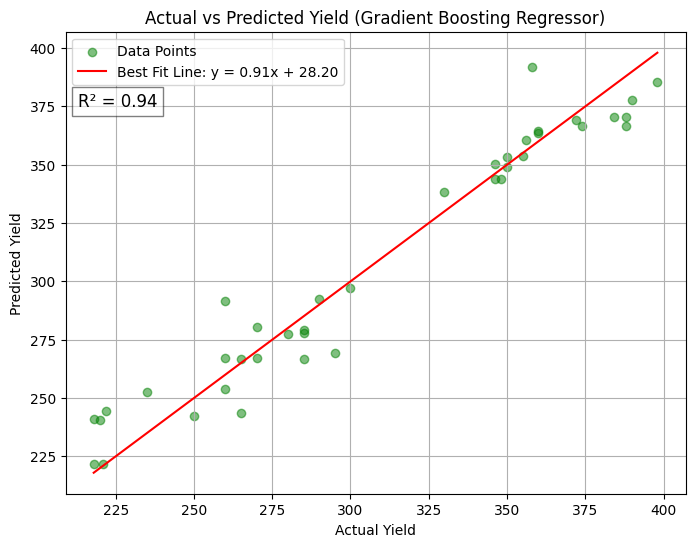


ExtraTrees Regressor
R2: 0.96
MAE: 8.83
MSE: 138.43
RMSE: 11.77


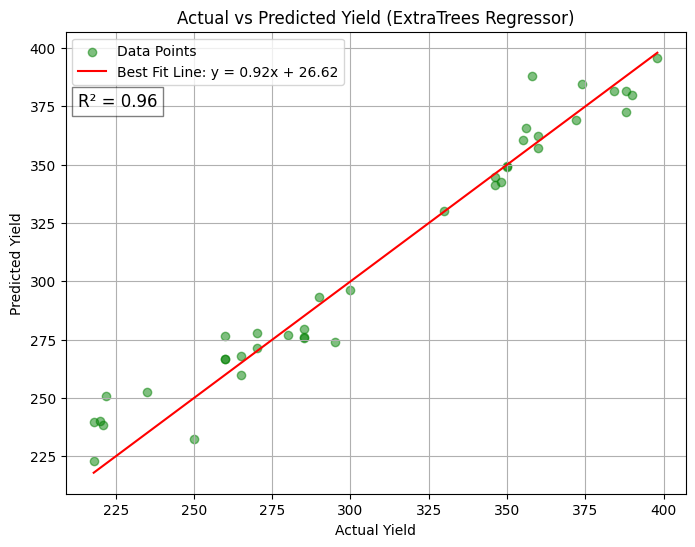


Bayesian Ridge
R2: -0.01
MAE: 52.12
MSE: 3277.82
RMSE: 57.25


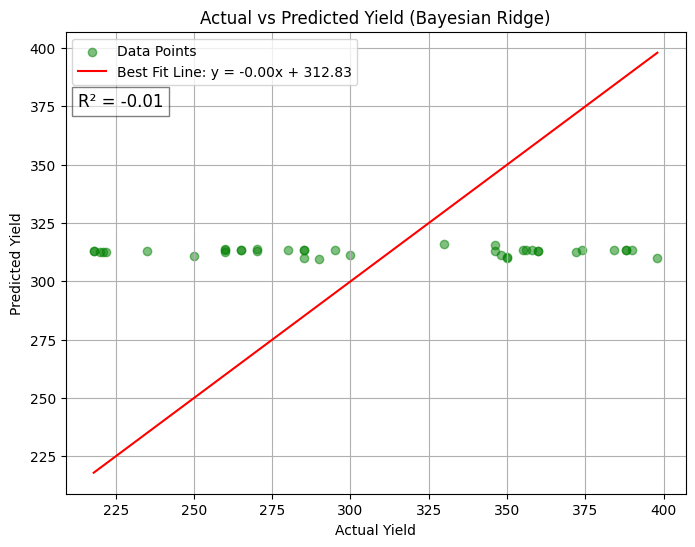


Elastic Net CV
R2: 0.18
MAE: 45.68
MSE: 2674.81
RMSE: 51.72


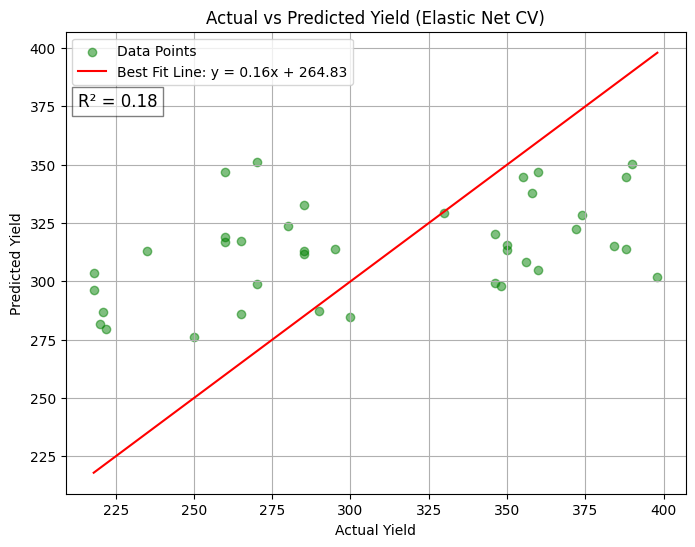

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.22
MAE: 41.49
MSE: 2375.28
RMSE: 48.74


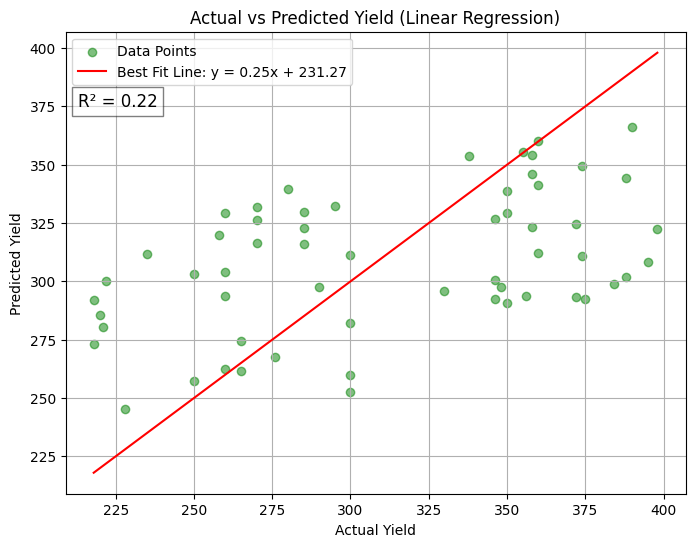


Supprt Vector Regressor
R2: 0.00
MAE: 48.85
MSE: 3026.99
RMSE: 55.02


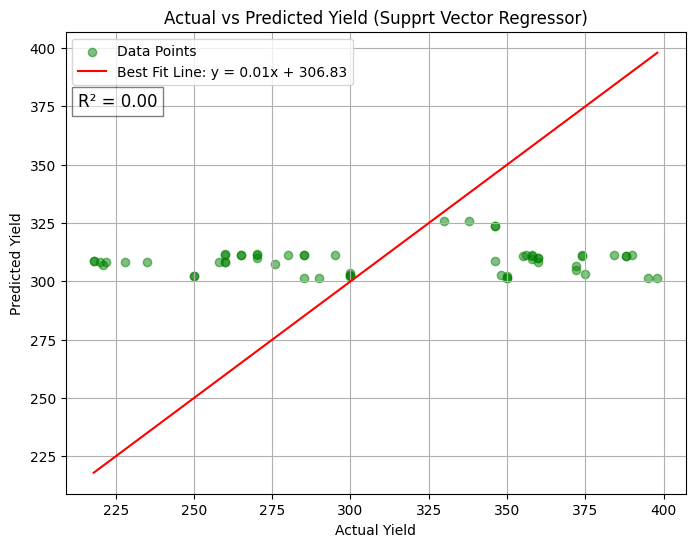


KNN
R2: -0.08
MAE: 44.23
MSE: 3263.62
RMSE: 57.13


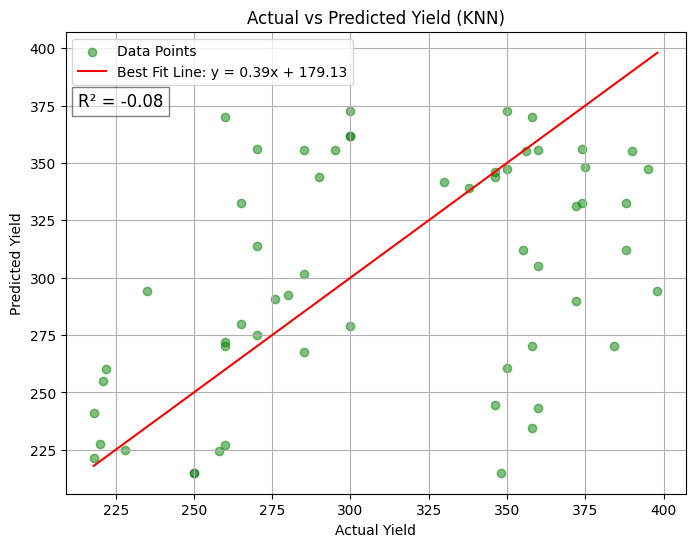


Lasso
R2: 0.22
MAE: 41.48
MSE: 2371.02
RMSE: 48.69


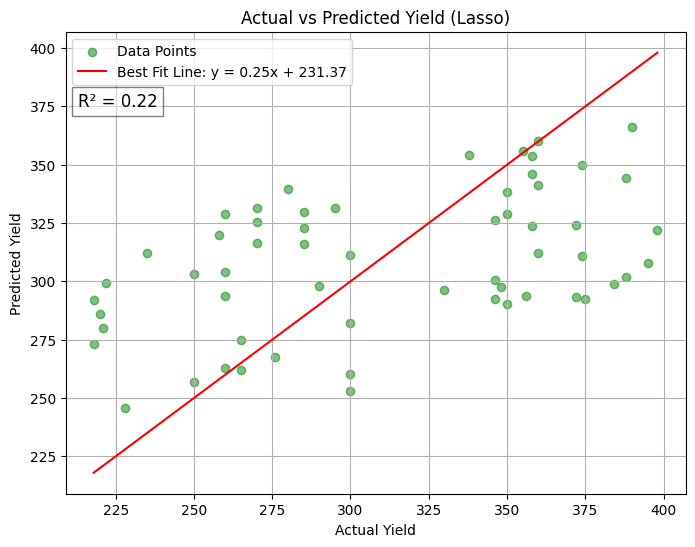


Decisin Tree regresson
R2: 0.87
MAE: 13.60
MSE: 404.02
RMSE: 20.10


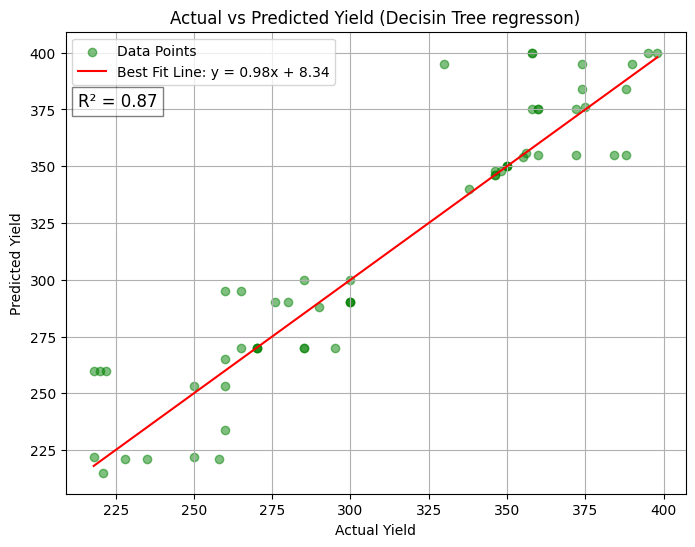


Random Forest Regressor
R2: 0.91
MAE: 11.56
MSE: 274.57
RMSE: 16.57


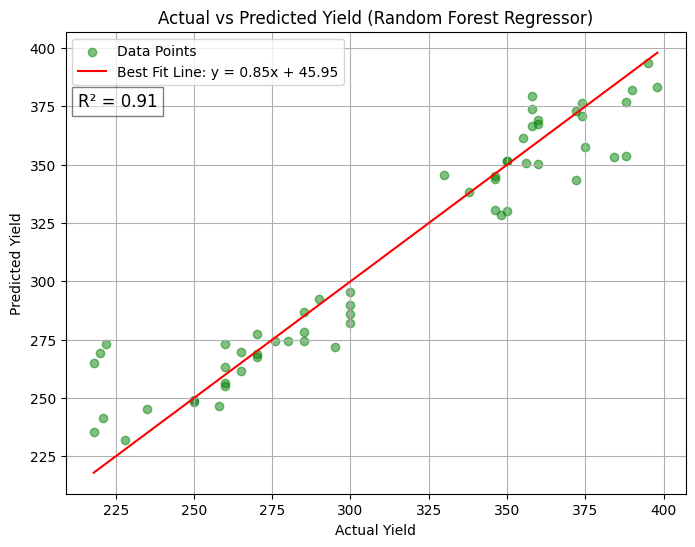


Gradient Boosting Regressor
R2: 0.95
MAE: 9.15
MSE: 152.76
RMSE: 12.36


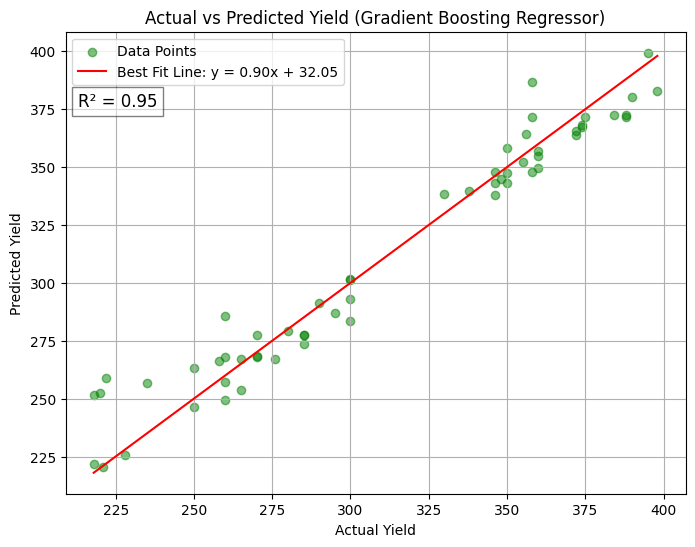


ExtraTrees Regressor
R2: 0.96
MAE: 7.83
MSE: 105.96
RMSE: 10.29


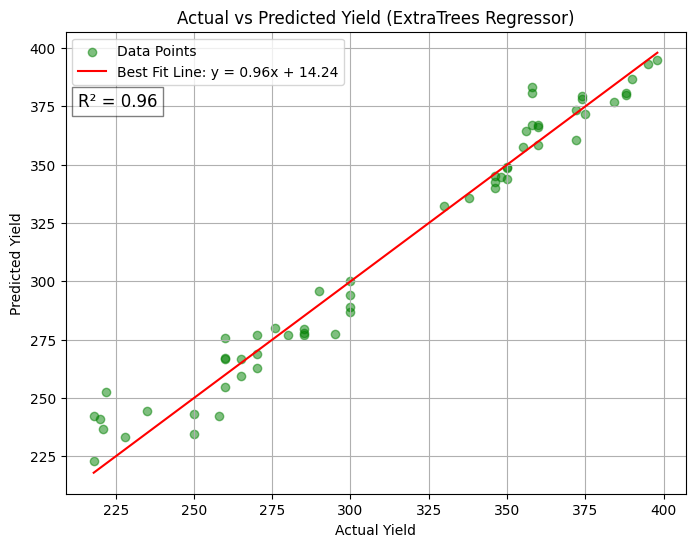


Bayesian Ridge
R2: -0.00
MAE: 49.90
MSE: 3029.35
RMSE: 55.04


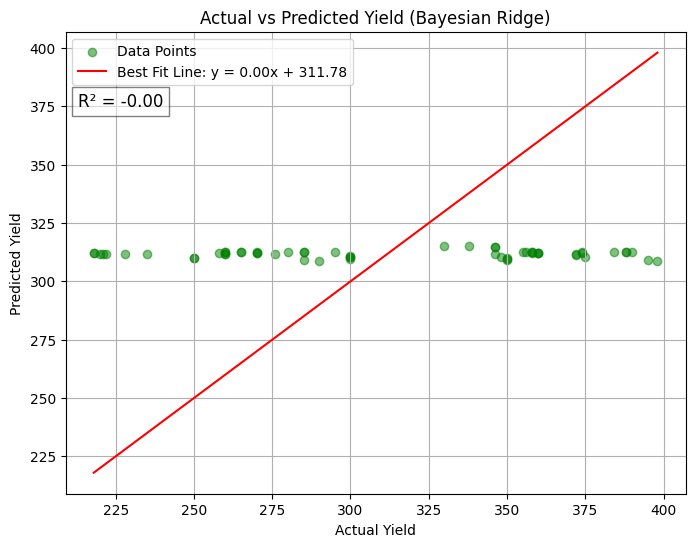


Elastic Net CV
R2: 0.18
MAE: 43.57
MSE: 2474.60
RMSE: 49.75


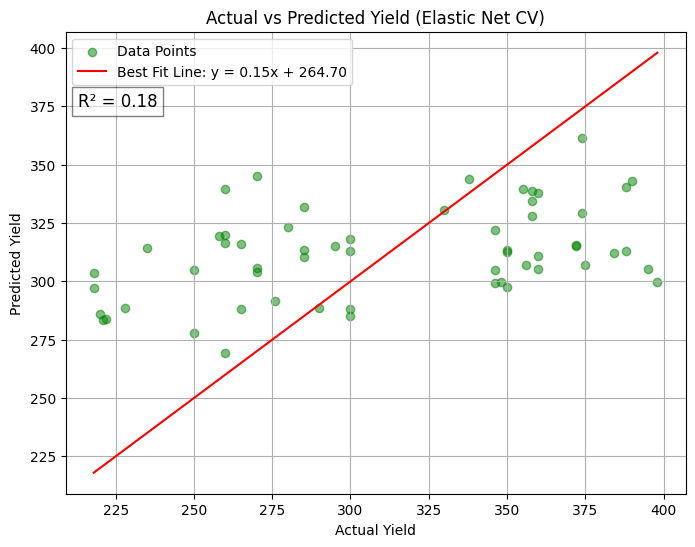

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.17
MAE: 39.51
MSE: 2236.55
RMSE: 47.29


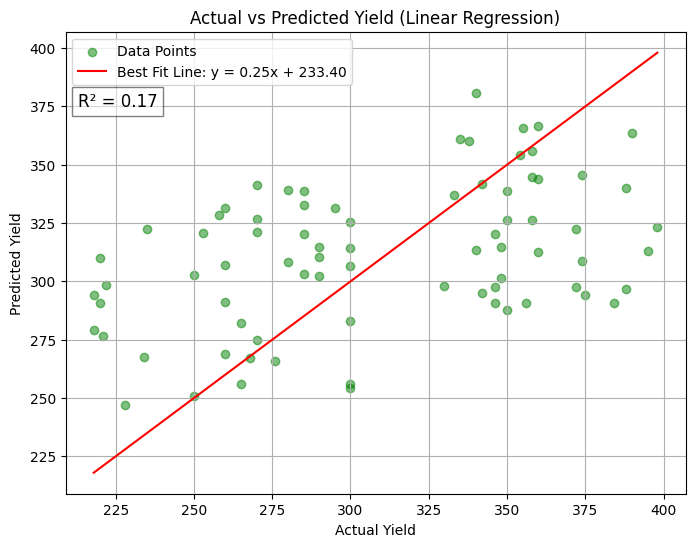


Supprt Vector Regressor
R2: -0.02
MAE: 45.37
MSE: 2739.82
RMSE: 52.34


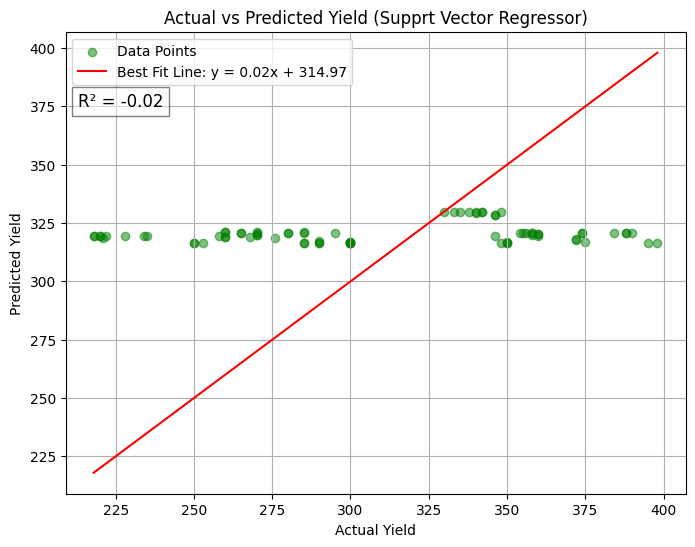


KNN
R2: 0.03
MAE: 37.95
MSE: 2605.29
RMSE: 51.04


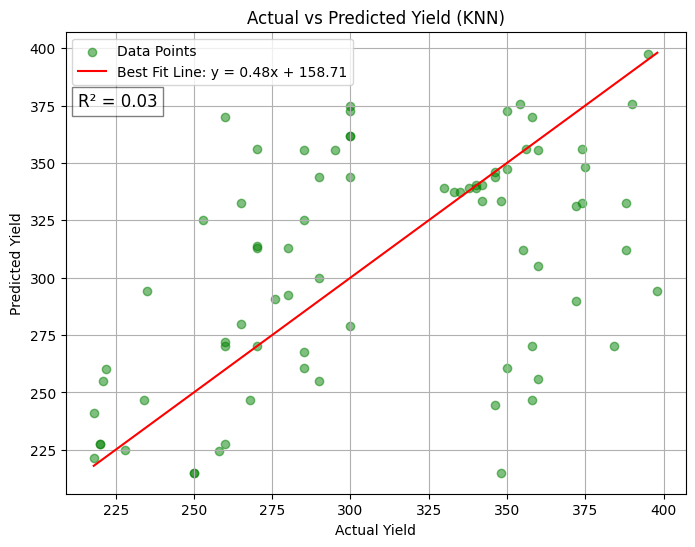


Lasso
R2: 0.17
MAE: 39.48
MSE: 2234.53
RMSE: 47.27


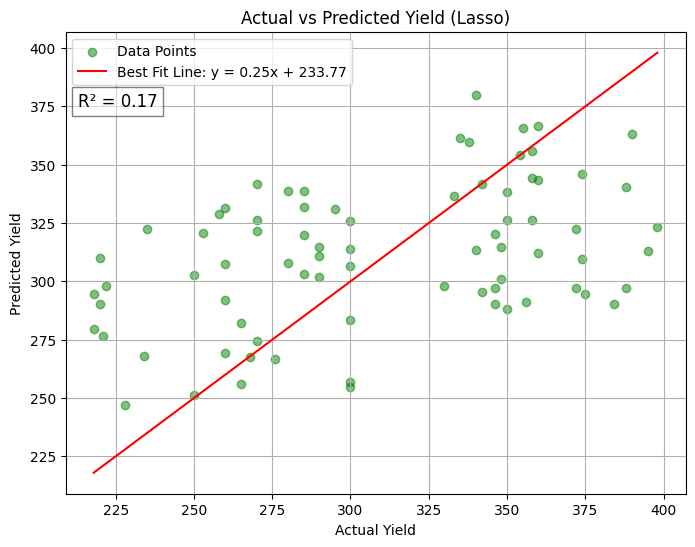


Decisin Tree regresson
R2: 0.85
MAE: 12.97
MSE: 397.23
RMSE: 19.93


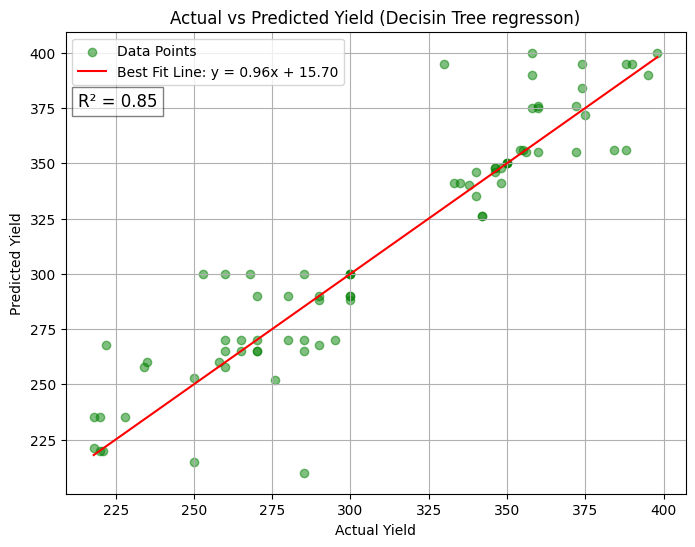


Random Forest Regressor
R2: 0.88
MAE: 12.07
MSE: 317.43
RMSE: 17.82


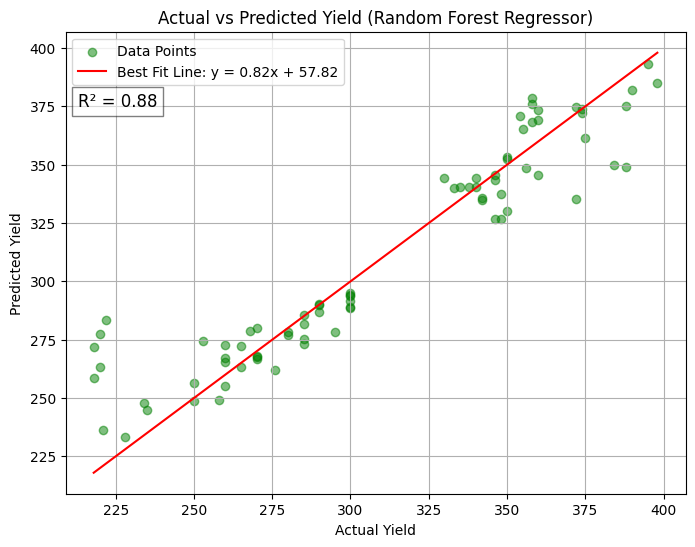


Gradient Boosting Regressor
R2: 0.95
MAE: 8.14
MSE: 137.19
RMSE: 11.71


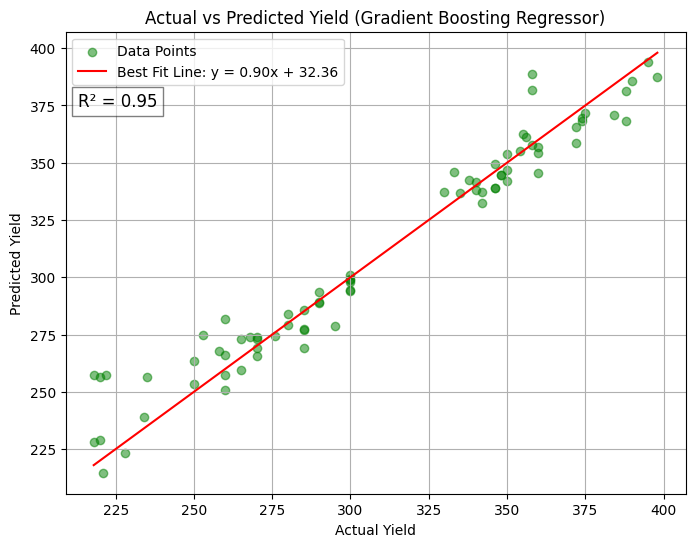


ExtraTrees Regressor
R2: 0.96
MAE: 8.19
MSE: 114.86
RMSE: 10.72


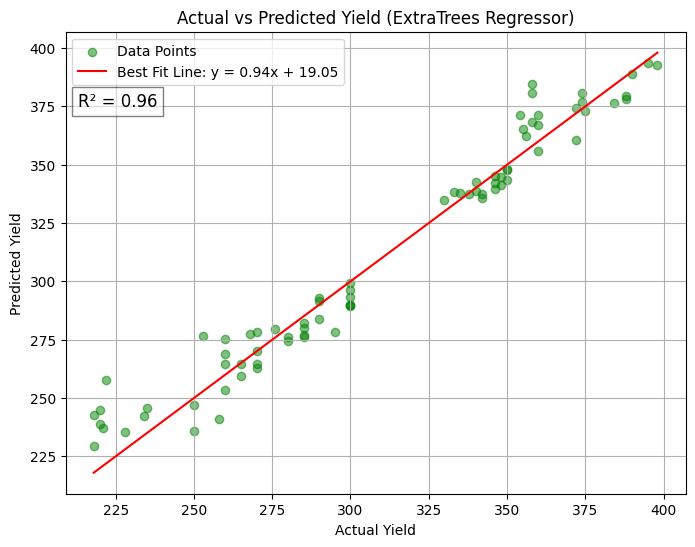


Bayesian Ridge
R2: -0.01
MAE: 46.53
MSE: 2703.14
RMSE: 51.99


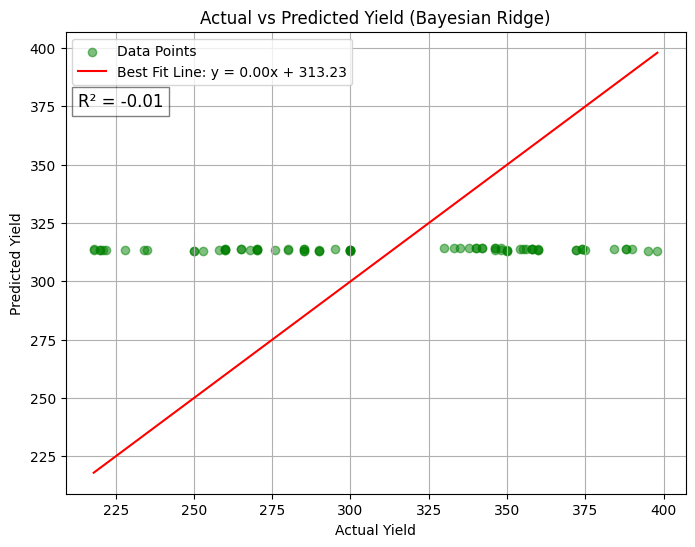


Elastic Net CV
R2: 0.19
MAE: 39.22
MSE: 2186.41
RMSE: 46.76


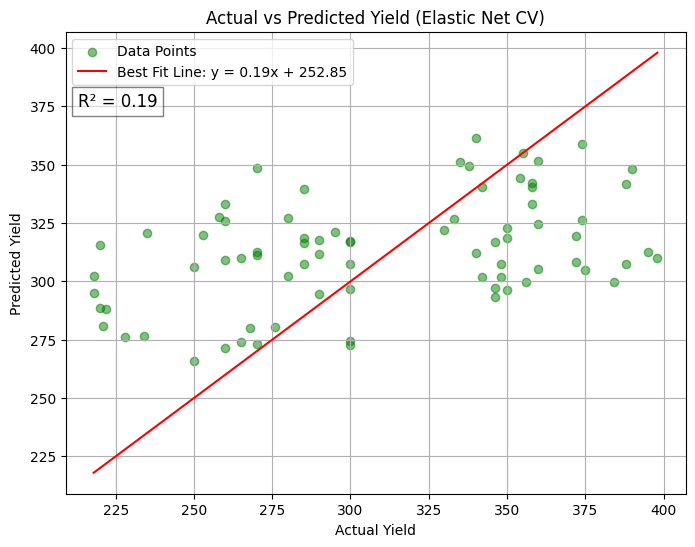

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.15
MAE: 40.20
MSE: 2286.49
RMSE: 47.82


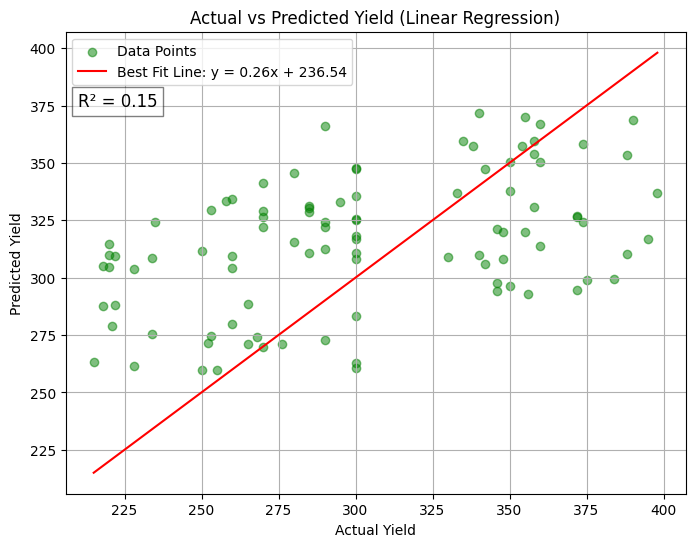


Supprt Vector Regressor
R2: -0.56
MAE: 53.44
MSE: 4181.58
RMSE: 64.67


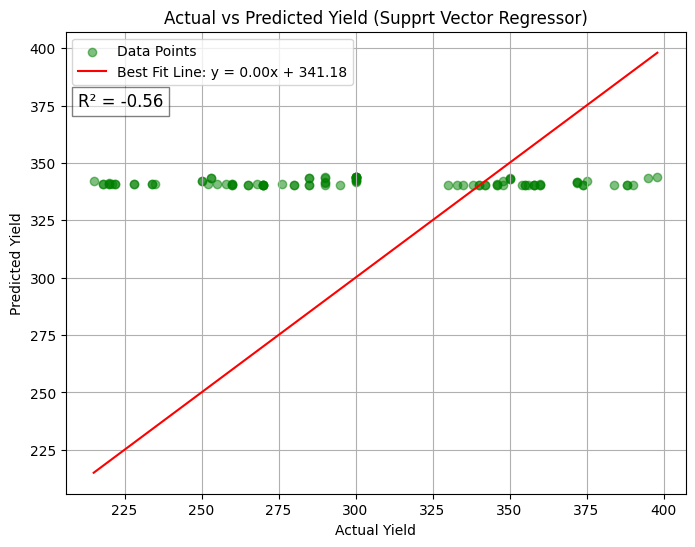


KNN
R2: 0.12
MAE: 36.12
MSE: 2354.29
RMSE: 48.52


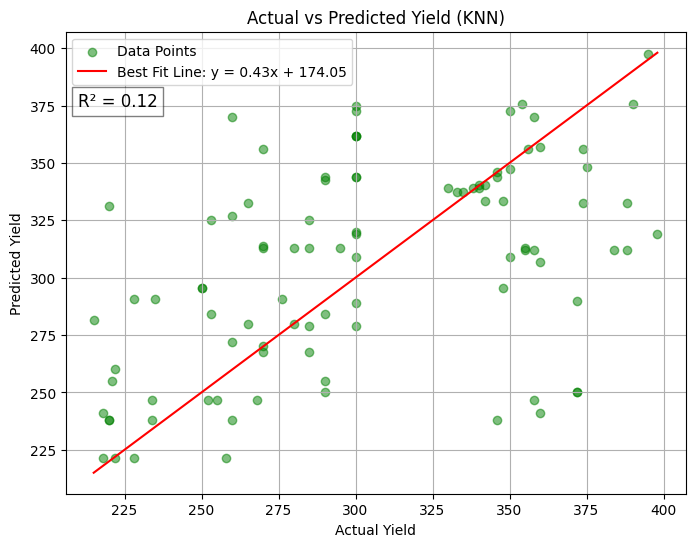


Lasso
R2: 0.15
MAE: 40.20
MSE: 2289.10
RMSE: 47.84


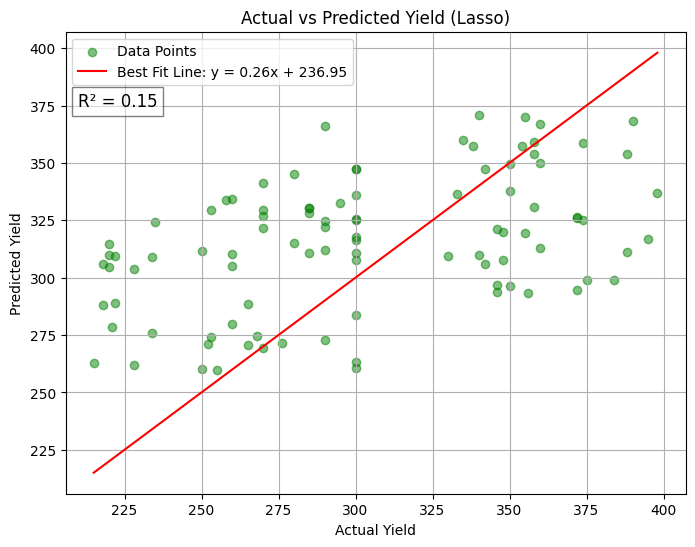


Decisin Tree regresson
R2: 0.89
MAE: 12.04
MSE: 308.21
RMSE: 17.56


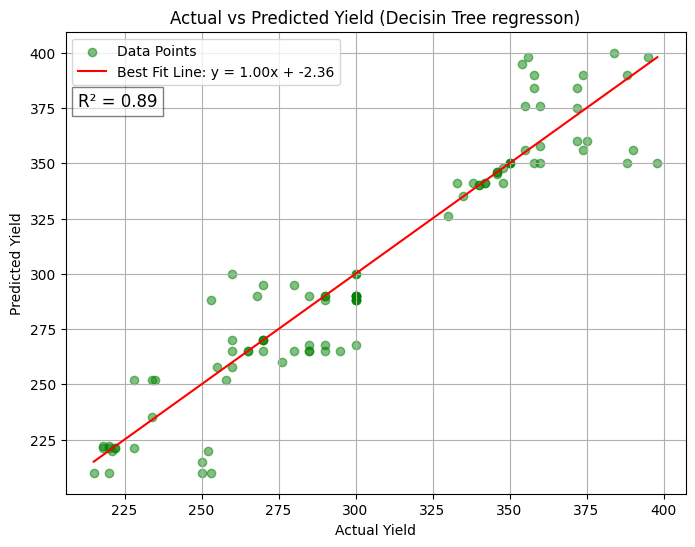


Random Forest Regressor
R2: 0.81
MAE: 14.99
MSE: 504.99
RMSE: 22.47


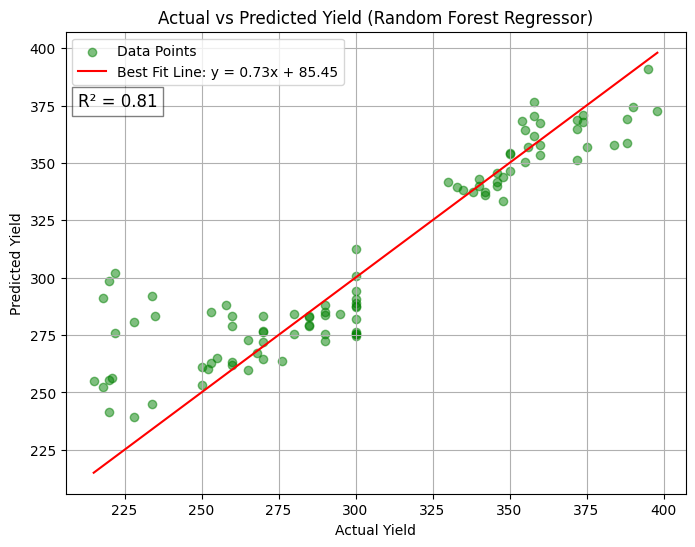


Gradient Boosting Regressor
R2: 0.90
MAE: 12.01
MSE: 272.27
RMSE: 16.50


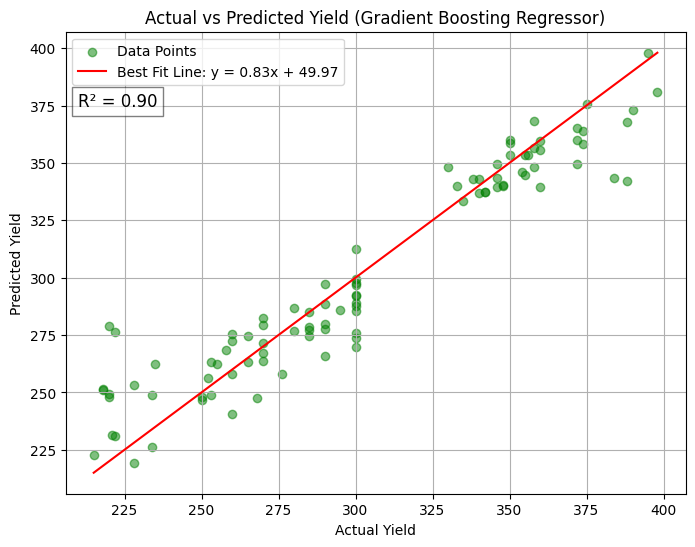


ExtraTrees Regressor
R2: 0.94
MAE: 9.46
MSE: 154.81
RMSE: 12.44


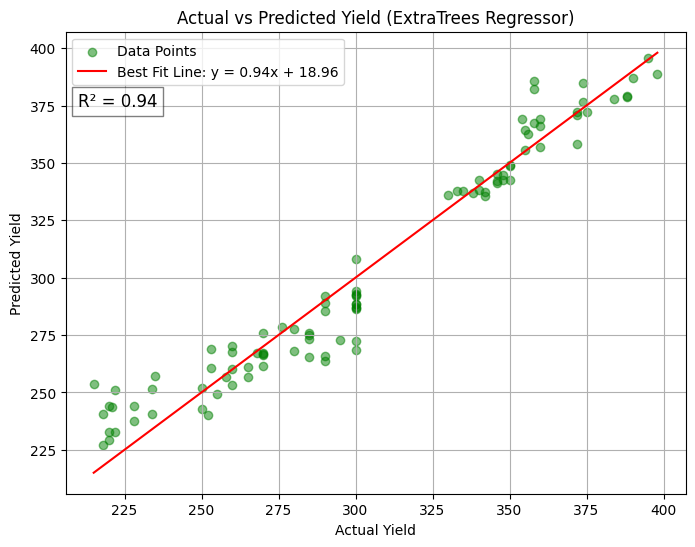


Bayesian Ridge
R2: -0.13
MAE: 48.44
MSE: 3021.71
RMSE: 54.97


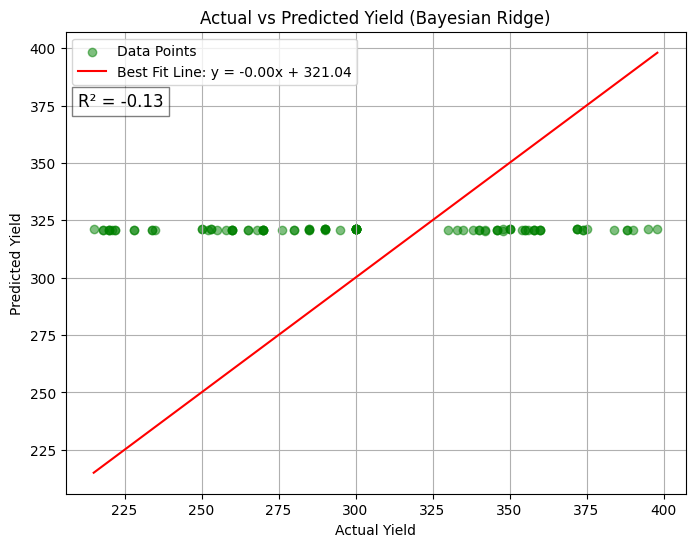


Elastic Net CV
R2: 0.14
MAE: 40.25
MSE: 2305.68
RMSE: 48.02


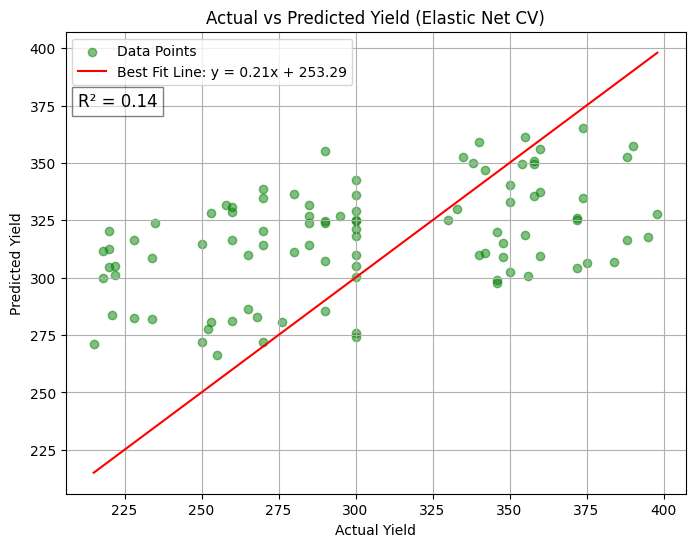

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
regression(X_train, X_test, y_train, y_test)

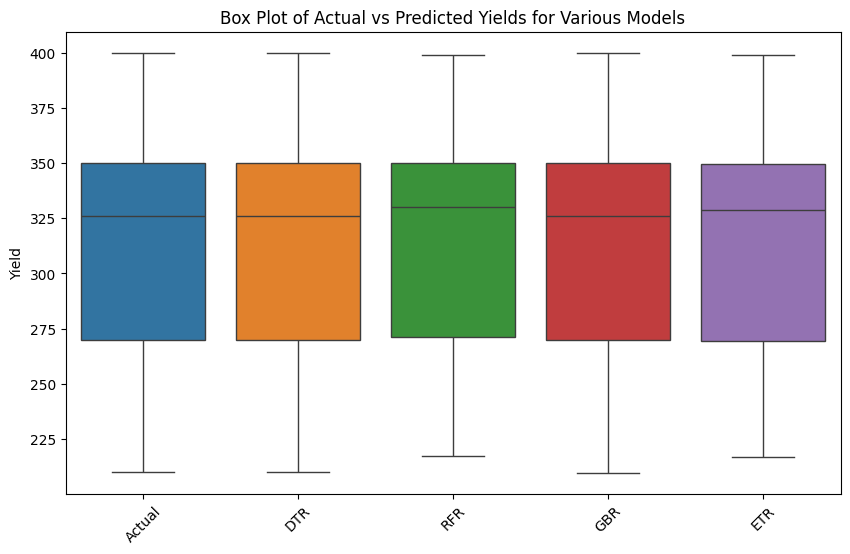


Descriptive statistics for Actual and Predicted values:
           Actual         DTR         RFR         GBR         ETR
count  153.000000  153.000000  153.000000  153.000000  153.000000
mean   312.777778  312.777778  312.759869  312.777778  312.777778
std     53.065280   53.065280   50.556417   53.054067   52.332310
min    210.000000  210.000000  217.375000  209.760904  216.915500
25%    270.000000  270.000000  271.115000  269.770376  269.545667
50%    326.000000  326.000000  329.875000  326.052144  328.661500
75%    350.000000  350.000000  350.165000  350.021565  349.667833
max    400.000000  400.000000  398.670000  400.011672  398.789167

Skewness for Actual and Predicted values:
Actual   -0.20
DTR      -0.20
RFR      -0.15
GBR      -0.20
ETR      -0.17
dtype: float64

Kurtosis for Actual and Predicted values:
Actual   -1.01
DTR      -1.01
RFR      -1.16
GBR      -1.01
ETR      -1.09
dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

# # Load your dataset (replace with your actual dataset)
# data = pd.read_excel('/path_to_your_dataset.xlsx')

# Split the data into features and target
X = data2.drop(columns=["Yeild"])  # Features
y = data2["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the models
models = {
        'DTR':DecisionTreeRegressor(random_state=0),
        'RFR': RandomForestRegressor(n_estimators=200),
        'GBR': GradientBoostingRegressor(n_estimators=500),
        'ETR': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
}

# Dictionary to store predictions
predictions = {}

# Train each model and make predictions
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)  # Predictions on training data
    predictions[model_name] = y_pred_train  # Store predictions

# Combine actual and predicted values into a DataFrame for plotting
results = pd.DataFrame({
    'Actual': y_train
})

# Add predictions for each model
for model_name, y_pred_train in predictions.items():
    results[model_name] = y_pred_train

# Plot the box plots for actual vs predicted yields
plt.figure(figsize=(10, 6))
sns.boxplot(data=results)
plt.title('Box Plot of Actual vs Predicted Yields for Various Models')
plt.ylabel('Yield')
plt.xticks(rotation=45)
plt.show()

# Print the descriptive statistics for the actual and predicted values
print("\nDescriptive statistics for Actual and Predicted values:")
print(results.describe())
# Calculate and print skewness and kurtosis for actual and predicted values
print("\nSkewness for Actual and Predicted values:")
print(results.apply(lambda x: skew(x.dropna())).round(2))

print("\nKurtosis for Actual and Predicted values:")
print(results.apply(lambda x: kurtosis(x.dropna())).round(2))


# **Sln5B**

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
data3=pd.read_excel(r"/content/drive/MyDrive/Cfy_dataset/group-01_Sln5B.xlsx")

In [ ]:
data3.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [ ]:
data3

,yearFrom,yearTo,month,fort_night,CLR_Incidence,T_max,T_min,RH,RF,%OC,P,K,pH,spacing,Age,Yeild
0,2015,2016,April,1st,3.94,29.88,19.07,82.07,76.1,7.50,18.0,286.0,7.0,81,70,300
1,2015,2016,April,2nd,2.11,29.67,18.97,83.47,193.7,6.60,78.0,63.0,5.5,36,80,290
2,2015,2016,May,1st,3.85,29.67,18.93,84.20,288.7,6.60,77.0,125.0,6.0,81,67,285
3,2015,2016,May,2nd,3.35,29.50,19.47,85.94,318.3,6.60,69.0,338.0,5.8,81,15,268
4,2015,2016,June,1st,4.32,28.80,19.40,83.87,321.1,6.60,16.0,163.0,5.6,36,15,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2022,2023,Junary,2nd,3.34,29.03,13.50,85.50,3859.8,4.01,92.0,408.0,5.5,200,10,326
188,2022,2023,February,1st,3.83,31.30,16.23,67.46,3859.8,4.01,92.0,600.0,5.7,25,26,341
189,2022,2023,February,2nd,0.89,32.07,15.26,72.69,3859.8,4.01,92.0,612.0,4.7,25,31,342
190,2022,2023,March,1st,0.00,33.30,16.73,87.60,3859.8,4.01,91.0,464.0,5.9,25,22,345


In [ ]:
data3=data3.replace(["Junary","February","March","April","May","June","July","August","September","October","November","December","1st","2nd"],[0,1,2,3,4,5,6,7,8,9,10,11,0,1,])

In [ ]:
X = data3.drop(columns=["Yeild"]) # Features
y = data3["Yeild"] # Target variable

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.svm import SVR
from math import sqrt
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.linear_model import BayesianRidge, ElasticNetCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn import linear_model
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model initialization and training
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluation
train_rmse = mean_squared_error(y_train, y_pred_train, squared=False)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)

print(f"Train RMSE: {train_rmse}")
print(f"Test RMSE: {test_rmse}")

Train RMSE: 41.98967206180899
Test RMSE: 54.694209858705996


In [ ]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)  # 60% training, 40% temp
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # 20% validation, 20% test

train_data = pd.concat([X_train, y_train], axis=1)
val_data = pd.concat([X_val, y_val], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

In [ ]:
def compute_stats(data, name):
    print(f"\n{name} Descriptive Statistics:")
    print(data3.describe())

    # Compute skewness
    skewness = data3.apply(lambda x: skew(x.dropna()))
    print("\nSkewness:")
    print(skewness)

    # Compute kurtosis
    kurtosis_values = data3.apply(lambda x: kurtosis(x.dropna()))
    print("\nKurtosis:")
    print(kurtosis_values)

# Compute stats for the entire dataset
print("Entire Dataset Statistics:")
print(data3.describe())
print("\nSkewness of entire dataset:")
print(data3.apply(lambda x: skew(x.dropna())))
print("\nKurtosis of entire dataset:")
print(data3.apply(lambda x: kurtosis(x.dropna())))

# Compute stats for each subset
compute_stats(train_data, "Training Data")
compute_stats(val_data, "Validation Data")
compute_stats(test_data, "Testing Data")

Entire Dataset Statistics:
          yearFrom       yearTo       month  fort_night  CLR_Incidence  \
count   192.000000   192.000000  192.000000  192.000000     192.000000   
mean   2018.500000  2019.500000    5.500000    0.500000       4.173437   
std       2.297278     2.297278    3.461078    0.501307       3.721831   
min    2015.000000  2016.000000    0.000000    0.000000       0.000000   
25%    2016.750000  2017.750000    2.750000    0.000000       1.075000   
50%    2018.500000  2019.500000    5.500000    0.500000       3.035000   
75%    2020.250000  2021.250000    8.250000    1.000000       6.570000   
max    2022.000000  2023.000000   11.000000    1.000000      14.700000   

            T_max       T_min          RH           RF         %OC  \
count  192.000000  192.000000  192.000000   192.000000  192.000000   
mean    28.604063   18.356979   82.382812  1801.703125    5.782760   
std      3.146644    2.035901    8.340461  1153.231773   12.104807   
min     22.900000   12.560

In [ ]:
def plot_actual_vs_predicted(y_actual, y_predicted, model_name):
    plt.figure(figsize=(8, 6))
    plt.scatter(y_actual, y_predicted, marker='o', color='green', alpha=0.5, label='Data Points')
    plt.title(f'Actual vs Predicted Yield ({model_name})')
    plt.xlabel('Actual Yield')
    plt.ylabel('Predicted Yield')
    plt.grid(True)

    # Calculate the best fit line
    m, b = np.polyfit(y_actual, y_predicted, 1)
    y_fit = m * np.array(y_actual) + b

    # plt.plot(y_actual, y_fit, 0.10,0.95, label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Add a line y = x for reference (perfect predictions line)
    x_line = np.linspace(min(y_actual), max(y_actual), 100)
    plt.plot(x_line, x_line, color='red', linestyle='-', label=f'Best Fit Line: y = {m:.2f}x + {b:.2f}')

    # Calculate R² value
    r_squared = r2_score(y_actual, y_predicted)

    # Annotate R² value on the plot
    plt.text(0.02,0.83, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.5))

    plt.legend()
    plt.show()

In [ ]:
# define regression function
def regression(X_train, X_test, y_train, y_test):
    Regressor = {
        'Linear Regression':LinearRegression(),
        'Supprt Vector Regressor':SVR(kernel='rbf'),
        'KNN':KNeighborsRegressor(n_neighbors=2),
        'Lasso':linear_model.Lasso(alpha=0.1),
        'Decisin Tree regresson':DecisionTreeRegressor(random_state=0),
        'Random Forest Regressor': RandomForestRegressor(n_estimators=200),
        'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=500),
        'ExtraTrees Regressor': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
        'Bayesian Ridge': BayesianRidge(),
        'Elastic Net CV': ElasticNetCV()
    }


    for name, clf in Regressor.items():
        print(name)
        clf.fit(X_train, y_train)
        print(f'R2: {r2_score(y_test, clf.predict(X_test)):.2f}')
        print(f'MAE: {mean_absolute_error(y_test, clf.predict(X_test)):.2f}')
        print(f'MSE: {mean_squared_error(y_test, clf.predict(X_test)):.2f}')
        print(f'RMSE: {sqrt(mean_squared_error(y_test, clf.predict(X_test))):.2f}')
        y_pred = clf.predict(X_test)
        plot_actual_vs_predicted(y_test, y_pred, name)
        print()

Linear Regression
R2: 0.21
MAE: 34.01
MSE: 1975.99
RMSE: 44.45


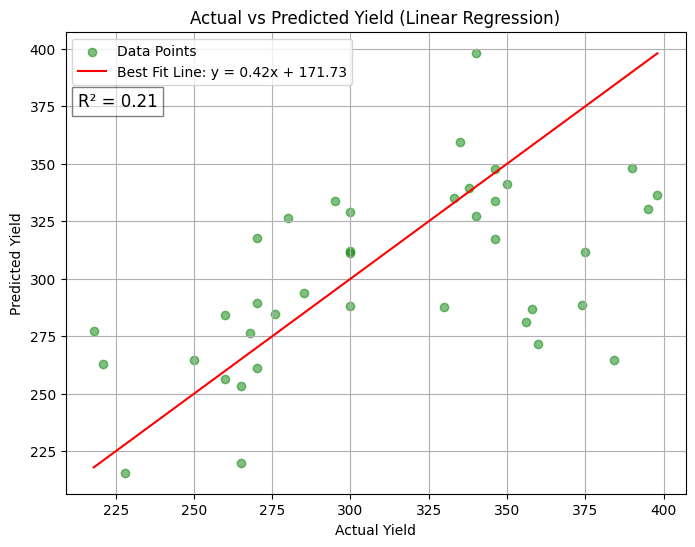


Supprt Vector Regressor
R2: -0.00
MAE: 42.21
MSE: 2492.60
RMSE: 49.93


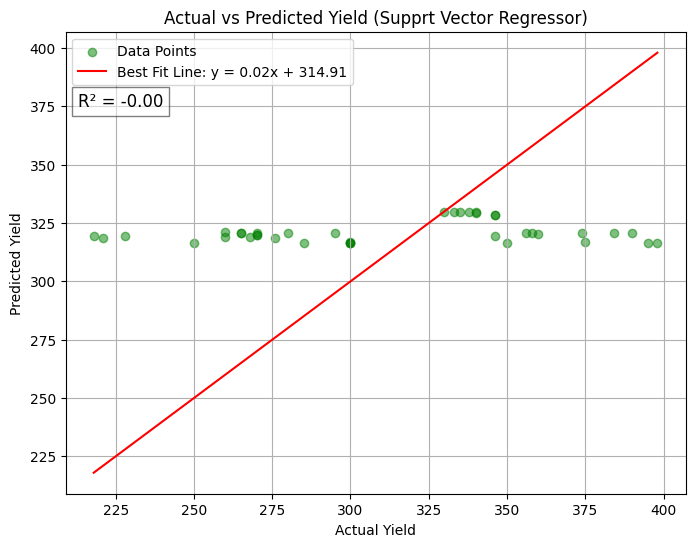


KNN
R2: 0.21
MAE: 30.28
MSE: 1973.17
RMSE: 44.42


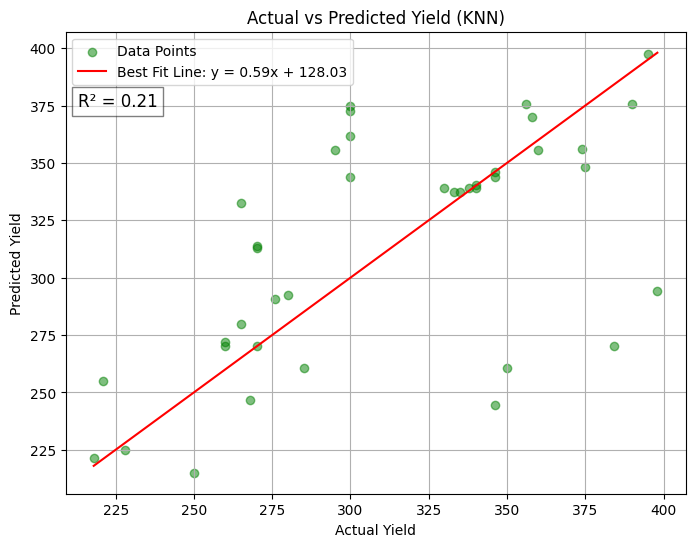


Lasso
R2: 0.21
MAE: 34.00
MSE: 1972.51
RMSE: 44.41


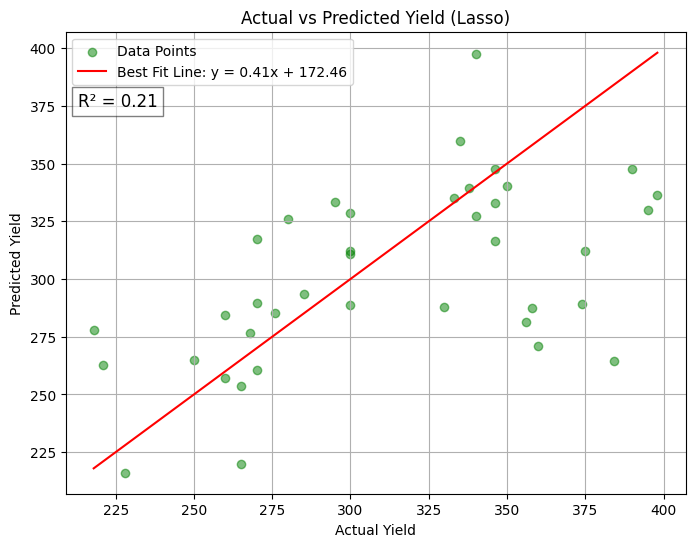


Decisin Tree regresson
R2: 0.89
MAE: 10.15
MSE: 269.59
RMSE: 16.42


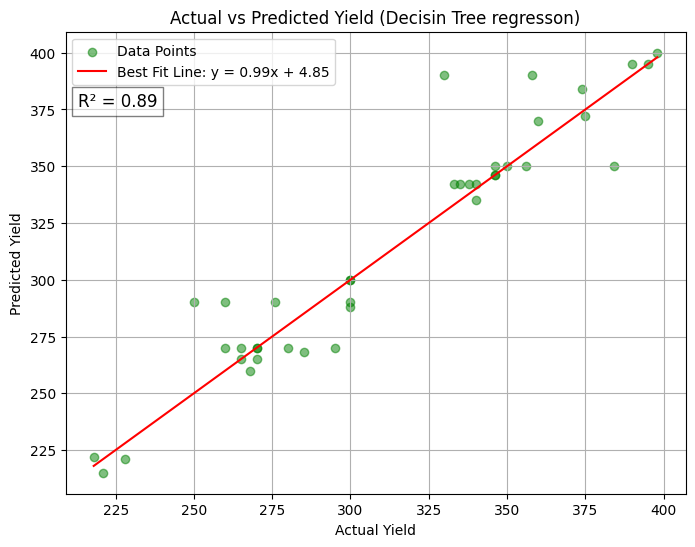


Random Forest Regressor
R2: 0.94
MAE: 9.25
MSE: 152.35
RMSE: 12.34


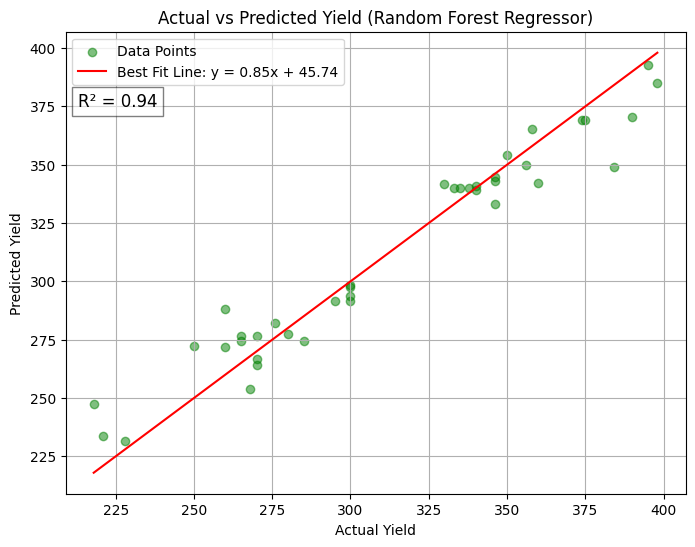


Gradient Boosting Regressor
R2: 0.95
MAE: 7.26
MSE: 121.67
RMSE: 11.03


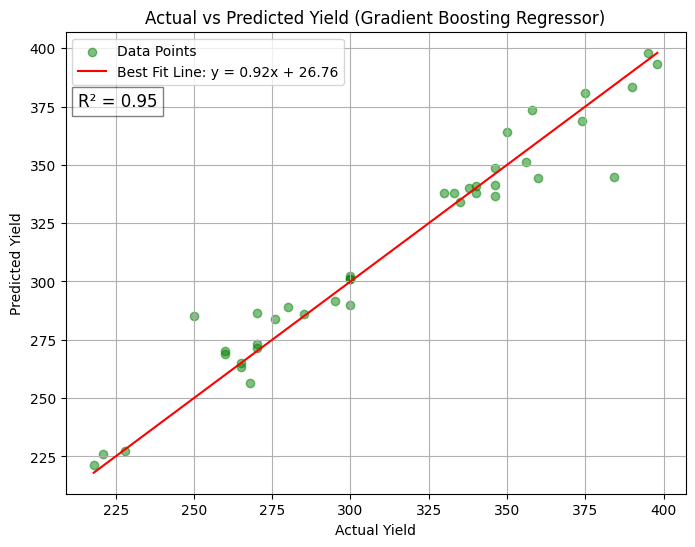


ExtraTrees Regressor
R2: 0.98
MAE: 5.05
MSE: 43.01
RMSE: 6.56


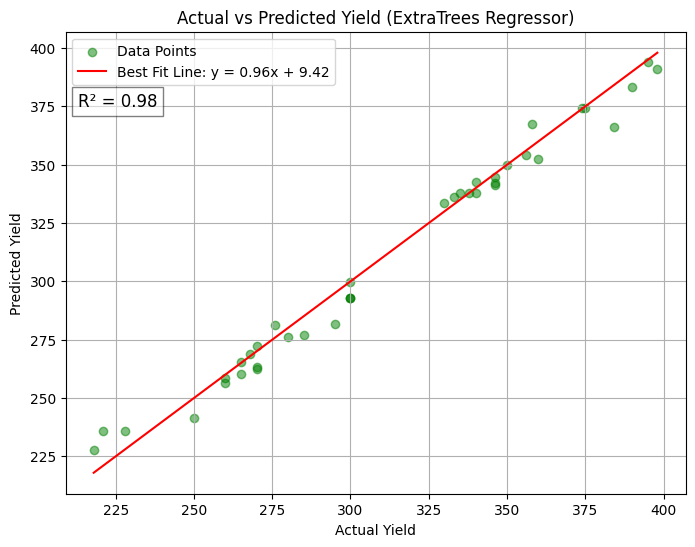


Bayesian Ridge
R2: 0.29
MAE: 33.97
MSE: 1762.62
RMSE: 41.98


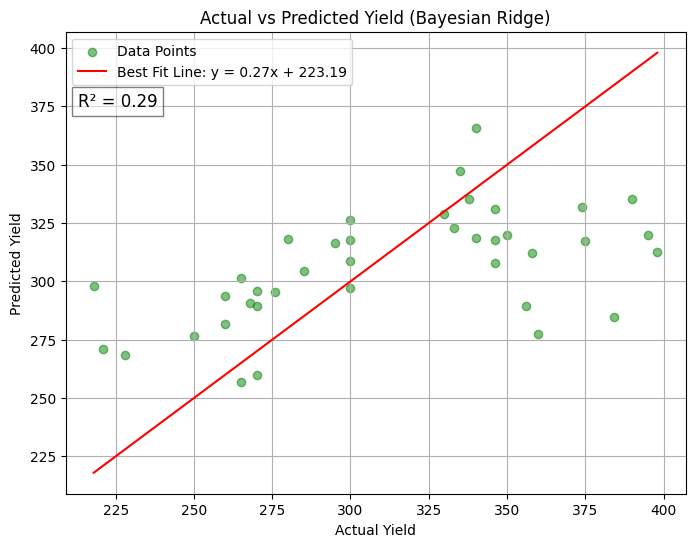


Elastic Net CV
R2: 0.29
MAE: 33.55
MSE: 1766.68
RMSE: 42.03


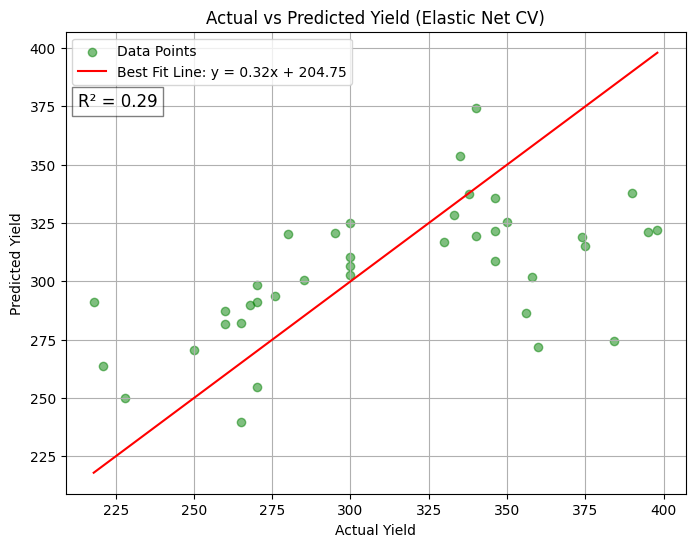

In [ ]:
regression(X_train, X_test, y_train, y_test)

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit the scaler to the numerical data
scaler.fit(X_train)

# Transform the numerical columns using the scaler
X_train_selected = scaler.transform(X_train)
X_test_selected = scaler.transform(X_test)

Linear Regression
R2: 0.04
MAE: 48.23
MSE: 3256.55
RMSE: 57.07


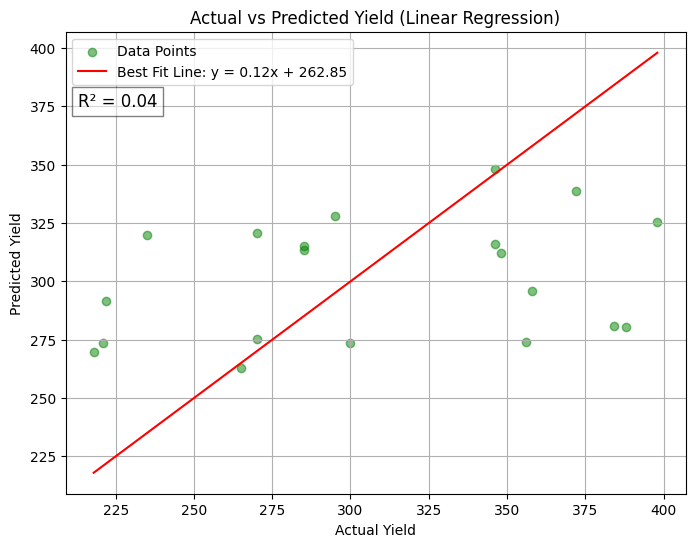


Supprt Vector Regressor
R2: -0.01
MAE: 52.14
MSE: 3431.20
RMSE: 58.58


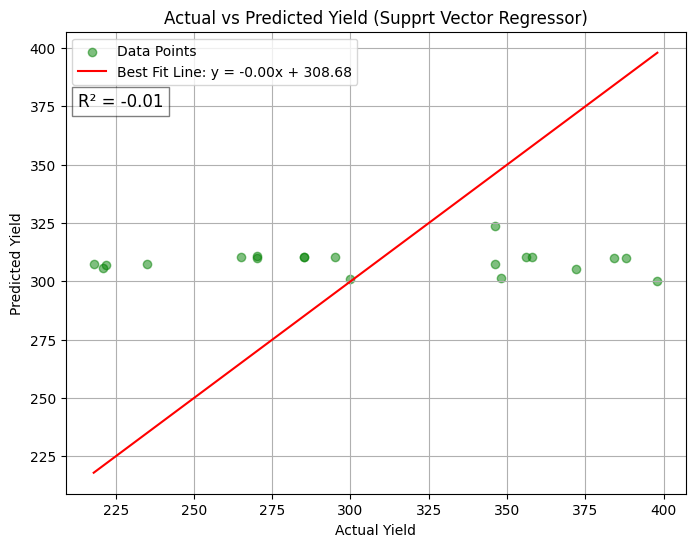


KNN
R2: 0.07
MAE: 42.92
MSE: 3157.89
RMSE: 56.20


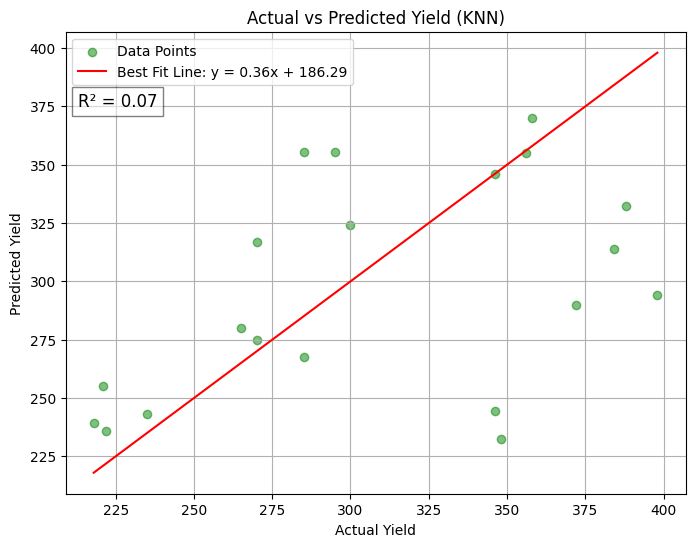


Lasso
R2: 0.05
MAE: 48.11
MSE: 3249.88
RMSE: 57.01


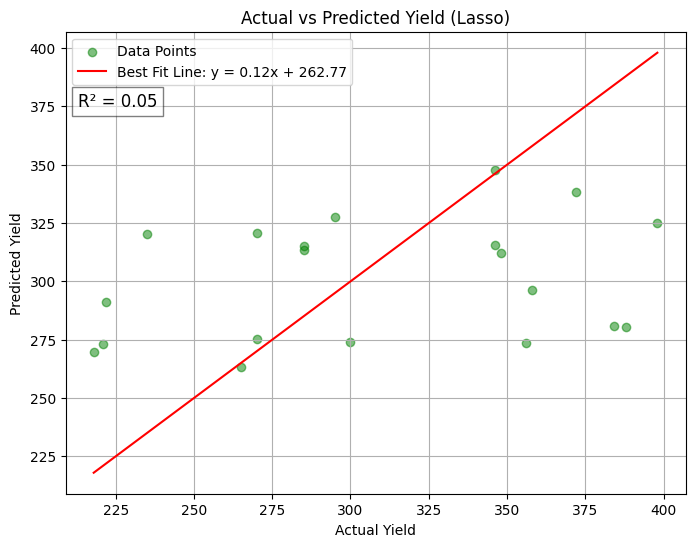


Decisin Tree regresson
R2: 0.95
MAE: 7.65
MSE: 180.85
RMSE: 13.45


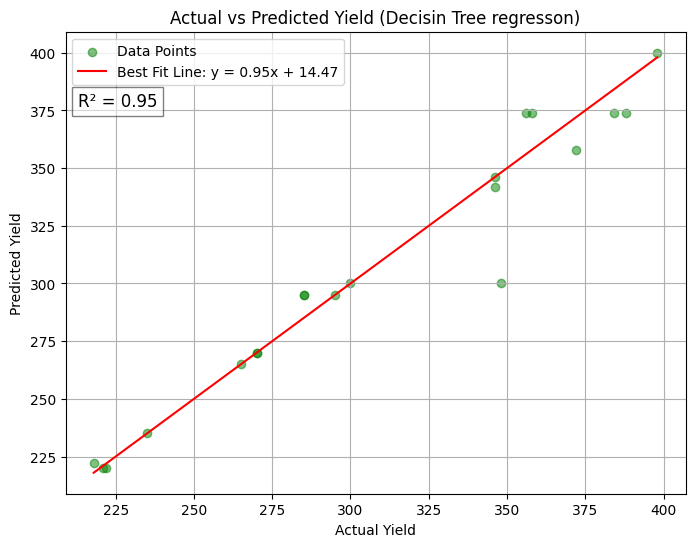


Random Forest Regressor
R2: 0.94
MAE: 11.06
MSE: 201.43
RMSE: 14.19


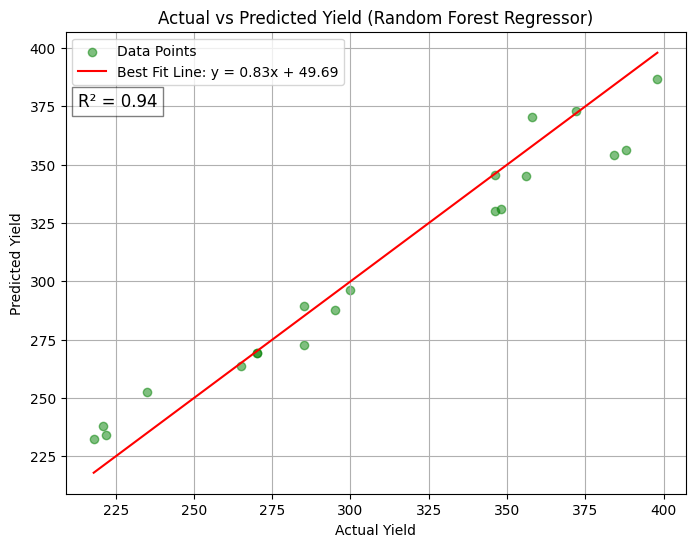


Gradient Boosting Regressor
R2: 0.98
MAE: 6.08
MSE: 58.31
RMSE: 7.64


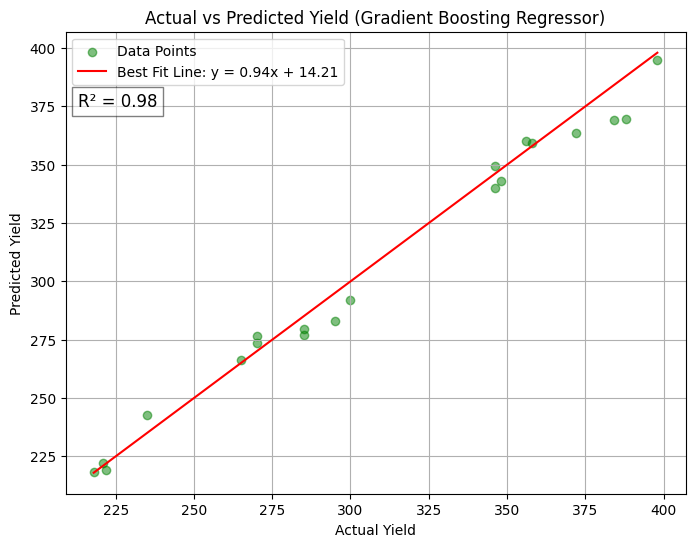


ExtraTrees Regressor
R2: 0.97
MAE: 7.93
MSE: 103.19
RMSE: 10.16


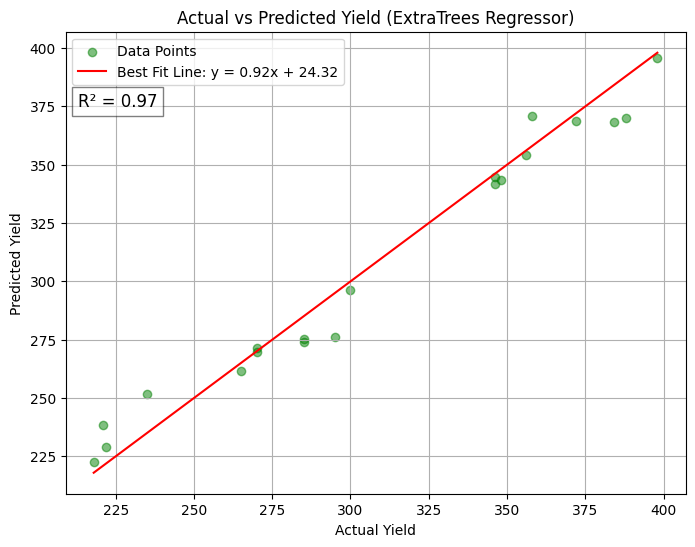


Bayesian Ridge
R2: 0.09
MAE: 47.87
MSE: 3088.14
RMSE: 55.57


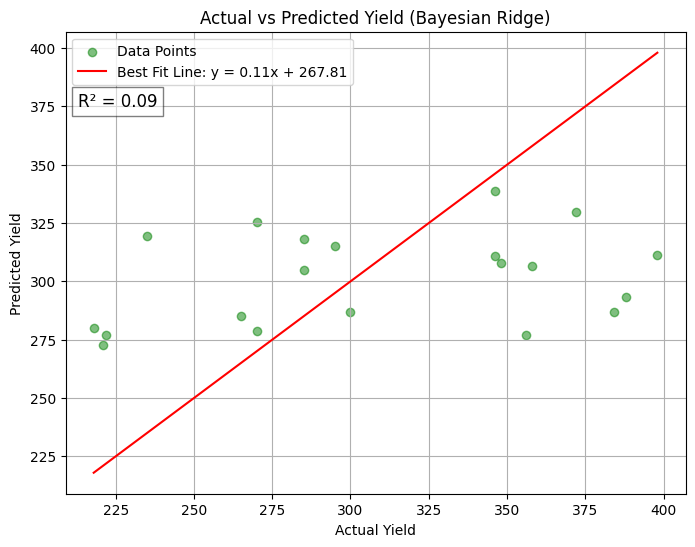


Elastic Net CV
R2: 0.11
MAE: 47.83
MSE: 3037.89
RMSE: 55.12


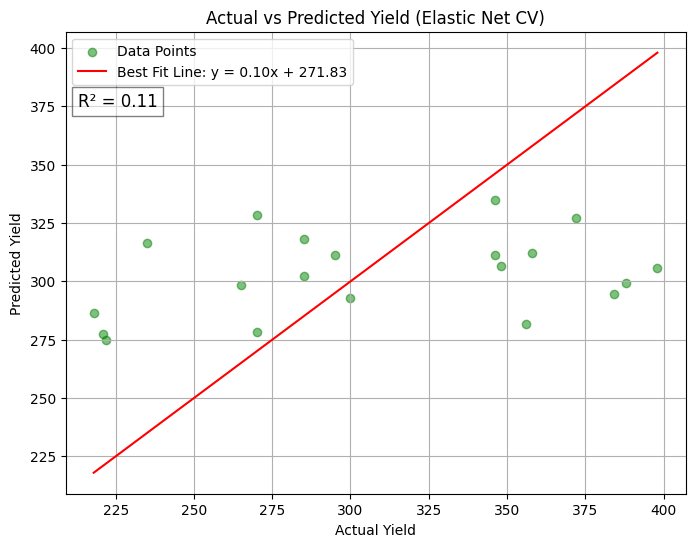

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.08
MAE: 45.40
MSE: 2991.46
RMSE: 54.69


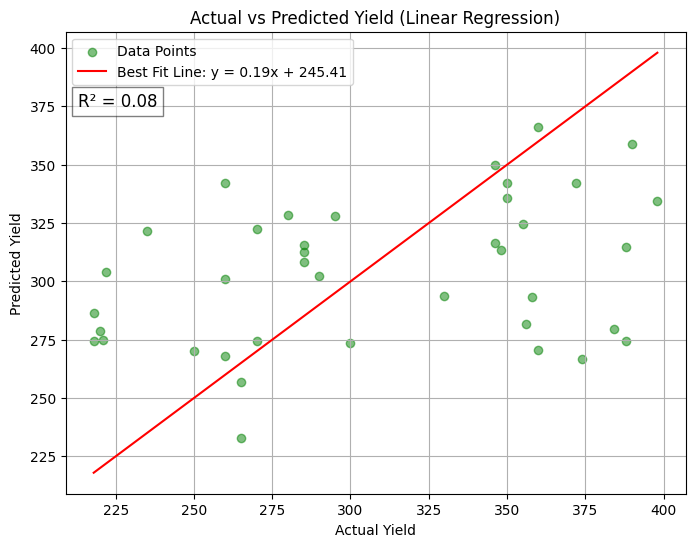


Supprt Vector Regressor
R2: 0.00
MAE: 51.16
MSE: 3244.58
RMSE: 56.96


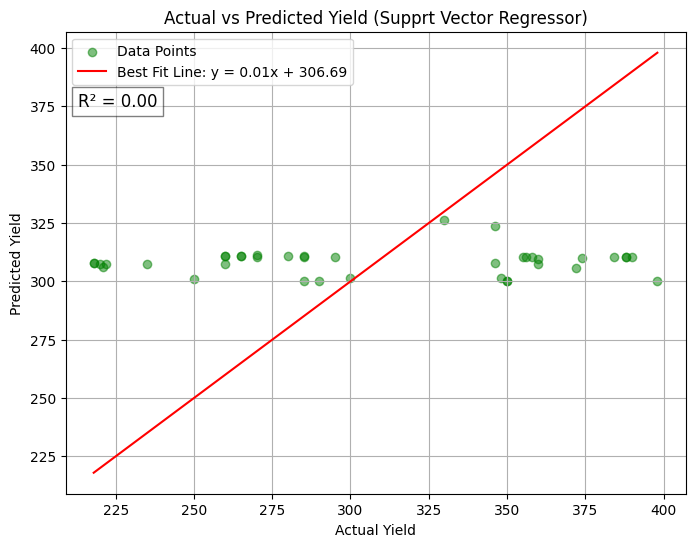


KNN
R2: 0.06
MAE: 42.35
MSE: 3070.21
RMSE: 55.41


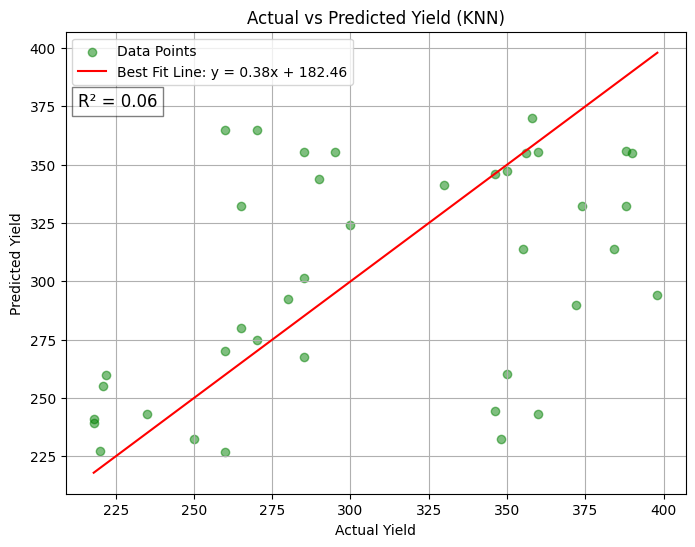


Lasso
R2: 0.08
MAE: 45.32
MSE: 2981.68
RMSE: 54.60


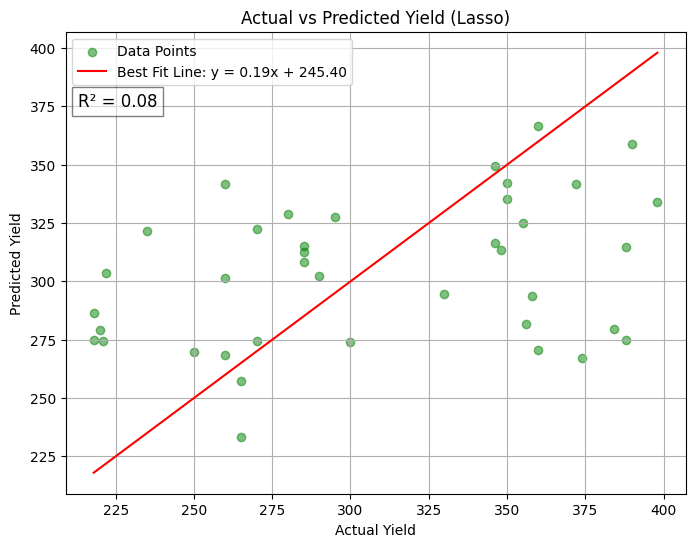


Decisin Tree regresson
R2: 0.91
MAE: 12.38
MSE: 304.13
RMSE: 17.44


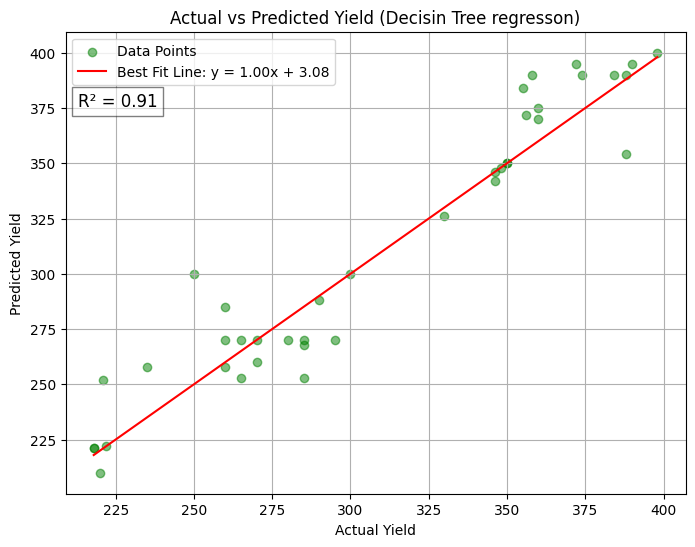


Random Forest Regressor
R2: 0.93
MAE: 11.73
MSE: 227.60
RMSE: 15.09


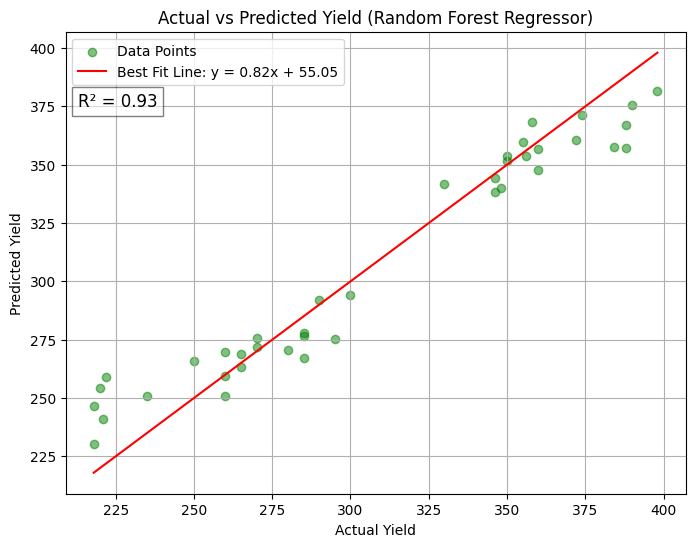


Gradient Boosting Regressor
R2: 0.94
MAE: 10.04
MSE: 198.91
RMSE: 14.10


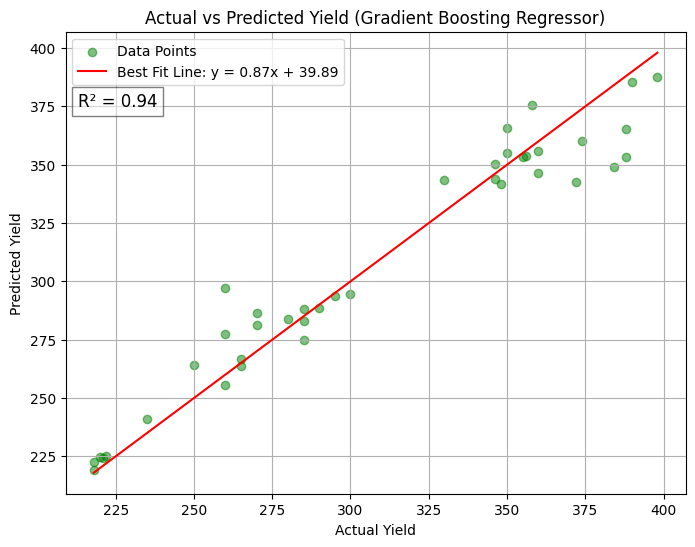


ExtraTrees Regressor
R2: 0.97
MAE: 7.80
MSE: 99.27
RMSE: 9.96


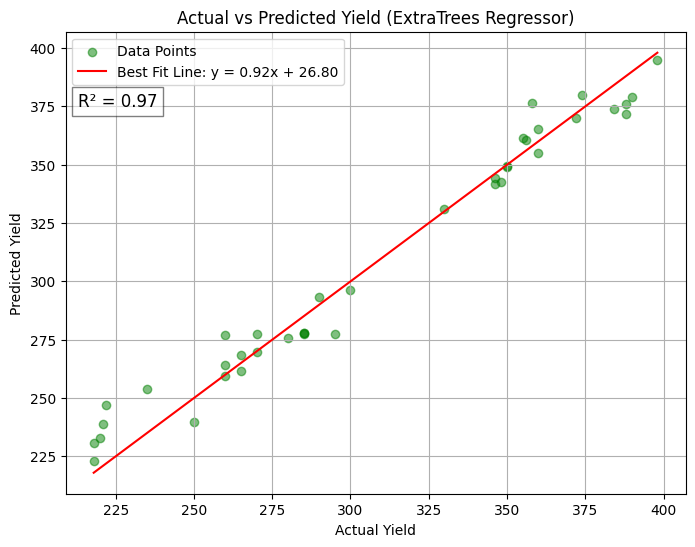


Bayesian Ridge
R2: 0.16
MAE: 44.53
MSE: 2735.98
RMSE: 52.31


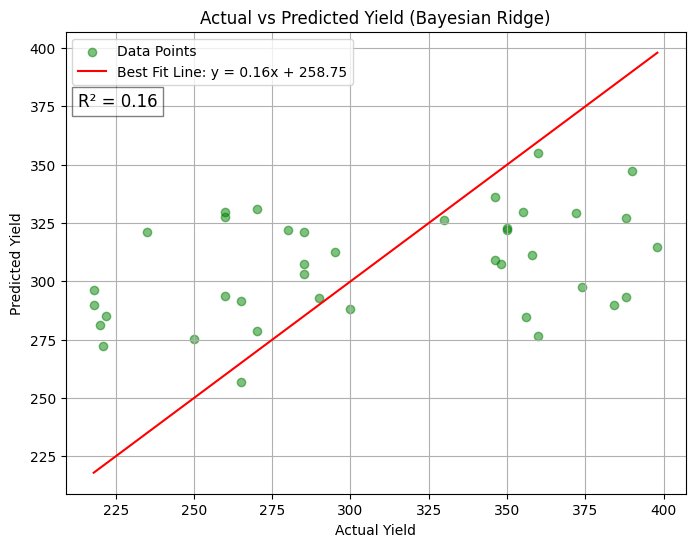


Elastic Net CV
R2: 0.14
MAE: 45.45
MSE: 2785.40
RMSE: 52.78


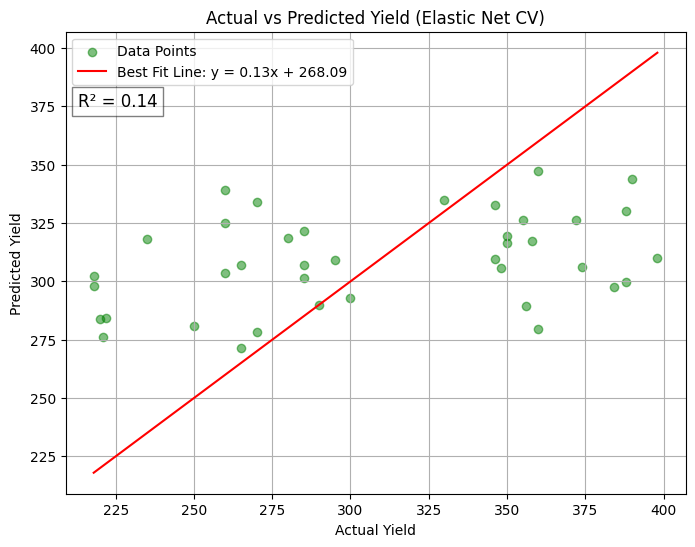

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: -0.03
MAE: 46.49
MSE: 3104.84
RMSE: 55.72


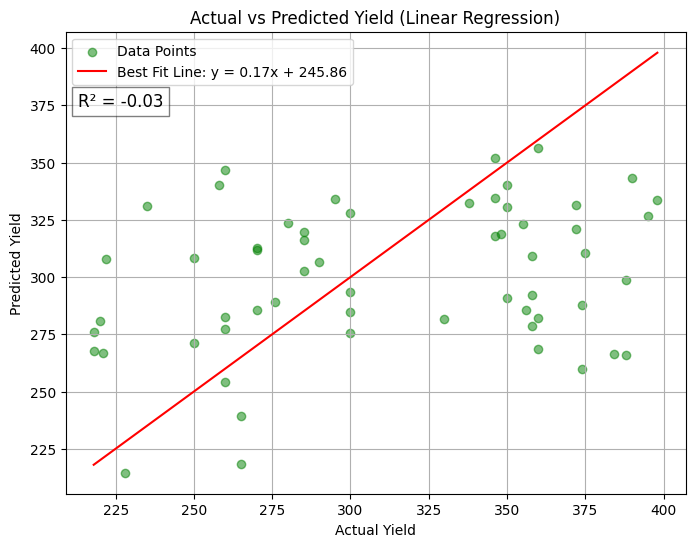


Supprt Vector Regressor
R2: 0.00
MAE: 48.85
MSE: 3027.00
RMSE: 55.02


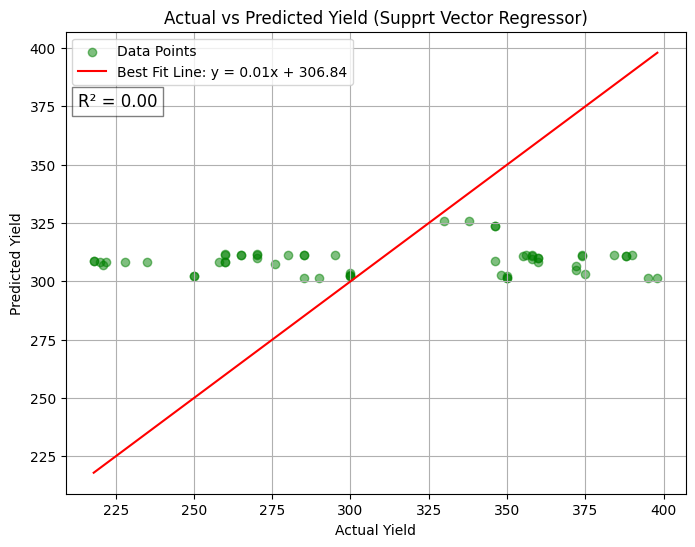


KNN
R2: -0.08
MAE: 44.23
MSE: 3263.62
RMSE: 57.13


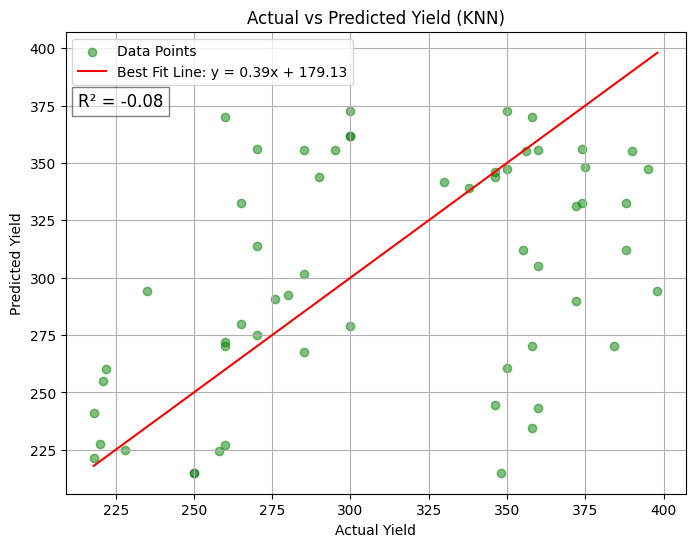


Lasso
R2: -0.02
MAE: 46.39
MSE: 3093.46
RMSE: 55.62


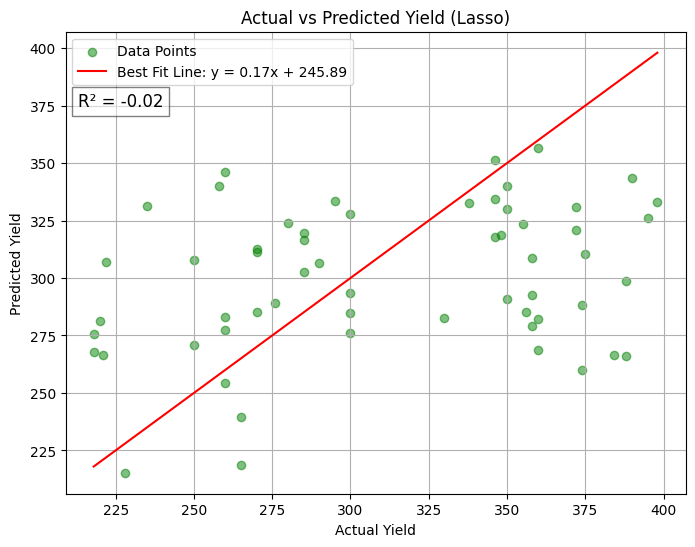


Decisin Tree regresson
R2: 0.87
MAE: 13.48
MSE: 407.03
RMSE: 20.18


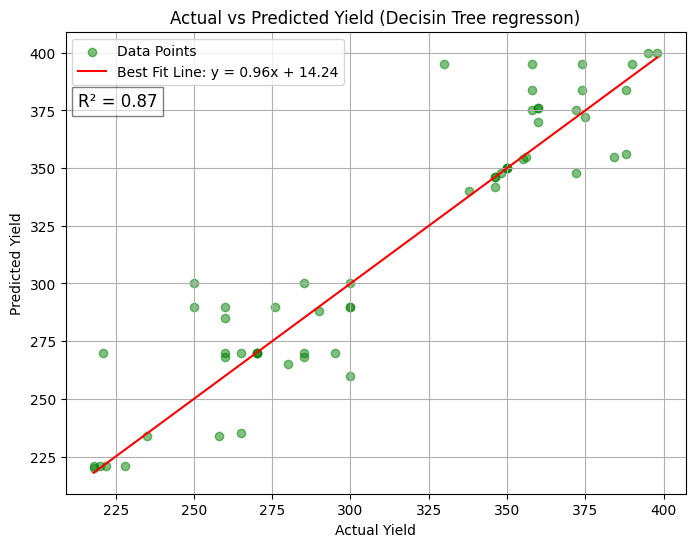


Random Forest Regressor
R2: 0.93
MAE: 11.24
MSE: 205.05
RMSE: 14.32


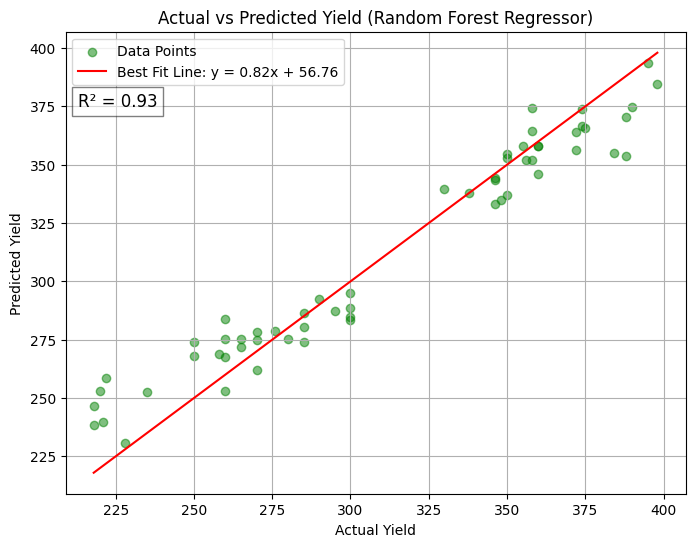


Gradient Boosting Regressor
R2: 0.92
MAE: 11.27
MSE: 228.12
RMSE: 15.10


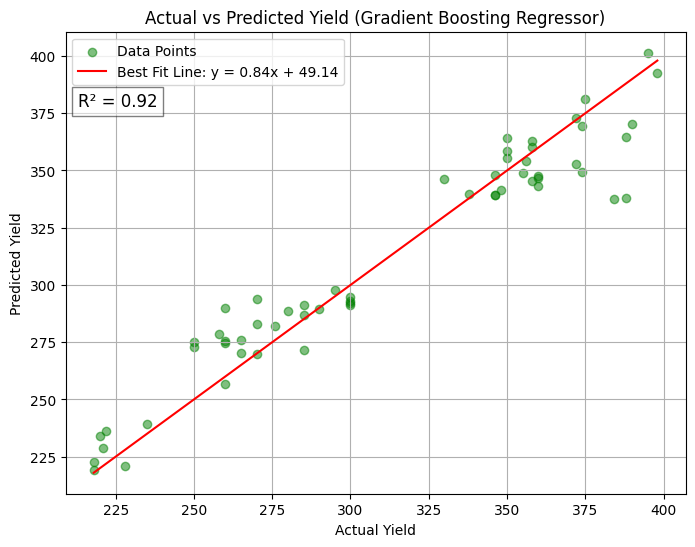


ExtraTrees Regressor
R2: 0.97
MAE: 6.86
MSE: 82.83
RMSE: 9.10


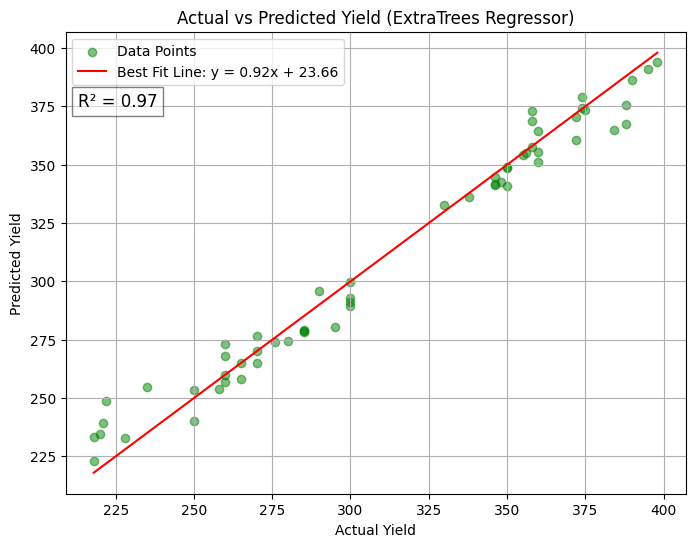


Bayesian Ridge
R2: 0.14
MAE: 43.82
MSE: 2617.33
RMSE: 51.16


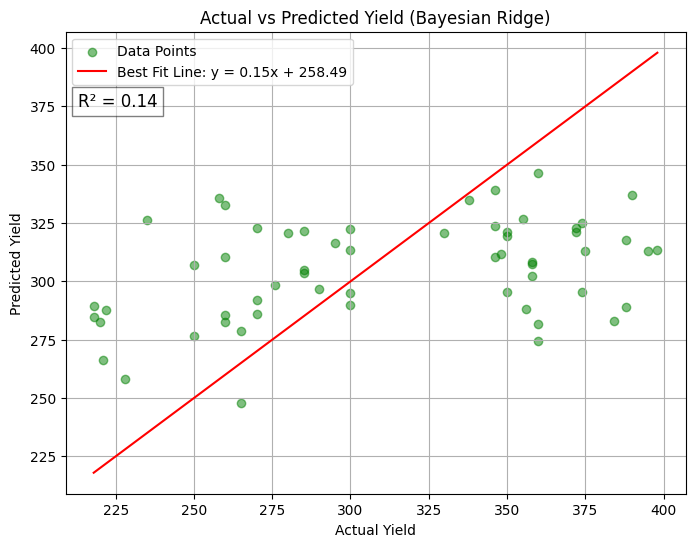


Elastic Net CV
R2: 0.14
MAE: 44.18
MSE: 2602.54
RMSE: 51.02


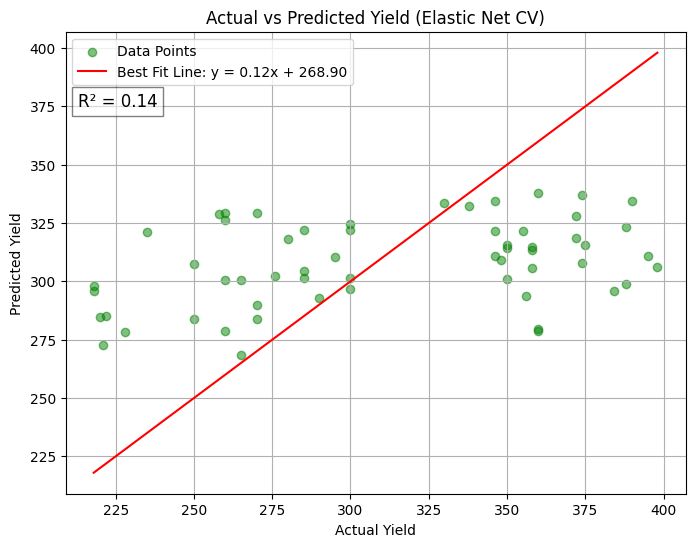

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.01
MAE: 41.28
MSE: 2660.48
RMSE: 51.58


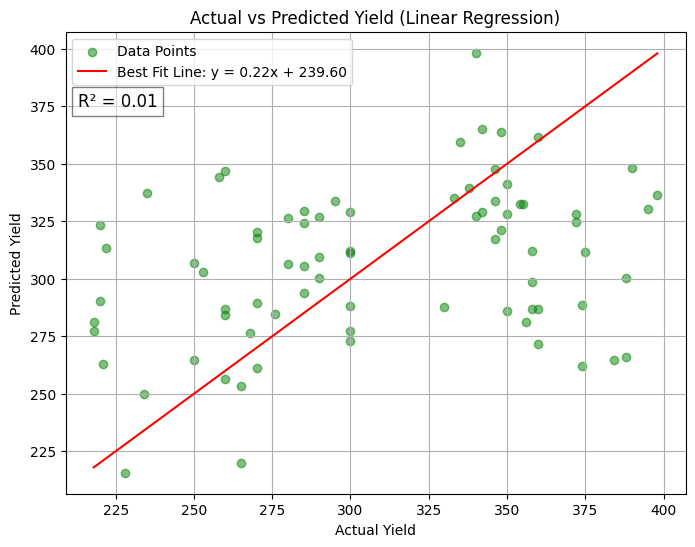


Supprt Vector Regressor
R2: -0.02
MAE: 45.37
MSE: 2739.86
RMSE: 52.34


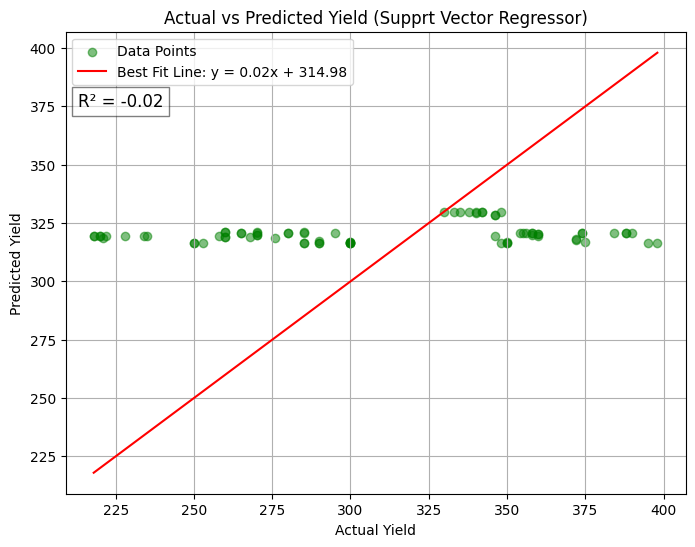


KNN
R2: 0.03
MAE: 38.20
MSE: 2610.23
RMSE: 51.09


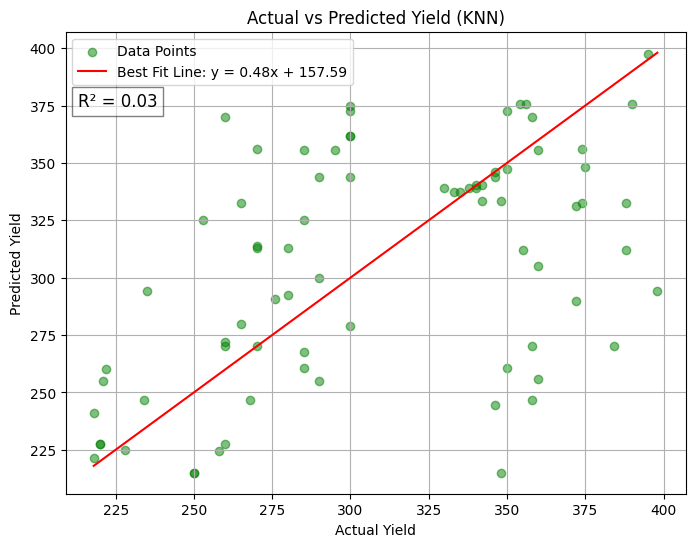


Lasso
R2: 0.01
MAE: 41.24
MSE: 2652.06
RMSE: 51.50


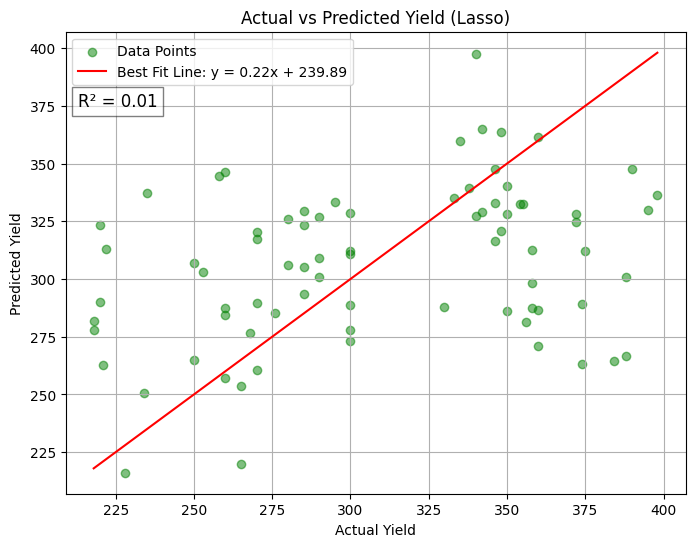


Decisin Tree regresson
R2: 0.90
MAE: 11.36
MSE: 274.32
RMSE: 16.56


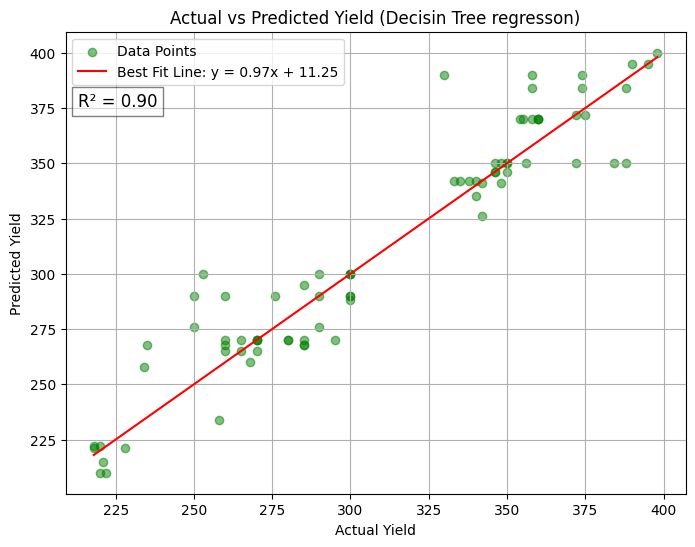


Random Forest Regressor
R2: 0.93
MAE: 11.09
MSE: 198.22
RMSE: 14.08


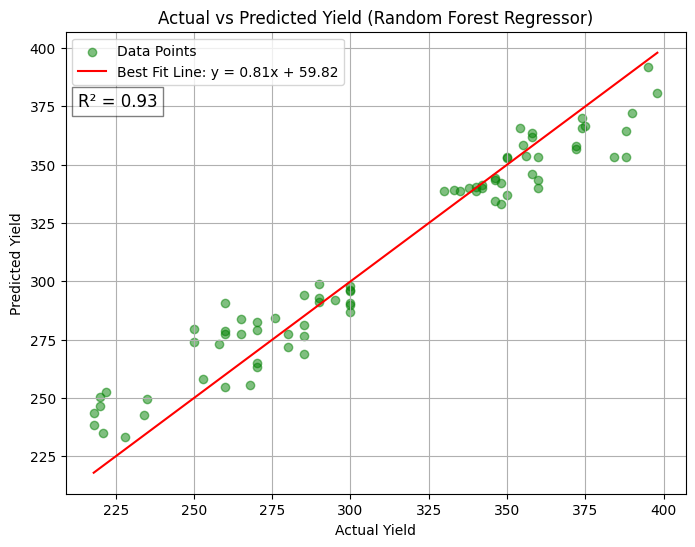


Gradient Boosting Regressor
R2: 0.94
MAE: 8.65
MSE: 164.31
RMSE: 12.82


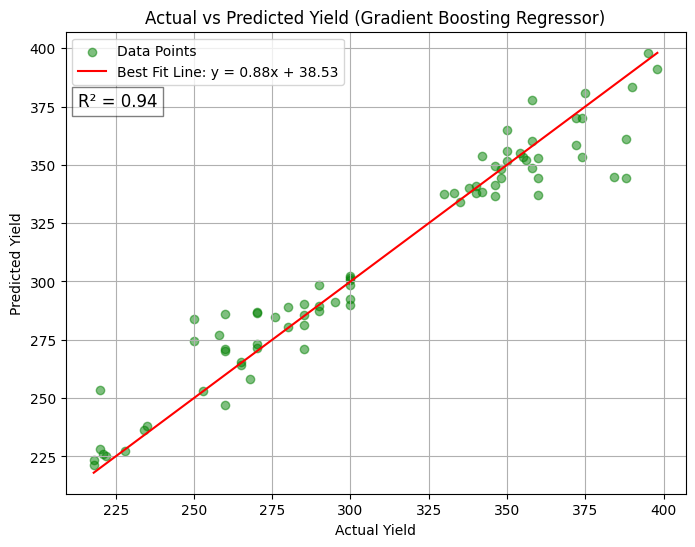


ExtraTrees Regressor
R2: 0.97
MAE: 6.75
MSE: 77.61
RMSE: 8.81


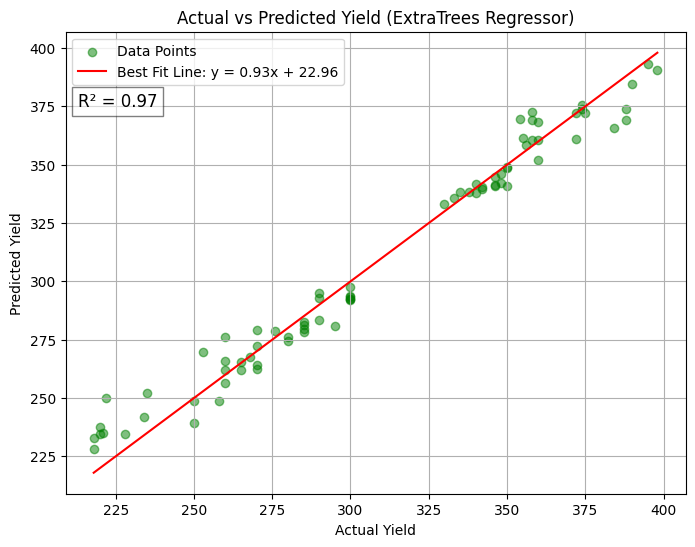


Bayesian Ridge
R2: 0.14
MAE: 40.11
MSE: 2307.47
RMSE: 48.04


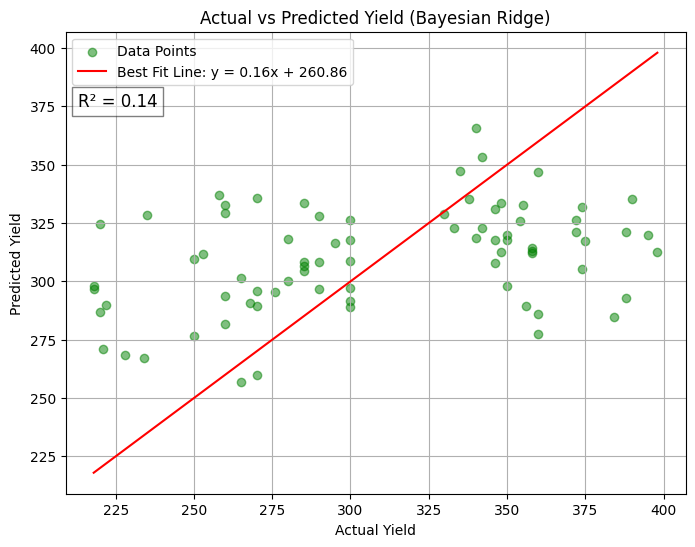


Elastic Net CV
R2: 0.12
MAE: 40.12
MSE: 2372.75
RMSE: 48.71


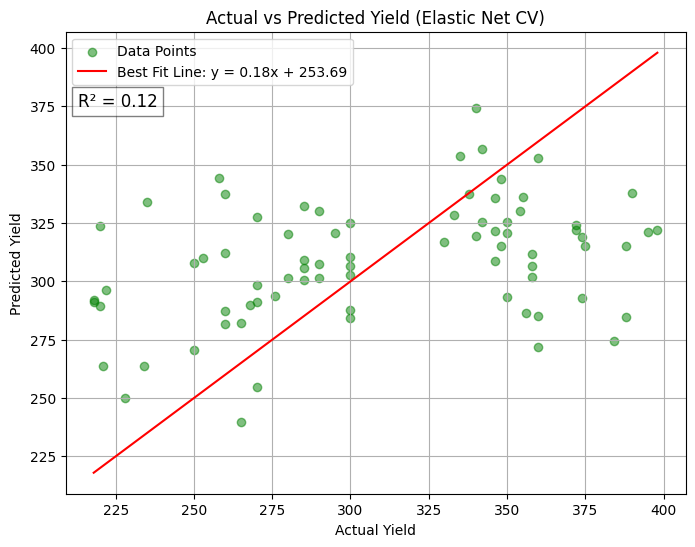

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
regression(X_train, X_test, y_train, y_test)

Linear Regression
R2: 0.08
MAE: 40.49
MSE: 2457.69
RMSE: 49.58


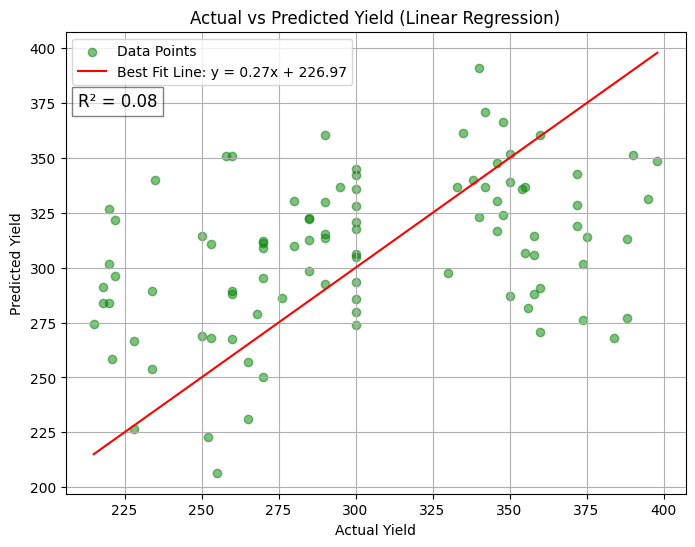


Supprt Vector Regressor
R2: -0.56
MAE: 53.44
MSE: 4181.60
RMSE: 64.67


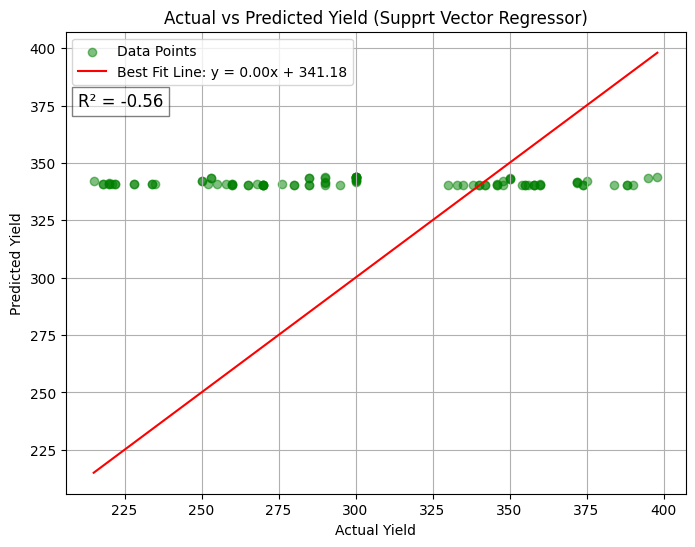


KNN
R2: 0.13
MAE: 36.11
MSE: 2331.88
RMSE: 48.29


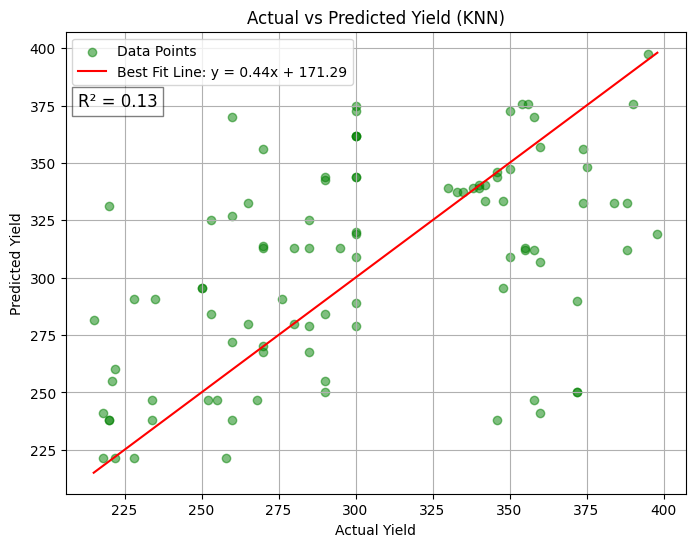


Lasso
R2: 0.09
MAE: 40.46
MSE: 2453.43
RMSE: 49.53


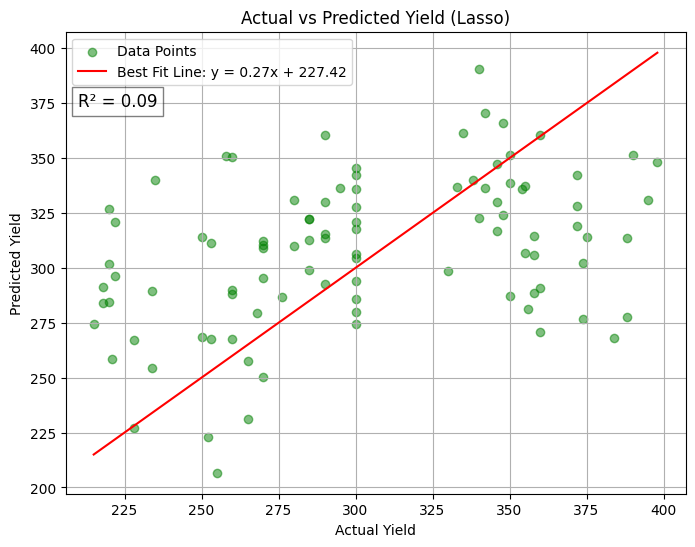


Decisin Tree regresson
R2: 0.81
MAE: 15.00
MSE: 499.62
RMSE: 22.35


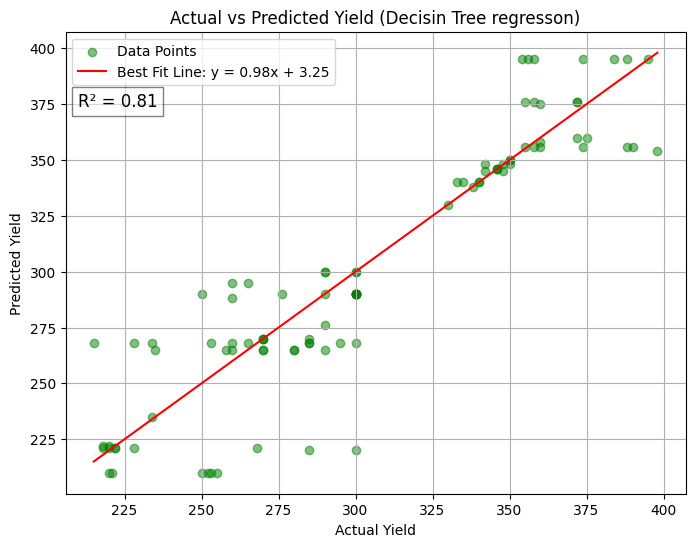


Random Forest Regressor
R2: 0.86
MAE: 13.24
MSE: 378.49
RMSE: 19.45


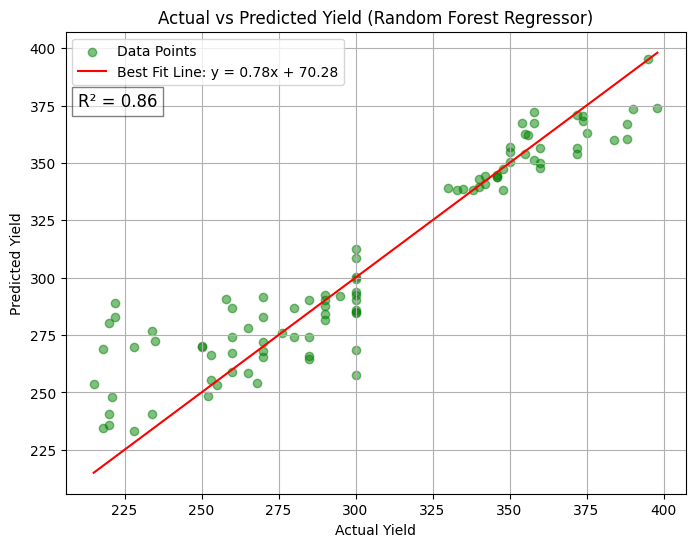


Gradient Boosting Regressor
R2: 0.90
MAE: 10.73
MSE: 266.72
RMSE: 16.33


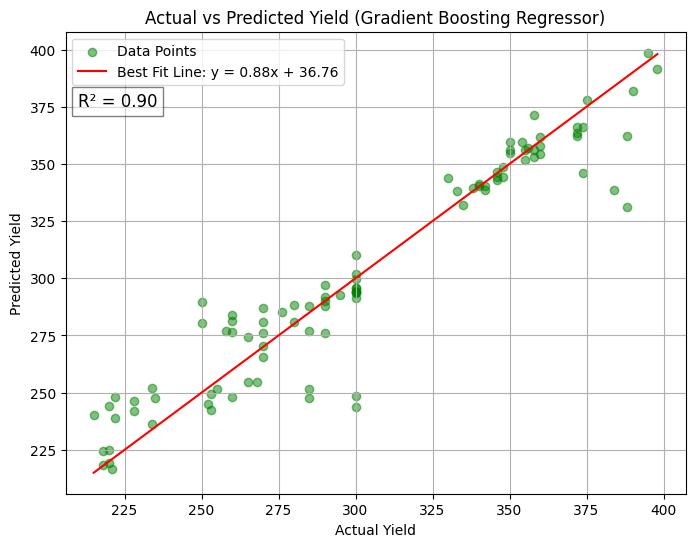


ExtraTrees Regressor
R2: 0.94
MAE: 9.24
MSE: 163.29
RMSE: 12.78


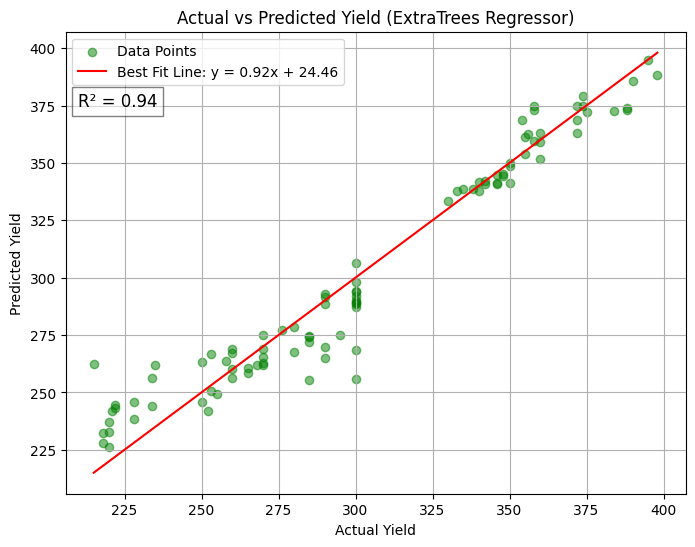


Bayesian Ridge
R2: -0.13
MAE: 48.44
MSE: 3021.83
RMSE: 54.97


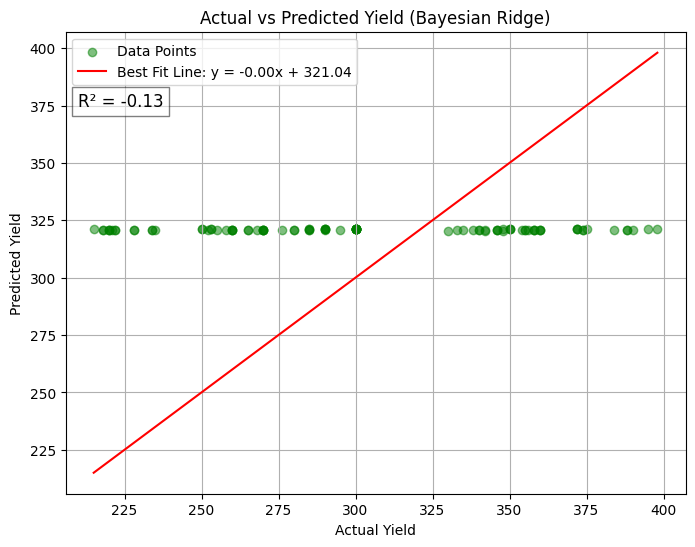


Elastic Net CV
R2: 0.13
MAE: 40.22
MSE: 2347.47
RMSE: 48.45


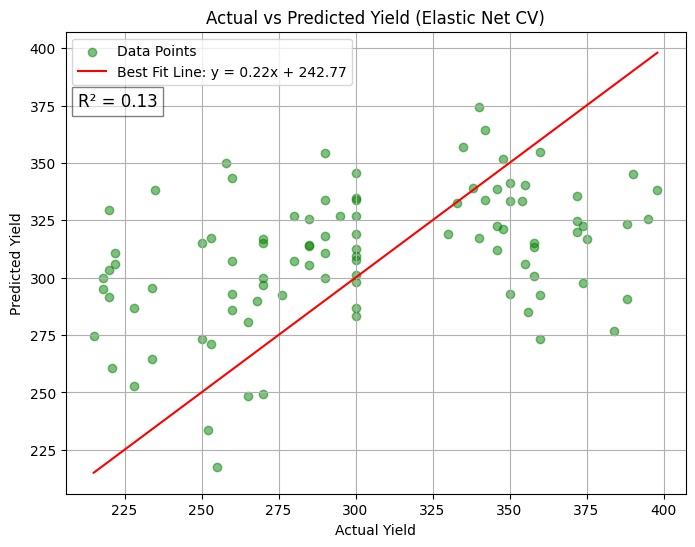

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
regression(X_train, X_test, y_train, y_test)

# **BoxPlot**

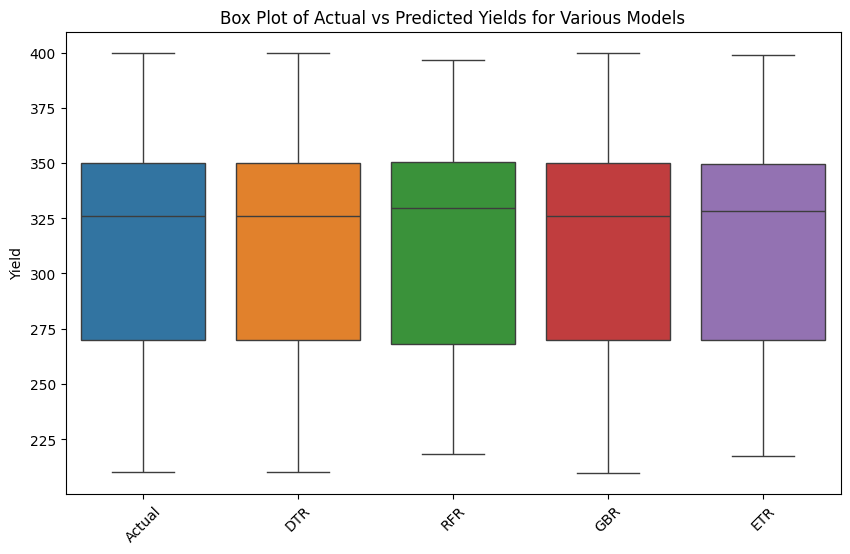


Descriptive statistics for Actual and Predicted values:
           Actual         DTR         RFR         GBR         ETR
count  153.000000  153.000000  153.000000  153.000000  153.000000
mean   312.777778  312.777778  312.575359  312.777778  312.777778
std     53.065280   53.065280   50.128462   53.053400   52.291288
min    210.000000  210.000000  218.330000  209.927778  217.201667
25%    270.000000  270.000000  268.230000  269.925976  269.855167
50%    326.000000  326.000000  329.425000  326.019626  328.417667
75%    350.000000  350.000000  350.270000  350.037341  349.668167
max    400.000000  400.000000  396.655000  400.000221  398.768333

Skewness for Actual and Predicted values:
Actual   -0.20
DTR      -0.20
RFR      -0.13
GBR      -0.20
ETR      -0.16
dtype: float64

Kurtosis for Actual and Predicted values:
Actual   -1.01
DTR      -1.01
RFR      -1.20
GBR      -1.01
ETR      -1.10
dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

# # Load your dataset (replace with your actual dataset)
# data = pd.read_excel('/path_to_your_dataset.xlsx')

# Split the data into features and target
X = data3.drop(columns=["Yeild"])  # Features
y = data3["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the models
models = {
        'DTR':DecisionTreeRegressor(random_state=0),
        'RFR': RandomForestRegressor(n_estimators=200),
        'GBR': GradientBoostingRegressor(n_estimators=500),
        'ETR': ExtraTreesRegressor(n_estimators=500, min_samples_split=5),
}

# Dictionary to store predictions
predictions = {}

# Train each model and make predictions
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)  # Predictions on training data
    predictions[model_name] = y_pred_train  # Store predictions

# Combine actual and predicted values into a DataFrame for plotting
results = pd.DataFrame({
    'Actual': y_train
})

# Add predictions for each model
for model_name, y_pred_train in predictions.items():
    results[model_name] = y_pred_train

# Plot the box plots for actual vs predicted yields
plt.figure(figsize=(10, 6))
sns.boxplot(data=results)
plt.title('Box Plot of Actual vs Predicted Yields for Various Models')
plt.ylabel('Yield')
plt.xticks(rotation=45)
plt.show()

# Print the descriptive statistics for the actual and predicted values
print("\nDescriptive statistics for Actual and Predicted values:")
print(results.describe())

# Calculate and print skewness and kurtosis for actual and predicted values
print("\nSkewness for Actual and Predicted values:")
print(results.apply(lambda x: skew(x.dropna())).round(2))

print("\nKurtosis for Actual and Predicted values:")
print(results.apply(lambda x: kurtosis(x.dropna())).round(2))


# **Result Analysis**

In [14]:
dtr = DecisionTreeRegressor()
dtr.fit(X_train,y_train)
dtr.predict(X_test)

array([265., 252., 350., 222., 340., 360., 340., 400., 300., 350., 290.,
       340., 270., 358., 268., 358., 222., 346., 350., 270., 265., 270.,
       346., 400., 300., 384., 395., 265., 340., 221., 268., 276., 342.,
       355., 300., 265., 290., 356., 258.])

In [15]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()
etr.fit(X_train,y_train)
etr.predict(X_test)

array([283.58, 249.24, 337.73, 225.88, 338.79, 370.25, 340.26, 392.02,
       298.55, 356.54, 287.09, 340.71, 268.92, 362.48, 270.74, 331.77,
       227.32, 345.93, 349.63, 278.62, 250.5 , 268.34, 344.05, 389.98,
       297.79, 377.91, 388.81, 264.92, 337.4 , 227.07, 270.48, 299.54,
       338.  , 368.07, 297.58, 255.95, 284.85, 348.88, 256.64])

In [16]:
def prediction(yearFrom, yearTo, month, fort_night, CLR_Incidence, T_max,T_min,RH, RF, OC, P, K, pH, spacing, Age):
    features = np.array([[yearFrom, yearTo, month, fort_night, CLR_Incidence, T_max,T_min, RH, RF, OC, P, K, pH, spacing, Age]], dtype = object)
    transform_features = scaler.transform(features)
    predicted_yeild = etr.predict(transform_features).reshape(-1,1)
    return predicted_yeild[0][0]

In [ ]:
data

,yearFrom,yearTo,month,fort_night,CLR_Incidence,T_max,T_min,RH,RF,%OC,P,K,pH,spacing,Age,Yeild
0,2015,2016,3,0,1.91,29.88,19.07,82.07,76.1,7.50,18.0,286.0,7.0,81,70,300
1,2015,2016,3,1,4.96,29.67,18.97,83.47,193.7,6.60,78.0,63.0,5.5,36,80,290
2,2015,2016,4,0,5.52,29.67,18.93,84.20,288.7,6.60,77.0,125.0,6.0,81,67,285
3,2015,2016,4,1,10.26,29.50,19.47,85.94,318.3,6.60,69.0,338.0,5.8,81,15,268
4,2015,2016,5,0,22.88,28.80,19.40,83.87,321.1,6.60,16.0,163.0,5.6,36,15,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2022,2023,0,1,8.45,29.03,13.50,85.50,3859.8,4.01,92.0,408.0,5.5,200,10,326
188,2022,2023,1,0,4.08,31.30,16.23,67.46,3859.8,4.01,92.0,600.0,5.7,25,26,341
189,2022,2023,1,1,1.20,32.07,15.26,72.69,3859.8,4.01,92.0,612.0,4.7,25,31,342
190,2022,2023,2,0,0.00,33.30,16.73,87.60,3859.8,4.01,91.0,464.0,5.9,25,22,345


In [19]:
result = prediction(2015,2016,3,1,4,29,18,83,193,6,78,63,5,36,80)
result


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


291.43

In [22]:
import pickle
pickle.dump(etr,open('etr.pkl','wb'))
pickle.dump(scaler,open('etr.pkl','wb'))


# **Feature Selection**


In [ ]:
data.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')

# Assuming 'Yield' is the target column, and the rest are features
X = data1.drop(columns=["Yeild"])  # Features
y = data1["Yeild"]  # Target variable

#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=f_regression, k=15)
fit = bestfeatures.fit(X,y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns

featureScores



,Specs,Score
0,yearFrom,27.293672
1,yearTo,27.293672
2,month,0.133011
3,fort_night,0.006847
4,CLR_Incidence,3.638320
5,T_max,2.560841
6,T_min,0.241832
7,RH,4.462597
8,RF,0.731099
9,%OC,5.538684


In [ ]:
print(featureScores.nlargest(10,'Score'))  #print 10 best features

            Specs      Score
0        yearFrom  27.293672
1          yearTo  27.293672
12             pH   8.880588
11              K   5.848685
9             %OC   5.538684
7              RH   4.462597
4   CLR_Incidence   3.638320
10              P   2.934532
5           T_max   2.560841
8              RF   0.731099


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [ ]:
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

[0.03010254 0.02861472 0.10614437 0.04178391 0.0637293  0.1138041
 0.11368211 0.12839327 0.12998008 0.0393018  0.0505862  0.03936359
 0.04437642 0.03315111 0.03698647]


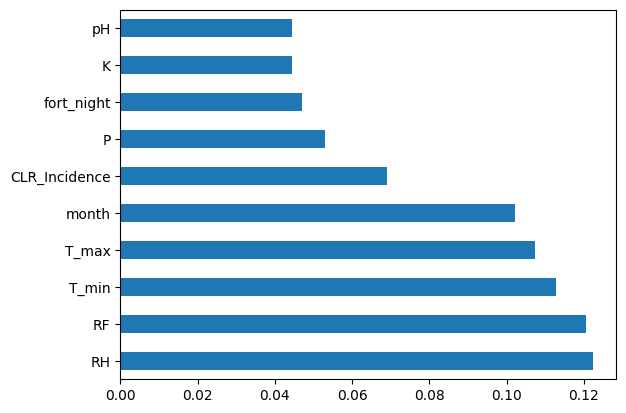

In [ ]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

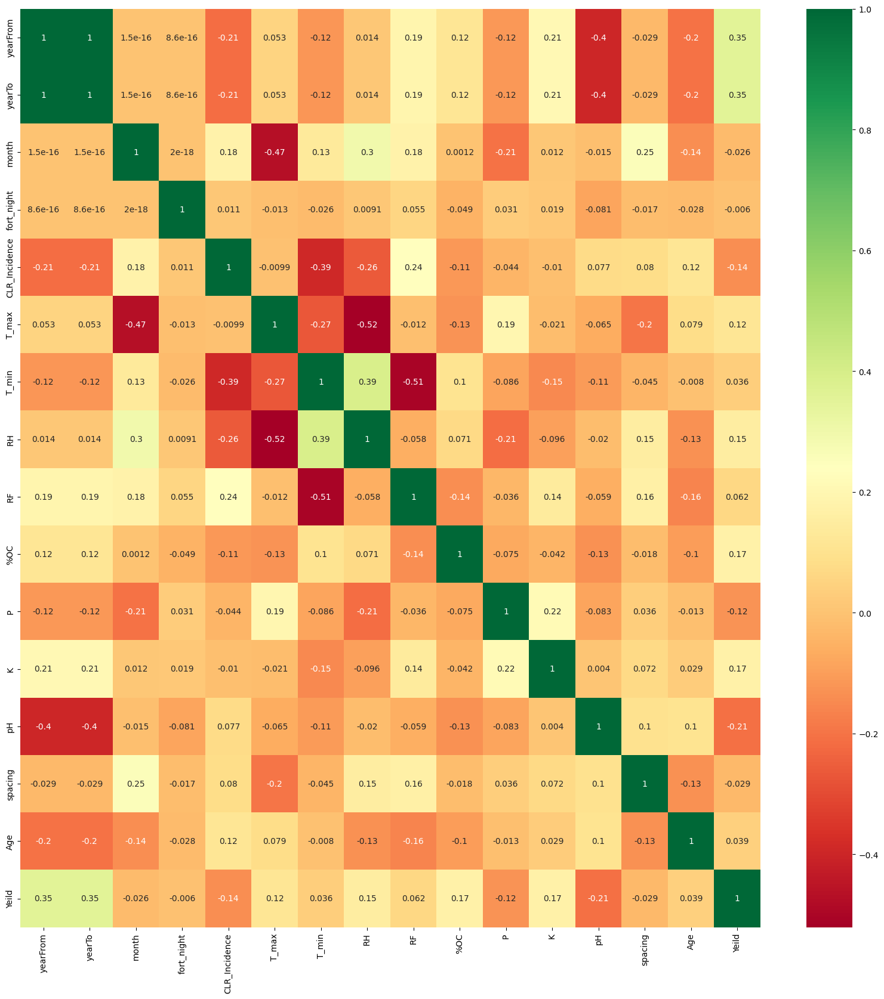

In [ ]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [ ]:
data.columns

Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age', 'Yeild'],
      dtype='object')

yearFrom: 0.1852
yearTo: 0.2126
month: 0.0116
fort_night: 0.0019
CLR_Incidence: 0.2640
T_max: 0.0168
T_min: 0.0218
RH: 0.0468
RF: 0.0438
%OC: 0.1003
P: 0.0307
K: 0.0179
pH: 0.0124
spacing: 0.0120
Age: 0.0222


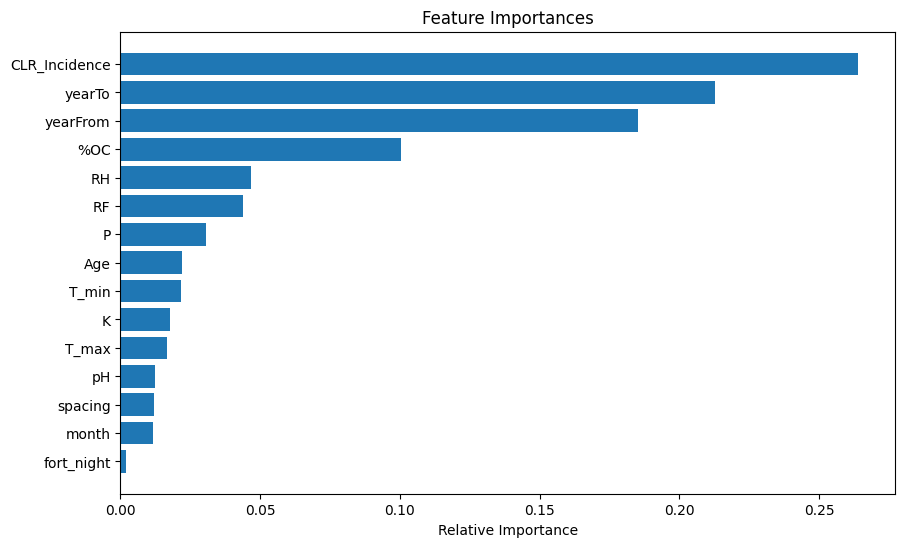

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')

# Assuming 'Yield' is the target column, and the rest are features
X = data.drop(columns=["Yeild"])  # Features
y = data["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_

# Print feature importance
for feature, importance in zip(X.columns, importances):
    print(f"{feature}: {importance:.4f}")

# Plotting feature importances
import matplotlib.pyplot as plt
indices = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [X.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


# **Recursive Feature Elimination**

Selected Features: Index(['yearFrom', 'yearTo', 'CLR_Incidence', 'RF', '%OC'], dtype='object')
Mean Squared Error: 136.32233448275863
R-squared: 0.954969003019196


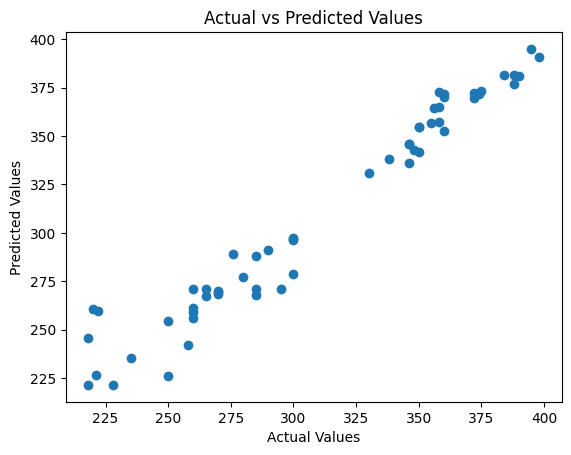

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')

# Assuming 'Yield' is the target column, and the rest are features
X = data.drop(columns=["Yeild"])  # Features
y = data["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model (e.g., Linear Regression)
model = RandomForestRegressor()

# Define the number of features to select
k = 5  # You can specify the number of features you want to select

# Use RFE to select top k features
selector = RFE(model, n_features_to_select=k)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

# Get selected feature names
selected_features = X.columns[selector.get_support()]
print(f"Selected Features: {selected_features}")

# Train the model on selected features
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_test_selected)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot the predictions vs actual values
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

Selected Features: Index(['yearFrom', 'yearTo', 'month', 'CLR_Incidence', 'T_min', 'RH', 'RF',
       '%OC', 'P', 'Age'],
      dtype='object')
Mean Squared Error: 275.3015275862069
R-squared: 0.9090603729419471


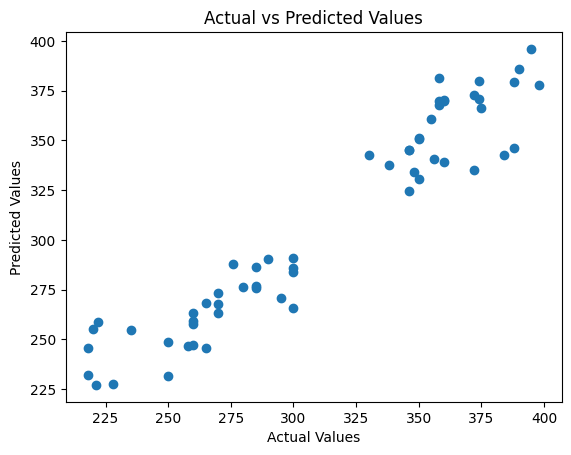

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')

# Assuming 'Yield' is the target column, and the rest are features
X = data.drop(columns=["Yeild"])  # Features
y = data["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model (e.g., Linear Regression)
model = RandomForestRegressor()

# Define the number of features to select
k = 10  # You can specify the number of features you want to select

# Use RFE to select top k features
selector = RFE(model, n_features_to_select=k)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

# Get selected feature names
selected_features = X.columns[selector.get_support()]
print(f"Selected Features: {selected_features}")

# Train the model on selected features
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_test_selected)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot the predictions vs actual values
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

Selected Features: Index(['yearFrom', 'yearTo', 'month', 'fort_night', 'CLR_Incidence', 'T_max',
       'T_min', 'RH', 'RF', '%OC', 'P', 'K', 'pH', 'spacing', 'Age'],
      dtype='object')
Mean Squared Error: 265.30705344827584
R-squared: 0.9123618212074682


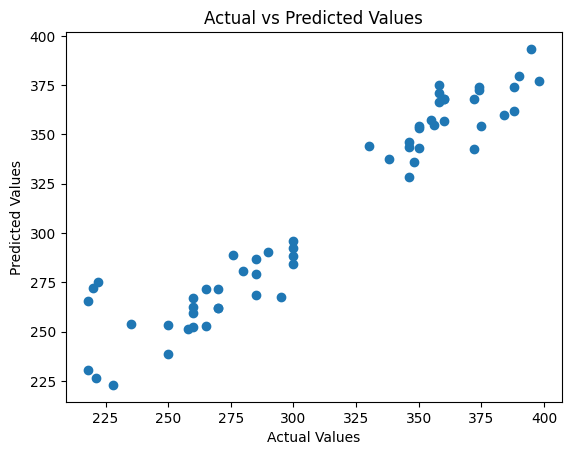

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')

# Assuming 'Yield' is the target column, and the rest are features
X = data.drop(columns=["Yeild"])  # Features
y = data["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model (e.g., Linear Regression)
model = RandomForestRegressor()

# Define the number of features to select
k = 15  # You can specify the number of features you want to select

# Use RFE to select top k features
selector = RFE(model, n_features_to_select=k)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

# Get selected feature names
selected_features = X.columns[selector.get_support()]
print(f"Selected Features: {selected_features}")

# Train the model on selected features
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_test_selected)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot the predictions vs actual values
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

## **Feature Importance**

          Feature  Importance
0        yearFrom    0.289909
1          yearTo    0.273018
9             %OC    0.132727
8              RF    0.078817
4   CLR_Incidence    0.073196
14            Age    0.040005
7              RH    0.031934
10              P    0.018430
2           month    0.016432
6           T_min    0.013170
5           T_max    0.009747
11              K    0.009581
13        spacing    0.006684
12             pH    0.005863
3      fort_night    0.000485


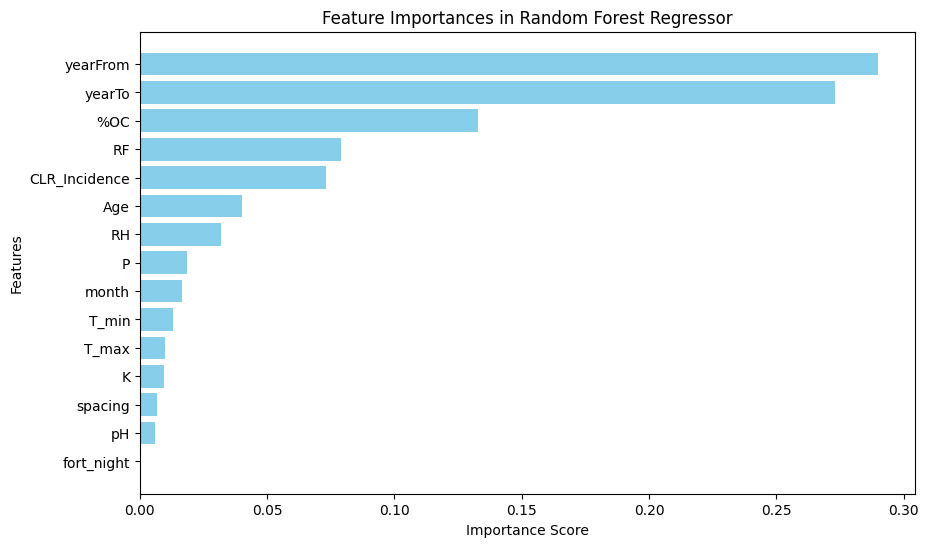

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Load and prepare the data
# data = pd.read_csv('your_dataset.csv')
# Assuming 'Yield' is the target column, and the rest are features
X = data.drop(columns=["Yeild"])  # Features
y = data["Yeild"]  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train the Random Forest Regressor
model = RandomForestRegressor(n_estimators=200, random_state=42)
model.fit(X_train, y_train)

# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame for better visualization
features = X.columns
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(importance_df)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Feature Importances in Random Forest Regressor')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()
